In [2]:
import gym
from gym import spaces
import time

import numpy as np
import mpmath as mp
from scipy.special import hyp2f1
from numpy.random import choice
import math

import pandas as pd
import cvxpy as cp

class CFTEnv(gym.Env):
    metadata = {'render.modes': ['console']}

    def __init__(
        self,
        num_states: dict,
        low_deltas: list,
        dphi:float = 1,
        min_delta:float = 2, max_delta:float = 10,
        # std_list:list=[0.5,0.3,0.1,0.01],
        lr:float = 0.1, z_lr:float = 0.5, 
        max_episode_step:int = 30,
    ):
        self.data_type = np.float32

        self.num_states = num_states
        self.num_active_states=num_states-len(low_deltas)
        self.low_deltas = low_deltas
        self.num_low_deltas = len(low_deltas)
        self.dphi = dphi
        
        self.min_c, self.max_c = -5, 5
        self.max_delta, self.min_delta, self.ddelta = max_delta, min_delta, max_delta-min_delta
        self.reward = -1
        
        self.z_min, self.num_z_partition, self.z_lr = 0.4, 20, z_lr
        self.num_zs = self.num_z_partition * self.num_states

        self.z_list = np.linspace(self.z_min, 0.49, self.num_zs)

        self.num_delta_sampling = 1
        self.num_sampling = 10
        self.extra_rewards = 1
        self.reward_scale = 1_000
        self.delta_lr= lr
        self.num_step, self.max_episode_step = 0, max_episode_step

        self.deltas = (self.max_delta - self.min_delta) * np.random.rand(self.num_states) + self.min_delta
        self.initial_delta_list = np.linspace(self.min_delta+0.05, self.max_delta, (self.max_delta-self.min_delta)*10)
        # self.initial_states = np.array(
        #     [
        #         [d1, d2]
        #         for i, d1 in enumerate(self.initial_delta_list)
        #         for d2 in self.initial_delta_list[(i+1):]
        #     ]
        # )
        
        # self.initial_states = np.array(
        #     [
        #         [round(d1, 2), round(d2, 2)]
        #         for d1 in np.linspace(min_delta, max_delta, 21)
        #         for d2 in np.linspace(min_delta, max_delta, 21)
        #         # for d1 in np.linspace(min_delta, 0.5*(min_delta+max_delta), 11)
        #         # for d2 in np.linspace(0.5*(min_delta+max_delta)+0.05, max_delta, 10)
        #     ]
        # )
        
        initial_states = np.array(
            [
                [round(d1, 2), round(d2, 2)]
                for d1 in np.linspace(min_delta, max_delta, 21)
                for d2 in np.linspace(min_delta, max_delta, 21)
                # for d1 in np.linspace(min_delta, 0.5*(min_delta+max_delta), 11)
                # for d2 in np.linspace(0.5*(min_delta+max_delta)+0.05, max_delta, 10)
            ]
        )
        self.initial_states=[]
        for d1, d2 in initial_states:
            if d2>d1:
                self.initial_states.append([d1,d2])

        self.dist = 1e8
        self.punish = -1e8
        self.episode_count = 0

        action_low = np.concatenate([np.zeros(self.num_active_states, dtype=self.data_type)])
        action_high = np.concatenate([np.ones(self.num_active_states, dtype=self.data_type)])
        obs_low=np.array([self.min_delta for _ in range(self.num_states)]+[self.min_c for _ in range(self.num_states)]+[0],dtype=self.data_type)
        obs_high=np.array([self.max_delta for _ in range(self.num_states)]+[self.max_c for _ in range(self.num_states)]+[np.inf],dtype=self.data_type)

        self.action_space = spaces.Box(low = action_low, high = action_high)
        self.observation_space = spaces.Box(low=obs_low, high=obs_high)

    def _get_obs(self):
        return np.concatenate([self.deltas, self.cs, [self.dist]], dtype=self.data_type)

    def _get_info(self):
        return {
            "z_min": self.z_min,
            "deltas": self.deltas, 
            "opec": self.cs,
            "dist": self.dist,
            "reward": self.reward,
        }

    @staticmethod
    def g_delta(delta, dphi, z):
        return (((1-z)**(2*dphi)) * (z**delta) * (hyp2f1(delta,delta,2*delta,z)))-(((z)**(2*dphi)) * ((1-z)**delta) * (hyp2f1(delta,delta,2*delta,1-z)))

    @staticmethod
    def gs_delta(deltas, dphi, cs, z):
        return np.sum(
            [
                c*((((1-z)**(2*dphi)) * (z**delta) * hyp2f1(delta,delta,2*delta,z))-(((z)**(2*dphi)) * ((1-z)**delta) * hyp2f1(delta,delta,2*delta,1-z)))
                for delta, c in zip(deltas, cs)
            ]
        )
        
    def c_sampling(self):
        cs=[]
        for _ in range(self.num_delta_sampling):
            # deltas = self.deltas*(1+np.concatenate([[0],np.random.normal(0,1,self.num_states)*std/2]))
            deltas = self.deltas
            sys_list = [[self.g_delta(delta, self.dphi, z) for delta in deltas] for z in self.z_list]
            for _ in range(self.num_sampling):
                inds = np.random.randint(self.num_z_partition, size=self.num_states)+[ii*self.num_z_partition for ii in range(self.num_states)]
                A = mp.matrix([sys_list[ind] for ind in inds])
                sol=[]
                try:
                    sol = (A**-1)*(mp.matrix([ (self.z_list[ind])**(2*self.dphi) - (1-self.z_list[ind])**(2*self.dphi) for ind in inds ]))
                except Exception as e:
                    print(self.deltas)
                    print(e)
                if len(sol) != 0:
                    cs.append(np.array([float(e[0]) for e in sol.tolist()]))
        c_mean = np.mean(cs, axis=0)
        c_std = np.mean(np.abs(cs/c_mean-1))
        
        return c_mean, c_std

    def dist_to_vacuum(self):
        c_mean, c_std = self.c_sampling()
        self.dist = c_std
        self.cs = c_mean
        temp_extra_rewards = np.sum([5 if e else -5 for e in 1-0.75*c_std/c_mean>0]) if self.extra_rewards==1 else -5*self.num_states
        self.extra_rewards+=temp_extra_rewards
        # self.extra_rewards = 1
        rew = np.sign(self.extra_rewards) * 1.1**int(np.log(np.abs(self.extra_rewards)*self.reward_scale/(self.dist)))*(np.abs(self.extra_rewards)*self.reward_scale/(self.dist))
        if math.isnan(rew) or str(type(rew)) != "<class 'numpy.float64'>":
            self.reward = 1e35
        else:
            self.reward = rew
        # self.reward = np.sign(self.extra_rewards) * np.log(np.abs(self.extra_rewards)*self.reward_scale/(self.dist))


    def delta_bc(self, deltas):
        # ds=np.sort(np.round([self.min_delta + ( (delta-self.min_delta) % self.ddelta ) for delta in deltas],2))
        ds=np.sort([np.round(delta, 2) for delta in deltas])
        is_ok = True

        if (not np.array_equal(ds[:self.num_low_deltas], self.low_deltas)) or (ds[0]<self.min_delta) or (ds[-1]>self.max_delta):
            is_ok = False
        for ii in range(self.num_states-1):
            if ds[ii+1]-ds[ii]<0.05:
                is_ok = False

        if not is_ok:
            self.reward, self.cs, self.dist = self.punish, [-1 for _ in range(self.num_states)], 100
            return False, ds
        
        return True, ds
    
    def step(self, action):
        self.num_step += 1
        self.extra_rewards = 1
        deltas=np.concatenate([self.deltas[:self.num_low_deltas], self.deltas[self.num_low_deltas:] + self.delta_lr * (action-0.5)])
        is_ok, self.deltas = self.delta_bc(deltas=deltas)
        # print(self.deltas)
        # print(is_ok)
        if not is_ok:
            return self._get_obs(), self.reward, True, False, self._get_info()
        self.dist_to_vacuum()

        # print(self.dist)
        # print(self.reward)

        truncate = False
        if self.num_step==self.max_episode_step:
            truncate=True

        return self._get_obs(), self.reward, truncate, False, self._get_info()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        self.episode_count += 1

        self.num_step = 0
        self.dist = 1e10
        self.reward = -1
        self.extra_rewards=1

        # initial_deltas = np.concatenate([self.low_deltas, choice(self.initial_delta_list, self.num_active_states, replace=False)])
        index=choice(range(len(self.initial_states)))
        _, self.deltas = self.delta_bc(deltas=np.concatenate([self.low_deltas, self.initial_states[index]]))
        self.dist_to_vacuum()


        # print('===========================')
        # print(self.deltas)
        # print(is_ok)
        # print(self.dist)
        # print('---------------------------')

        return self._get_obs(), self._get_info()
    

ModuleNotFoundError: No module named 'gym'

In [3]:
import math
import time
from typing import Tuple
from matplotlib import pyplot as plt
import numpy as np
import math

from mpmath import hyp2f1
from mpmath import matrix as M
from numpy.random import choice

from scipy import stats



import torch
import torch.nn as nn

from stable_baselines3 import PPO, SAC
from stable_baselines3.common.policies import BasePolicy

In [ ]:
env = CFTEnv(
                num_states = num_states,
                low_deltas = low_deltas,
                dphi = 1,
                min_delta = min_delta, 
                max_delta = max_delta,
                lr = lr, 
                max_episode_step = max_num_episode_step,
        )

In [ ]:
total_steps = 1e5
max_num_episode_step = 50
# total_steps = 10
learning_rate = 1e-3

dphi=1

device = 'cuda:0' if torch.cuda.is_available() else "cpu"
print(device)
policy_kwargs = dict(activation_fn = nn.ReLU, net_arch = dict(pi=[512,512,512], qf=[512,512,512]))

# [num_states, min_delta, max_delta, low_deltas]
# data=[
#     [3, 3, 10, [3]],
#     [4, 3, 12, [3]],
#     [5, 3, 14, [3]],
#     [6, 3, 16, [3]],
#     [7, 3, 18, [3]],
#     [4, 3, 10, [3,5]],
#     [5, 3, 12, [3,5]],
#     [6, 3, 14, [3,5]],
#     [7, 3, 16, [3,5]],
#     [5, 3, 12, [3,5,7]],
#     [6, 3, 14, [3,5,7]],
#     [7, 3, 16, [3,5,7]],
#     [6, 3, 14, [3,5,7,9]],
#     [7, 3, 16, [3,5,7,9]],
# ]

data=[
    [3, 1, 2, [-0.4]],
#     [3, 3, 10, [3], 2],
#     [3, 3, 10, [3], 3],
]

for num_states, min_delta, max_delta, low_deltas in data:
        # lr = (1.5*(max_delta-min_delta))/max_num_episode_step
        lr = (5*(max_delta-min_delta))/max_num_episode_step
        env = Env(
                num_states = num_states,
                low_deltas = low_deltas,
                dphi = 1,
                min_delta = min_delta, 
                max_delta = max_delta,
                lr = lr, 
                max_episode_step = max_num_episode_step,
        )

        model = SAC(
                'MlpPolicy',
                env,
                learning_rate=learning_rate,
                policy_kwargs=policy_kwargs,
                verbose=0, 
                device=device, 
                seed=10
        )
        # model = SAC.load(f"{num_states}_with_low_deltas_{low_deltas}_{type_lp}_1")
        # model.set_env(env)

        # Create model and Train model
        # print("Start!!!")
        start_time = time.time()

        model.learn(total_timesteps=total_steps)
        name=f"{num_states}_with_low_deltas_{low_deltas}_totalStep_{int(total_steps)}_step_{int(max_num_episode_step)}_lr_{lr}_noLP"
        model.save(name)

        end_time = time.time()
        print(f'To train {num_states} states with low_deltas: {low_deltas}, ')
        print('It took ', end_time - start_time, ' seconds!!!')
        print('That is roughly ', math.floor(100 * (end_time - start_time)/60)/100, ' minutes, or ',
                math.floor(100 * (end_time - start_time)/3600)/100, 'hours!!!')
        
        num_sampling = 200
        # num_sampling = 20

        pts=[]
        for _ in range(num_sampling):
                env.reset()

                obs=env._get_obs()
                state=obs[:num_states]

                # pts.append(list(obs[:num_states]))
                start=list(obs[:num_states])

                # with torch.no_grad():
                #         prev_state, prev_reward = start, 0
                #         for _ in range(max_num_episode_step):
                #                 action, _states = model.predict(obs)
                #                 obs, reward, truncate, dones,_ = env.step(action)
                #                 # end=list(obs[:num_states])
                #                 # if reward > 0:
                #                 if truncate or dones: 
                #                         pts.append([start, prev_state, prev_reward])
                #                         break
                #                 prev_state=list(obs[:num_states])
                #                 prev_reward = reward
                with torch.no_grad():
                        temp = []
                        for _ in range(max_num_episode_step):
                                action, _states = model.predict(obs)
                                obs, rewards, truncate, dones,_ = env.step(action)
                                end=list(obs[:num_states])
                                if truncate or dones: 
                                        break
                        # if rewards > 0:
                        pts.append([start, end, rewards])


        with open(f'./pred/{name}.txt', 'w+') as f:
                f.write(str(pts))

In [1]:
import gym
from gym import spaces
import numpy as np
from scipy.special import hyp2f1

class ConformalBootstrapEnv(gym.Env):
    """
    A custom Gym environment for the 2D conformal field theory bootstrap problem.
    The agent navigates the space of scaling dimensions (Δs), with fixed spins,
    to minimize the standard deviation over the mean of the first two OPE coefficients.
    """
    metadata = {'render.modes': ['human']}

    def __init__(self, nstates=3, zmin=0.4, zmax=0.49, dsigma=-0.4,init_deltas=np.array([-4/10, 2, 36/10, 76/10]),max_step=.1,n_state_rew=2):
        super(ConformalBootstrapEnv, self).__init__()
        
        self.nstates = nstates  # Number of states to consider
        self.zmin = zmin        # Minimum value of z
        self.zmax = zmax        # Maximum value of z
        self.dsigma = dsigma    # Fixed Δσ value
        self.n_state_rew=n_state_rew
        # Define action space: agent chooses Δs within a realistic range
        self.delta_min = - 5.0
        self.delta_max = 10.0
        self.action_space = spaces.Box(
            low=-max_step,
            high=max_step,
            shape=(self.nstates,),
            dtype=np.float32
        )
        
        # Observation space: current Δs
        self.observation_space = spaces.Box(
            low=self.delta_min,
            high=self.delta_max,
            shape=(self.nstates,),
            dtype=np.float32
        )
        
        # Fixed spins (physical values)
        self.spins = np.array([0, 2, 4, 0])[:self.nstates]
        
        # Initialize Δs
        self.deltas_init = init_deltas[:self.nstates]
        
        # Generate z-values for evaluation
        self.M = self.nstates * 10  # Number of z-values
        self.z_values = np.linspace(self.zmin, self.zmax, self.M)
    
    def reset(self):
        """
        Resets the environment to an initial state and returns an initial observation.
        """
        self.deltas = self.deltas_init
        return self.deltas
    
    def step(self, action):
        """
        Executes one time step within the environment.
        """
        # Update Δs based on the agent's action
        self.deltas += action
        
        # Compute the reward
        reward = self.compute_reward()
        
        # For this environment, the episode ends after one step
        done = True
        
        # Additional info can be added here if needed
        info = {}
        
        # Observation is the current Δs
        observation = self.deltas
        
        return observation, reward, done, info
    
    def compute_reward(self):
        """
        Computes the reward based on the standard deviation over the mean of the first two OPE coefficients.
        """
        # Compute h and hb for each state
        h = (self.deltas + self.spins) / 2
        hb = (self.deltas - self.spins) / 2
        
        # Prepare the linear system A * C = b
        A = []
        b = []
        for z in self.z_values:
            row = []
            for i in range(self.nstates):
                term = (
                    abs(z - 1) ** (2 * self.dsigma) * self.g(h[i], hb[i], z) -
                    abs(z) ** (2 * self.dsigma) * self.g(h[i], hb[i], 1 - z)
                )
                row.append(term)
            constant_term = abs(z - 1) ** (2 * self.dsigma) - abs(z) ** (2 * self.dsigma)
            A.append(row)
            b.append(-constant_term)
        
        A = np.array(A, dtype=np.complex128)
        b = np.array(b, dtype=np.complex128)
        
        # Solve subsets of the linear system to get multiple solutions for Cs
        num_solutions = 10
        cs_list = []
        for j in range(num_solutions):
            idx_start = j * self.nstates
            idx_end = idx_start + self.nstates
            if idx_end > len(b):
                break  # Not enough equations left
            A_sub = A[idx_start:idx_end]
            b_sub = b[idx_start:idx_end]
            try:
                cs = np.linalg.solve(A_sub, b_sub)
                cs_list.append(cs)
            except np.linalg.LinAlgError:
                # Singular matrix encountered
                continue
        
        # Compute the mean and standard deviation of Cs
        cs_array = np.array(cs_list)
        if cs_array.size == 0:
            # No valid solutions found; assign a large negative reward
            return -1000.0
        
        cs_mean = np.mean(cs_array, axis=0)
        cs_std = np.std(cs_array, axis=0)
        #print(cs_mean)
        #print(cs_std)
        # Compute the reward based on the first two states
        std_over_mean = cs_std[:self.n_state_rew] / np.abs(cs_mean[:self.n_state_rew])
        reward = -np.sum(std_over_mean.real)  # Minimize this quantity
        
        return reward
    
    def g(self, h, hb, z):
        """
        Computes the conformal block function g(h, hb, z).
        """
        # Handle the denominator based on KroneckerDelta[h, hb]
        denom = 1
        if np.isclose(h, hb):
            denom += 1  # Denominator is 2 when h == hb
        
        # Compute the conformal block terms
        z_conj = np.conj(z)
        term1 = (
            z ** h * z_conj ** hb *
            hyp2f1(h, h, 2 * h, z) *
            hyp2f1(hb, hb, 2 * hb, z_conj)
        )
        term2 = (
            z_conj ** h * z ** hb *
            hyp2f1(h, h, 2 * h, z_conj) *
            hyp2f1(hb, hb, 2 * hb, z)
        )
        return (term1 + term2) / denom
    
    def render(self, mode='human'):
        """
        Renders the environment. Not implemented for this environment.
        """
        pass


In [2]:
# Create the environment
env = ConformalBootstrapEnv(n_state_rew=3)

# Reset the environment
observation = env.reset()
env.compute_reward()
#print(env.compute_reward())


-0.0030450496066644476

In [3]:
env.deltas

array([-0.4,  2. ,  3.6])

In [17]:
from scipy.special import hyp2f1

a = 0.8  # Example values
b = 0.8
c = 1.6
z = 0.45 + 0j  # z in the range [0.4, 0.49]

result_python = hyp2f1(a, b, c, z)

In [18]:
result_python

(1.2562964945638413+0j)

In [93]:
env = ConformalBootstrapEnv(init_deltas=np.array([-4/10, 2, 39/10, 76/10]))


In [94]:
env.reset()
env.step(np.array([0,0.1,0]))

(array([-0.4,  2.1,  3.9]), -2.4015554526506442e-05, True, {})

In [116]:
env.step(np.array([0,0.1,0]))

(array([-0.4,  4.3,  3.9]), -0.022950141127763876, True, {})

In [88]:
env.step(np.array([0,0,0]))

(array([-0.4,  2. ,  3.9]), -0.00023184624907945472, True, {})

In [89]:
env.step(np.array([.1,0,0]))

(array([-0.3,  2. ,  3.9]), -0.0017699527784346932, True, {})

In [84]:
env.step(np.array([-.8,-.5,-.5]))

(array([-0.4,  2.1,  3.9]), -2.401596555116467e-05, True, {})

In [85]:
env.step(np.array([-.1,-.1,-.1]))

(array([-0.5,  2. ,  3.8]), -0.0007022879016124899, True, {})

In [ ]:
m

In [98]:
import gym
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv
import numpy as np

env = ConformalBootstrapEnv(init_deltas=np.array([-1/10, 2.1, 39/10, 76/10],dtype=np.float32))

# Wrap the environment in a DummyVecEnv
env = DummyVecEnv([lambda: env])
model = PPO('MlpPolicy', env, verbose=1)
model.learn(total_timesteps=10000)

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 210  |
|    iterations      | 1    |
|    time_elapsed    | 9    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 206          |
|    iterations           | 2            |
|    time_elapsed         | 19           |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0054690083 |
|    clip_fraction        | 0.0442       |
|    clip_range           | 0.2          |
|    entropy_loss         | -4.28        |
|    explained_variance   | -0.0321      |
|    learning_rate        | 0.0003       |
|    loss                 | 0.0728       |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00193     |
|    std                  | 1.02         |
|    value_loss           | 3.76         |

In [99]:
obs = env.reset()
action, _states = model.predict(obs, deterministic=True)
obs, reward, done, info = env.step(action)

In [144]:
action, _states = model.predict(obs, deterministic=True)
obs, reward, done, info = env.step(action)
print(action)
print(obs)
print(reward)

[[-0.1         0.1        -0.06708514]]
[[-25.560713 114.60417  -30.376186]]
[-3.3731532]


In [6]:
obs

array([[-0.13149624,  3.4796538 ,  2.667381  ]], dtype=float32)

In [7]:
reward

array([-0.02942747], dtype=float32)

In [60]:
env.reset()

array([-0.1,  2.1,  3.9])

In [64]:
action

array([0.00918248, 0.02416287, 0.00230384], dtype=float32)

In [63]:
obs = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done, info = env.step(action)
    print("Observation (Δs):", obs)
    print("Reward:", reward)
    if done:
        obs = env.reset()

Observation (Δs): [3.28719361 6.43209868 0.1615398 ]
Reward: -0.05114094958965696
Observation (Δs): [3.29490389 6.44833237 0.1667969 ]
Reward: -0.05146462004806525
Observation (Δs): [3.30259594 6.46493915 0.17191716]
Reward: -0.0517963018764816
Observation (Δs): [3.31027552 6.48190664 0.17690408]
Reward: -0.05213457816952478
Observation (Δs): [3.3179479  6.49922257 0.18176127]
Reward: -0.05248166143910295
Observation (Δs): [3.32561805 6.51687486 0.18649236]
Reward: -0.05283499500298782
Observation (Δs): [3.33329055 6.53485157 0.19110117]
Reward: -0.05319591056417328
Observation (Δs): [3.34096965 6.55314097 0.19559143]
Reward: -0.053563370493034515
Observation (Δs): [3.34865931 6.57173155 0.199967  ]
Reward: -0.05393847584373109
Observation (Δs): [3.35636313 6.59061203 0.20423174]
Reward: -0.05432055471210996
Observation (Δs): [3.36408446 6.60977135 0.20838945]
Reward: -0.054707565999723116
Observation (Δs): [3.37182635 6.62919869 0.21244402]
Reward: -0.05510206541296896
Observation (Δs

In [23]:
import gym
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv
import numpy as np

# Create the environment
env = ConformalBootstrapEnv(init_deltas=np.array([-1/10, 2.1, 39/10, 76/10]))

# Wrap the environment in a DummyVecEnv
env = DummyVecEnv([lambda: env])

# Create the SAC model
model = SAC('MlpPolicy', env, verbose=1)

# Train the model
model.learn(total_timesteps=100000)

# Save the model
model.save("sac_conformal_bootstrap")

# To test the trained model
obs = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done, info = env.step(action)
    print("Observation (Δs):", obs)
    print("Reward:", reward)
    if done:
        obs = env.reset()

Using cpu device
[-0.04592479+0.j  0.13647368+0.j  0.15326476+0.j]
[0.00980753 0.00518564 0.00331973]
[ 0.47381774+0.j -0.41067178+0.j -0.03359346+0.j]
[0.01095487 0.00354326 0.00235344]
[ -1.52643784+0.j -12.33818865+0.j  -1.76794837+0.j]
[0.61004089 4.39551702 0.64317584]
[ 1.38815980e-01+0.j -2.13359821e-04+0.j -3.56705594e-01+0.j]
[2.63536362e-04 2.13004419e-05 1.49353038e-04]
---------------------------
| time/              |    |
|    episodes        | 4  |
|    fps             | 46 |
|    time_elapsed    | 0  |
|    total_timesteps | 4  |
---------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


[-0.23336489+0.j -0.58002948+0.j -0.01844561+0.j]
[0.01682832 0.01332187 0.0007664 ]
[-0.94072958+0.j  0.6070587 +0.j -0.42807629+0.j]
[0.13764232 0.06555562 0.05085049]
[-0.91088932+0.j  0.67065077+0.j  0.0052118 +0.j]
[1.57686488e-03 9.61758227e-04 2.62946775e-05]
[ 0.80519174+0.j -0.58562561+0.j -0.02051548+0.j]
[0.01713694 0.00698559 0.00222914]
---------------------------
| time/              |    |
|    episodes        | 8  |
|    fps             | 58 |
|    time_elapsed    | 0  |
|    total_timesteps | 8  |
---------------------------
[-0.03746909+0.j  0.25019135+0.j -0.00328594+0.j]
[3.34230717e-04 1.62808955e-04 1.64013267e-05]
[-2.17782584+0.j  1.27335621+0.j -1.56060944+0.j]
[1.07736191 0.61143105 0.84980619]
[0.86160155+0.j 0.0009425 +0.j 0.03708875+0.j]
[0.00145288 0.00011079 0.00291573]
[-1.24137356+0.j  0.34800397+0.j  0.00543282+0.j]
[0.00260296 0.00190538 0.00015799]
---------------------------
| time/              |    |
|    episodes        | 12 |
|    fps           

/var/folders/n_/wc4mh9w578z14yty8h6vvbph0000gn/T/ipykernel_95171/1344397911.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  abs(z - 1) ** (2 * self.dsigma) * self.g(h[i], hb[i], z) -


[ 2.03594256+0.j -0.24817398+0.j -0.98429885+0.j]
[0.26582289 0.0016426  0.13343619]


ValueError: Expected parameter loc (Tensor of shape (1, 3)) of distribution Normal(loc: torch.Size([1, 3]), scale: torch.Size([1, 3])) to satisfy the constraint Real(), but found invalid values:
tensor([[nan, nan, nan]])

In [26]:
# Create the environment
env = ConformalBootstrapEnv()

# Reset the environment
obs = env.reset()

# Simulate some steps
for _ in range(10):
    action = env.action_space.sample()  # Random action
    obs, reward, done, info = env.step(action)
    print("Observation:", obs)
    print("Reward:", reward)
    if done:
        obs = env.reset()


Observation: [2.750577  4.8700457 8.902958 ]
Reward: -0.041868474429012044
Observation: [ 9.245852   -0.28045356  7.7639647 ]
Reward: -0.11280724251104159
Observation: [-3.6198614  -3.12018    -0.50924474]
Reward: -0.07587601483855884
Observation: [ 0.59496397  8.203766   -4.517863  ]
Reward: -0.03929767898994603
Observation: [-0.5725779  3.8102882  5.5273113]
Reward: -0.016677177541545733
Observation: [4.831927 8.112178 9.826131]
Reward: -0.13063184949320183
Observation: [6.3520885 5.7793517 1.8745353]
Reward: -0.09066388335962294
Observation: [3.198697 8.932604 9.899416]
Reward: -0.1275263181420702
Observation: [ 8.284218  -0.9544156  8.086924 ]
Reward: -0.086616039136783
Observation: [ 3.7999568  6.0791574 -3.4472015]
Reward: -0.04303576344632401


In [146]:
[-.4,2,3.6,7.6][:3]

[-0.4, 2, 3.6]

In [34]:
import gym
from gym import spaces
import numpy as np
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv

class ToyProblemEnv(gym.Env):
    metadata = {'render.modes': ['console']}

    def __init__(
        self,
        min_base_delta: float = 0.0,
        max_base_delta: float = 5.0,
        min_delta_offset: float = 0.001,  # Offset must be positive
        max_delta_offset: float = 5.0,
        delta_lr: float = 0.2,
        max_episode_steps: int = 50,
        num_z_samples: int = 50,
        num_sampling: int = 10,
        z_range: tuple = (-1.0, 1.0),
        immediate_reward_weight: float = 1.0,
        improvement_reward_weight: float = 1.0,
        final_reward_weight: float = 10.0,
        terminate_action_threshold: float = 0.5,
    ):
        self.data_type = np.float32

        self.min_base_delta = min_base_delta
        self.max_base_delta = max_base_delta
        self.min_delta_offset = min_delta_offset
        self.max_delta_offset = max_delta_offset
        self.delta_lr = delta_lr
        self.max_episode_steps = max_episode_steps
        self.num_z_samples = num_z_samples
        self.num_sampling = num_sampling
        self.z_range = z_range

        # Reward weights
        self.immediate_reward_weight = immediate_reward_weight
        self.improvement_reward_weight = improvement_reward_weight
        self.final_reward_weight = final_reward_weight

        self.terminate_action_threshold = terminate_action_threshold

        # Initialize variables
        self.reward = 0
        self.std_over_mean_sum = None
        self.prev_std_over_mean_sum = None
        self.prev_log_std_over_mean_sum = None

        # Generate z sampling points
        self.z_list = np.linspace(z_range[0], z_range[1], num_z_samples)

        # Compute the target b using the given v(z)
        self.b = self.compute_target_b(self.z_list)

        # Initialize base_delta and delta_offset
        self.base_delta = 1.0
        self.delta_offset = 1.0

        # Action and observation spaces
        # Actions: base_delta, delta_offset, terminate_action
        action_low = np.array([0.0, 0.0, 0.0], dtype=self.data_type)
        action_high = np.array([1.0, 1.0, 1.0], dtype=self.data_type)

        # Observation: base_delta, delta_offset, cs, std_over_mean_sum
        obs_low = np.array(
            [self.min_base_delta, self.min_delta_offset] + [-np.inf] * 2 + [0],  # Adjusted cs length
            dtype=self.data_type
        )
        obs_high = np.array(
            [self.max_base_delta, self.max_delta_offset] + [np.inf] * 2 + [np.inf],
            dtype=self.data_type
        )

        self.action_space = spaces.Box(low=action_low, high=action_high, dtype=self.data_type)
        self.observation_space = spaces.Box(low=obs_low, high=obs_high, dtype=self.data_type)

        # Count steps
        self.num_steps = 0

    def compute_target_b(self, z):
        # Compute v(z) = (5/2 + z)^4 + (7/2 + z)^4
        return ((2.5 + z) ** 4 + (3.5 + z) ** 4).astype(self.data_type)

    def compute_f(self, z, deltas):
        # Compute f(z, Delta) = (z + Delta)^4
        return np.array([[ (z_i + delta_j) ** 4 for delta_j in deltas] for z_i in z], dtype=self.data_type)

    def c_sampling(self):
        # Compute f(z, deltas)
        deltas = [self.base_delta, self.base_delta + self.delta_offset]
        F = self.compute_f(self.z_list, deltas)
        cs_list = []

        num_equations = len(self.z_list)
        subset_size = 2  # Number of deltas

        for _ in range(self.num_sampling):
            indices = np.random.choice(num_equations, size=subset_size, replace=False)
            F_sub = F[indices]
            b_sub = self.b[indices]
            try:
                # Solve F_sub * c = b_sub
                c, residuals, rank, s = np.linalg.lstsq(F_sub, b_sub, rcond=None)
                cs_list.append(c)
            except np.linalg.LinAlgError:
                # Singular matrix, assign NaNs
                cs_list.append(np.full(2, np.nan))

        cs_array = np.array(cs_list)
        # Filter out any NaN solutions
        cs_array = cs_array[~np.isnan(cs_array).any(axis=1)]

        if len(cs_array) == 0:
            # No valid solutions found
            c_mean = np.zeros(2)
            c_std = np.full(2, 1e6)
        else:
            c_mean = np.mean(cs_array, axis=0)
            c_std = np.std(cs_array, axis=0)

        return c_mean, c_std

    def compute_reward(self):
        # Compute c's over different z samplings and their standard deviation
        c_mean, c_std = self.c_sampling()
        self.cs = c_mean
        self.dist = c_std

        # Compute the sum of (std / mean) for each c
        epsilon = 1e-8  # Small value to prevent division by zero
        c_mean_safe = np.where(np.abs(c_mean) < epsilon, epsilon, np.abs(c_mean))
        std_over_mean = c_std / c_mean_safe
        self.std_over_mean_sum = np.sum(std_over_mean)

    def _get_obs(self):
        return np.concatenate(
            [np.array([self.base_delta, self.delta_offset], dtype=self.data_type), self.cs, [self.std_over_mean_sum]],
            dtype=self.data_type
        )

    def _get_info(self):
        return {
            "base_delta": self.base_delta,
            "delta_offset": self.delta_offset,
            "deltas": [self.base_delta, self.base_delta + self.delta_offset],
            "cs": self.cs.copy(),
            "std_over_mean_sum": self.std_over_mean_sum,
            "reward": self.reward,
        }

    def delta_bc(self, base_delta, delta_offset):
        delta1 = base_delta
        delta2 = base_delta + delta_offset

        # Check that delta_offset > 0
        if delta_offset < self.min_delta_offset or delta_offset > self.max_delta_offset:
            return False

        # Check base_delta bounds
        if delta1 < self.min_base_delta or delta1 > self.max_base_delta:
            return False

        # Check delta2 bounds
        if delta2 < self.min_base_delta or delta2 > self.max_base_delta:
            return False

        return True

    def reset(self, *, seed=None, options=None):
        super().reset(seed=seed)
        self.num_steps = 0

        # Initialize base_delta and delta_offset randomly within bounds
        self.base_delta = np.random.uniform(self.min_base_delta, self.max_base_delta)
        self.delta_offset = np.random.uniform(self.min_delta_offset, self.max_delta_offset)

        self.compute_reward()
        epsilon = 1e-8
        self.prev_std_over_mean_sum = self.std_over_mean_sum  # Initialize previous std_over_mean sum
        self.prev_log_std_over_mean_sum = np.log(self.std_over_mean_sum + epsilon)

        observation = self._get_obs()
        info = self._get_info()
        return observation, info

    def step(self, action):
        self.num_steps += 1

        # Extract terminate action
        terminate_action = action[-1]
        action = action[:-1]  # Actions for base_delta and delta_offset

        # Update base_delta and delta_offset
        base_delta = self.base_delta + self.delta_lr * (action[0] - 0.5)
        delta_offset = self.delta_offset + self.delta_lr * (action[1] - 0.5)

        # Check boundary conditions
        is_ok = self.delta_bc(base_delta, delta_offset)

        terminated = False
        truncated = False

        if not is_ok:
            observation = self._get_obs()
            terminated = True
            info = self._get_info()
            # Penalize the agent for invalid deltas
            self.reward = -10
            return observation, self.reward, terminated, truncated, info

        # Update deltas
        self.base_delta = base_delta
        self.delta_offset = delta_offset

        # Compute the new reward components
        self.compute_reward()

        # Compute the logarithm of std_over_mean_sum
        epsilon = 1e-8  # Small value to prevent log(0)
        log_std_over_mean_sum = np.log(self.std_over_mean_sum + epsilon)

        # Immediate reward based on logarithm of current std_over_mean_sum
        immediate_reward = -log_std_over_mean_sum

        # Improvement reward (difference in log scale)
        delta_log_std_over_mean_sum = self.prev_log_std_over_mean_sum - log_std_over_mean_sum
        improvement_reward = delta_log_std_over_mean_sum

        # Update previous log_std_over_mean_sum
        self.prev_log_std_over_mean_sum = log_std_over_mean_sum

        # Check if agent wants to terminate the episode
        if terminate_action > self.terminate_action_threshold:
            terminated = True

        # Check if episode should be truncated due to max steps
        if self.num_steps >= self.max_episode_steps:
            truncated = True

        # Final reward (only at the end)
        if terminated or truncated:
            final_reward = -self.final_reward_weight * log_std_over_mean_sum
        else:
            final_reward = 0

        # Total reward
        self.reward = (
            self.immediate_reward_weight * immediate_reward +
            self.improvement_reward_weight * improvement_reward +
            final_reward  # Final reward already includes the weight
        )

        # Check for NaNs in observation
        observation = self._get_obs()
        if np.isnan(observation).any():
            self.reward = -10
            terminated = True
            info = self._get_info()
            return observation, self.reward, terminated, truncated, info

        info = self._get_info()
        return observation, self.reward, terminated, truncated, info


In [35]:
def compute_reward_at_deltas(self, deltas):
    # Save the current state
    current_base_delta = self.base_delta
    current_delta_offset = self.delta_offset
    current_prev_log_std_over_mean_sum = self.prev_log_std_over_mean_sum
    current_std_over_mean_sum = self.std_over_mean_sum

    # Set the deltas to the provided values
    self.base_delta = deltas[0]
    self.delta_offset = deltas[1] - deltas[0]
    self.compute_reward()

    # Compute the logarithm of std_over_mean_sum
    epsilon = 1e-8  # Small value to prevent log(0)
    log_std_over_mean_sum = np.log(self.std_over_mean_sum + epsilon)

    # Immediate reward based on logarithm of current std_over_mean_sum
    immediate_reward = -log_std_over_mean_sum

    # Final reward
    final_reward = -self.final_reward_weight * log_std_over_mean_sum

    # Total reward (assuming termination)
    total_reward = (
        self.immediate_reward_weight * immediate_reward +
        final_reward  # Final reward already includes the weight
    )

    # Restore the previous state
    self.base_delta = current_base_delta
    self.delta_offset = current_delta_offset
    self.prev_log_std_over_mean_sum = current_prev_log_std_over_mean_sum
    self.std_over_mean_sum = current_std_over_mean_sum

    return total_reward


In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming the updated ToyProblemEnv class is defined as before
# Create an instance of the environment
env_unwrapped = ToyProblemEnv()

# Add the updated compute_reward_at_deltas method to the environment
ToyProblemEnv.compute_reward_at_deltas = compute_reward_at_deltas

# Define the range and number of points for delta1 and delta2
delta1_min, delta1_max = 2.1, 2.9
delta2_min, delta2_max = 3.1, 3.9
num_points = 100  # Number of points along each axis

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)

# Create meshgrid
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)

# Mask invalid regions where delta2 <= delta1
valid_mask = delta2_grid > delta1_grid

# Initialize the reward grid with NaNs
reward_grid = np.full(delta1_grid.shape, np.nan)

# Compute base_delta and delta_offset
base_delta_grid = delta1_grid
delta_offset_grid = delta2_grid - delta1_grid

# Compute the rewards over the grid
for i in range(num_points):
    for j in range(num_points):
        if not valid_mask[i, j]:
            continue  # Skip invalid delta combinations

        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]
        base_delta = delta1
        delta_offset = delta2 - delta1

        # Ensure delta_offset is within bounds
        if delta_offset < env_unwrapped.min_delta_offset or delta_offset > env_unwrapped.max_delta_offset:
            continue  # Skip invalid delta_offset

        # Ensure base_delta is within bounds
        if base_delta < env_unwrapped.min_base_delta or base_delta > env_unwrapped.max_base_delta:
            continue  # Skip invalid base_delta

        deltas = [delta1, delta2]

        # Compute the reward using the updated method
        reward = env_unwrapped.compute_reward_at_deltas(deltas)
        reward_grid[i, j] = reward


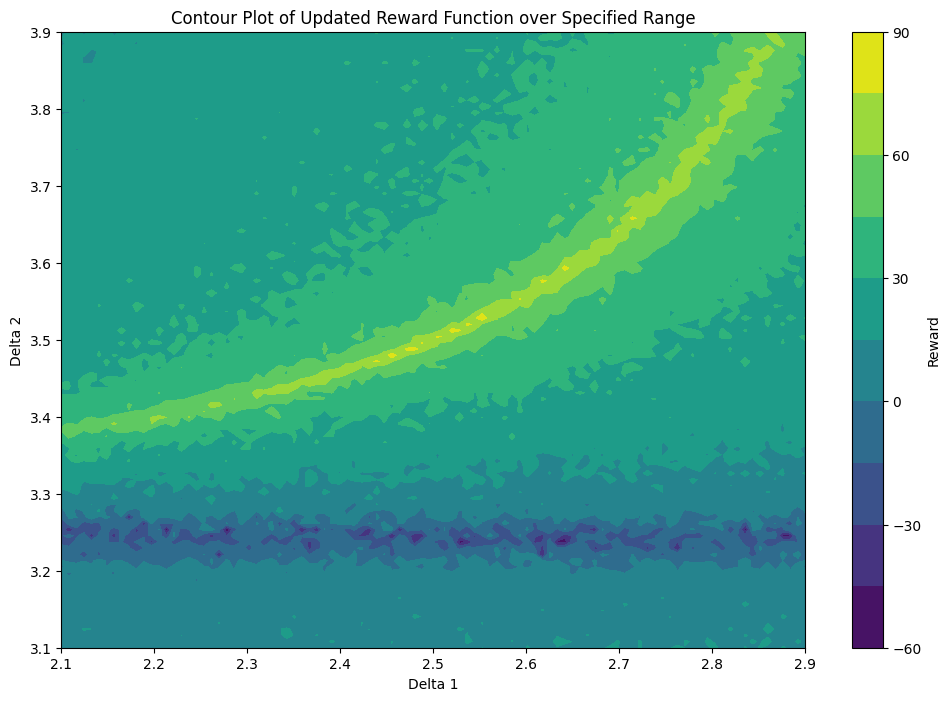

In [39]:
# Plot the contour map
plt.figure(figsize=(12, 8))

# Use a masked array to handle NaN values
reward_masked = np.ma.array(reward_grid, mask=np.isnan(reward_grid))

# Set the number of contour levels to 10
contour_levels = 10

# Create the contour plot
contour = plt.contourf(delta1_grid, delta2_grid, reward_masked, levels=contour_levels, cmap='viridis')
plt.colorbar(contour, label='Reward')

# Plot settings
plt.xlabel('Delta 1')
plt.ylabel('Delta 2')
plt.title('Contour Plot of Updated Reward Function over Specified Range')
plt.show()


In [105]:
# Example test spectrum parameters
spectrum_test_deltas: list = [-.4,2.0,3.6, 7.6],
spectrum_test_spins: list = [0, 2,4,0],
spectrum_test_cs: list = [-4.0, -1.0,-.1,-.001]

# Create the environment with the test spectrum
env = CFT2DEnv(
    num_states=3,
    low_deltas=[],
    spins=[0, 2, 4],
    dphi=-0.4,
    min_deltas=[-2.0,-2.0],
    max_deltas=[10.0, 10.0],
    spectrum_test_deltas=spectrum_test_deltas,
    spectrum_test_spins=spectrum_test_spins,
    spectrum_test_cs=spectrum_test_cs,
)

# Reset the environment
obs, info = env.reset()

# Sample a random action
action = env.action_space.sample()

# Take a step in the environment
obs, reward, done, _, info = env.step(action)

print("Observation:", obs)
print("Reward:", reward)
print("Info:", info)

we have 1741 z points to sample from
[-0.32652167  2.62762065  0.86148086]
[-1.11259075  2.87421642  0.55475586]
[-0.28163888  2.40333505  0.98049851]
[0.5526157  1.35987718 0.81117587]
[0.12382797 1.31658767 0.93916958]
[ 0.10685016  1.89957598 -0.2347927 ]
[-0.95638095  1.09689661  0.79942762]
[0.01670682 1.06913639 0.70862346]
[-0.91292237  1.34092351  0.13603796]
[ 0.54341594  2.19289581 -0.75683055]
we have 59049 possible initial deltas
spectrum_test: [(-0.4, 0), (2.0, 2), (3.6, 4), (7.6, 0)]
Observation: [-0.222       0.767       2.57        3.8434145   2.680147    0.01901482
  0.21018195]
Reward: 15.597817105905825
Info: {'deltas': array([-0.222,  0.767,  2.57 ]), 'spin': [0, 2, 4], 'opec': array([3.84341458, 2.68014699, 0.01901482]), 'dist': 0.21018194668652865, 'reward': 15.597817105905825}


In [9]:
env.reset()

(array([-0.204     ,  0.108     ,  2.794     ,  6.671944  ,  5.3527484 ,
         0.2525087 ,  0.01568126], dtype=float32),
 {'deltas': array([-0.204,  0.108,  2.794]),
  'spin': [0, 2, 4],
  'opec': array([6.67194435, 5.35274858, 0.25250871]),
  'dist': 0.015681257391458436,
  'reward': 41.552890764931966})

In [107]:
import gym
from stable_baselines3 import SAC,PPO
from stable_baselines3.common.vec_env import DummyVecEnv
import numpy as np

# Assuming the CFT2DEnv class is defined as per your latest modifications
# If not, make sure to include the definition of CFT2DEnv here

# Create the environment with the test spectrum


# Wrap the environment in a DummyVecEnv
#env = DummyVecEnv([lambda: env])

# Create the SAC model
model = SAC('MlpPolicy', env, verbose=1)

# Train the model
model.learn(total_timesteps=100)

# Save the model


# To test the trained model
obs, info = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done, _, info = env.step(action)
    print("Observation:", obs)
    print("Reward:", reward)
    if done:
        obs, info = env.reset()


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Observation: [0.135      0.913      1.314      0.03498909 1.0880595  0.2070237
 0.20943575]
Reward: 15.633382566394587
Observation: [0.147      0.883      1.313      0.44468617 1.4255577  0.14934655
 0.03467122]
Reward: 33.61845207244551
Observation: [0.165      0.858      1.314      0.754061   1.6938463  0.10736791
 0.04515037]
Reward: 30.97756720381131
Observation: [0.189      0.834      1.317      1.0550452  1.9662697  0.06499529
 0.04075995]
Reward: 32.00055238628755
Observation: [0.218      0.812      1.322      1.3399079  2.2378201  0.02411067
 0.108485  ]
Reward: 22.211433670105162
Observation: [0.253      0.79       1.328      1.5965619  2.5066266  0.01257406
 0.1987513 ]
Reward: 16.157010073665408
Observation: [0.294      0.768      1.336      1.8443607  2.7916582  0.05207546
 0.06446499]
Reward: 27.416329047178873
Observation: [0.338      0.748      1.344      2.1247733  3.1155176  0

In [109]:
model.learn(total_timesteps=100)

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12.2     |
|    ep_rew_mean     | 383      |
| time/              |          |
|    episodes        | 4        |
|    fps             | 8        |
|    time_elapsed    | 6        |
|    total_timesteps | 49       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 12       |
|    ep_rew_mean     | 376      |
| time/              |          |
|    episodes        | 8        |
|    fps             | 8        |
|    time_elapsed    | 11       |
|    total_timesteps | 96       |
---------------------------------


In [20]:
env.step(action)

(array([[-0.4       ,  2.017     ,  3.65      ,  4.3125043 ,  0.9552029 ,
          0.11026297,  0.00930352]], dtype=float32),
 array([-10.], dtype=float32),
 array([ True]),
 [{'deltas': array([-0.4  ,  1.85 ,  3.383]),
   'spin': [0, 2, 4],
   'opec': [-1, -1, -1],
   'dist': 10,
   'reward': -10,
   'TimeLimit.truncated': False,
   'terminal_observation': array([-0.4  ,  1.85 ,  3.383,  1.   ,  1.   ,  1.   , 10.   ],
         dtype=float32)}])

In [7]:
env.delta_lr

0.4

In [18]:
action, _states = model.predict(obs, deterministic=True)

In [37]:
info

{'deltas': array([-0.4  ,  1.983,  3.65 ]),
 'spin': [0, 2, 4],
 'opec': array([3.72976671, 1.04021147, 0.09119226]),
 'dist': 0.010147546431266887,
 'reward': 45.90523333625633}

In [3]:
obs, info = env.reset()

In [6]:
info

{'deltas': array([-0.943,  0.147,  1.712]),
 'spin': [0, 2, 4],
 'opec': array([1.30555967, 3.87583633, 0.52100431]),
 'dist': 0.005823149490769874,
 'reward': 51.45914013990625}

In [80]:
obs, reward, done, _, info = env.step(np.array([.5,0.5,.51]))
print("Info:", info)
print("Reward:", reward)


Info: {'deltas': array([-0.399,  2.007,  3.6  ]), 'spin': [0, 2, 4], 'opec': array([3.96636285, 1.0002983 , 0.09946258]), 'dist': 0.002694184927282185, 'reward': 59.166595592213625}
Reward: 59.166595592213625


In [103]:
obs, reward, done, _, info = env.step(np.array([.5,0.5,-.53]))
print("Info:", info)
print("Reward:", reward)

Info: {'deltas': array([-0.399,  1.183,  1.244]), 'spin': [0, 2, 4], 'opec': array([96.18212812, 18.06928054,  4.85113951]), 'dist': 0.057168344975788515, 'reward': 28.617549432981363}
Reward: 28.617549432981363


In [10]:
obs, info = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done, _, info = env.step(action)
    print("Info:", info)
    print("Reward:", reward)
    if done:
        print("done")
        break
        #obs, info = env.reset()

Info: {'deltas': array([-0.701, -0.577,  2.674]), 'spin': [0, 2, 4], 'opec': array([3.5874189 , 1.1522622 , 0.46024204]), 'dist': 0.009832338845658862, 'reward': 46.220784437586715}
Reward: 46.220784437586715
Info: {'deltas': array([-0.545, -0.415,  2.842]), 'spin': [0, 2, 4], 'opec': array([20.49025696,  0.96793269,  0.26550886]), 'dist': 0.01214527704884327, 'reward': 44.108149050266974}
Reward: 44.108149050266974
Info: {'deltas': array([-0.395, -0.286,  2.994]), 'spin': [0, 2, 4], 'opec': array([16.31966582,  2.10415905,  0.05773813]), 'dist': 0.02385972694784887, 'reward': 37.35563306307067}
Reward: 37.35563306307067
Info: {'deltas': array([-0.241, -0.145,  3.155]), 'spin': [0, 2, 4], 'opec': array([3.79421267, 4.72911761, 0.60267987]), 'dist': 0.040384701825713756, 'reward': 32.093042334080955}
Reward: 32.093042334080955
Info: {'deltas': array([-0.069,  0.034,  3.328]), 'spin': [0, 2, 4], 'opec': array([4.01367604, 5.09021145, 0.35976609]), 'dist': 0.02956960981850809, 'reward': 3

玩具模型

In [5]:
import gym
from gym import spaces
import numpy as np
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv

class ToyProblemEnv(gym.Env):
    metadata = {'render.modes': ['console']}

    def __init__(
        self,
        min_base_delta: float = 0.0,
        max_base_delta: float = 5.0,
        min_delta_offset: float = 0.001,  # Offset must be positive
        max_delta_offset: float = 5.0,
        delta_lr: float = 0.2,
        max_episode_steps: int = 50,
        num_z_samples: int = 50,
        num_sampling: int = 10,
        z_range: tuple = (-1.0, 1.0),
        immediate_reward_weight: float = 1.0,
        improvement_reward_weight: float = 1.0,
        final_reward_weight: float = 10.0,
        terminate_action_threshold: float = 0.5,
    ):
        self.data_type = np.float32

        self.min_base_delta = min_base_delta
        self.max_base_delta = max_base_delta
        self.min_delta_offset = min_delta_offset
        self.max_delta_offset = max_delta_offset
        self.delta_lr = delta_lr
        self.max_episode_steps = max_episode_steps
        self.num_z_samples = num_z_samples
        self.num_sampling = num_sampling
        self.z_range = z_range

        # Reward weights
        self.immediate_reward_weight = immediate_reward_weight
        self.improvement_reward_weight = improvement_reward_weight
        self.final_reward_weight = final_reward_weight

        self.terminate_action_threshold = terminate_action_threshold

        # Initialize variables
        self.reward = 0
        self.std_over_mean_sum = None
        self.prev_std_over_mean_sum = None

        # Generate z sampling points
        self.z_list = np.linspace(z_range[0], z_range[1], num_z_samples)

        # Compute the target b using the given v(z)
        self.b = self.compute_target_b(self.z_list)

        # Initialize base_delta and delta_offset
        self.base_delta = 1.0
        self.delta_offset = 1.0

        # Action and observation spaces
        # Actions: base_delta, delta_offset, terminate_action
        action_low = np.array([0.0, 0.0, 0.0], dtype=self.data_type)
        action_high = np.array([1.0, 1.0, 1.0], dtype=self.data_type)

        # Observation: base_delta, delta_offset, cs, std_over_mean_sum
        obs_low = np.array(
            [self.min_base_delta, self.min_delta_offset] + [-np.inf] * 2 + [0],  # Adjusted cs length
            dtype=self.data_type
        )
        obs_high = np.array(
            [self.max_base_delta, self.max_delta_offset] + [np.inf] * 2 + [np.inf],
            dtype=self.data_type
        )

        self.action_space = spaces.Box(low=action_low, high=action_high, dtype=self.data_type)
        self.observation_space = spaces.Box(low=obs_low, high=obs_high, dtype=self.data_type)

        # Count steps
        self.num_steps = 0

    def compute_target_b(self, z):
        # Compute v(z) = (5/2 + z)^4 + (7/2 + z)^4
        return ((2.5 + z) ** 4 + (3.5 + z) ** 4).astype(self.data_type)

    def compute_f(self, z, deltas):
        # Compute f(z, Delta) = (z + Delta)^4
        return np.array([[ (z_i + delta_j) ** 4 for delta_j in deltas] for z_i in z], dtype=self.data_type)

    def c_sampling(self):
        # Compute f(z, deltas)
        deltas = [self.base_delta, self.base_delta + self.delta_offset]
        F = self.compute_f(self.z_list, deltas)
        cs_list = []

        num_equations = len(self.z_list)
        subset_size = 2  # Number of deltas

        for _ in range(self.num_sampling):
            indices = np.random.choice(num_equations, size=subset_size, replace=False)
            F_sub = F[indices]
            b_sub = self.b[indices]
            try:
                # Solve F_sub * c = b_sub
                c, residuals, rank, s = np.linalg.lstsq(F_sub, b_sub, rcond=None)
                cs_list.append(c)
            except np.linalg.LinAlgError:
                # Singular matrix, assign NaNs
                cs_list.append(np.full(2, np.nan))

        cs_array = np.array(cs_list)
        # Filter out any NaN solutions
        cs_array = cs_array[~np.isnan(cs_array).any(axis=1)]

        if len(cs_array) == 0:
            # No valid solutions found
            c_mean = np.zeros(2)
            c_std = np.full(2, 1e6)
        else:
            c_mean = np.mean(cs_array, axis=0)
            c_std = np.std(cs_array, axis=0)

        return c_mean, c_std

    def compute_reward(self):
        # Compute c's over different z samplings and their standard deviation
        c_mean, c_std = self.c_sampling()
        self.cs = c_mean
        self.dist = c_std

        # Compute the sum of (std / mean) for each c
        epsilon = 1e-8  # Small value to prevent division by zero
        c_mean_safe = np.where(np.abs(c_mean) < epsilon, epsilon, np.abs(c_mean))
        std_over_mean = c_std / c_mean_safe
        self.std_over_mean_sum = np.sum(std_over_mean)

    def _get_obs(self):
        return np.concatenate(
            [np.array([self.base_delta, self.delta_offset], dtype=self.data_type), self.cs, [self.std_over_mean_sum]],
            dtype=self.data_type
        )

    def _get_info(self):
        return {
            "base_delta": self.base_delta,
            "delta_offset": self.delta_offset,
            "deltas": [self.base_delta, self.base_delta + self.delta_offset],
            "cs": self.cs.copy(),
            "std_over_mean_sum": self.std_over_mean_sum,
            "reward": self.reward,
        }

    def delta_bc(self, base_delta, delta_offset):
        delta1 = base_delta
        delta2 = base_delta + delta_offset

        # Check that delta_offset > 0
        if delta_offset < self.min_delta_offset or delta_offset > self.max_delta_offset:
            return False

        # Check base_delta bounds
        if delta1 < self.min_base_delta or delta1 > self.max_base_delta:
            return False

        # Check delta2 bounds
        if delta2 < self.min_base_delta or delta2 > self.max_base_delta:
            return False

        return True

    def reset(self, *, seed=None, options=None):
        super().reset(seed=seed)
        self.num_steps = 0

        # Initialize base_delta and delta_offset randomly within bounds
        self.base_delta = np.random.uniform(self.min_base_delta, self.max_base_delta)
        self.delta_offset = np.random.uniform(self.min_delta_offset, self.max_delta_offset)

        self.compute_reward()
        self.prev_std_over_mean_sum = self.std_over_mean_sum  # Initialize previous std_over_mean sum

        observation = self._get_obs()
        info = self._get_info()  # Ensure you have this method returning a dictionary
        return observation, info


    def step(self, action):
        self.num_steps += 1

        # Extract terminate action
        terminate_action = action[-1]
        action = action[:-1]  # Actions for base_delta and delta_offset

        # Update base_delta and delta_offset
        base_delta = self.base_delta + self.delta_lr * (action[0] - 0.5)
        delta_offset = self.delta_offset + self.delta_lr * (action[1] - 0.5)

        # Check boundary conditions
        is_ok = self.delta_bc(base_delta, delta_offset)

        terminated = False
        truncated = False

        if not is_ok:
            observation = self._get_obs()
            terminated = True
            info = self._get_info()
            # Penalize the agent for invalid deltas
            self.reward = -10
            return observation, self.reward, terminated, truncated, info

        # Update deltas
        self.base_delta = base_delta
        self.delta_offset = delta_offset

        # Compute the new reward components
        self.compute_reward()

        # Immediate reward based on current std
        immediate_reward = -self.std_over_mean_sum

        # Improvement reward
        delta_std_over_mean_sum = self.prev_std_over_mean_sum - self.std_over_mean_sum
        improvement_reward = delta_std_over_mean_sum

        # Update previous std_over_mean_sum
        self.prev_std_over_mean_sum = self.std_over_mean_sum

        # Check if agent wants to terminate the episode
        if terminate_action > self.terminate_action_threshold:
            terminated = True

        # Check if episode should be truncated due to max steps
        if self.num_steps >= self.max_episode_steps:
            truncated = True

        # Final reward (only at the end)
        if terminated or truncated:
            # Use the final std_over_mean_sum directly, scaled by final_reward_weight
            final_reward = -self.final_reward_weight * self.std_over_mean_sum
        else:
            final_reward = 0

        # Total reward
        self.reward = (
            self.immediate_reward_weight * immediate_reward +
            self.improvement_reward_weight * improvement_reward +
            final_reward  # Final reward already includes the weight
        )

        # Check for NaNs in observation
        observation = self._get_obs()
        if np.isnan(observation).any():
            self.reward = -10
            terminated = True
            info = self._get_info()
            return observation, self.reward, terminated, truncated, info

        info = self._get_info()
        return observation, self.reward, terminated, truncated, info


In [7]:
env.reset()

array([[2.231393  , 3.0726085 , 3.9037547 , 0.11536515, 0.25662494]],
      dtype=float32)

In [17]:
env.action_space.sample()

array([0.2392039, 0.8419369, 0.8719642], dtype=float32)

In [25]:
env=ToyProblemEnv()
obs,_ = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    print("Observation:", obs)
    print("Reward:", reward)
    print("Deltas:", info['deltas'])
    if done:
        obs, info = env.reset()

Observation: [2.4950817  3.8452334  3.3092027  0.03823975 0.27629012]
Reward: -10
Deltas: [2.4950817262376574, 6.340315175256608]
Observation: [ 1.3222412   3.4015348  11.514204    0.29107437  0.45158014]
Reward: -0.30270206928253174
Deltas: [1.3222411394716427, 4.723776013944256]
Observation: [ 1.3127592   3.4124851  15.303662    0.276548    0.70882386]
Reward: -0.9660675823688507
Deltas: [1.312759149134271, 4.72524423131715]
Observation: [ 1.3036747   3.4270594  40.524822    0.26606852  1.7666001 ]
Reward: -2.824376344680786
Deltas: [1.3036746562124417, 4.730734123084653]
Observation: [1.3212783  3.4380476  9.719487   0.31920254 0.70925444]
Reward: 0.348091185092926
Deltas: [1.3212783277631925, 4.759325887057889]
Observation: [ 1.3153061   3.448597   19.288803    0.27070695  0.88011   ]
Reward: -1.0509656071662903
Deltas: [1.3153060079218077, 4.763902909848798]
Observation: [ 1.3133575   3.463154   14.445661    0.27849355  0.767859  ]
Reward: -0.6556079387664795
Deltas: [1.3133574963

In [21]:
env.action_space.sample()

array([0.07316713, 0.04675409, 0.26225156], dtype=float32)

In [23]:
env.step(env.action_space.sample())

(array([1.8321258 , 4.439613  , 5.5517664 , 0.08120994, 0.3325767 ],
       dtype=float32),
 -10,
 True,
 False,
 {'base_delta': 1.8321257276966514,
  'delta_offset': 4.439612670609467,
  'deltas': [1.8321257276966514, 6.271738398306118],
  'cs': array([5.5517664 , 0.08120994], dtype=float32),
  'std_over_mean_sum': 0.3325767,
  'reward': 0})

In [6]:

# Create the environment
env = DummyVecEnv([lambda: ToyProblemEnv()])

# Update the action space in the policy to match the environment
policy_kwargs = dict(net_arch=[64, 64])

# Create the SAC model
model = SAC('MlpPolicy', env, verbose=1, tensorboard_log="./tensorboard/", policy_kwargs=policy_kwargs)

# Train the model
model.learn(total_timesteps=10000)

# Test the trained model
obs = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated[0] or truncated[0]
    print("Observation:", obs[0])
    print("Reward:", reward[0])
    print("Deltas:", info[0]['deltas'])
    if done:
        obs, info = env.reset()


Using cpu device
Logging to ./tensorboard/SAC_5


----------------------------
| time/              |     |
|    episodes        | 4   |
|    fps             | 586 |
|    time_elapsed    | 0   |
|    total_timesteps | 9   |
----------------------------
----------------------------
| time/              |     |
|    episodes        | 8   |
|    fps             | 690 |
|    time_elapsed    | 0   |
|    total_timesteps | 15  |
----------------------------
----------------------------
| time/              |     |
|    episodes        | 12  |
|    fps             | 725 |
|    time_elapsed    | 0   |
|    total_timesteps | 20  |
----------------------------
----------------------------
| time/              |     |
|    episodes        | 16  |
|    fps             | 813 |
|    time_elapsed    | 0   |
|    total_timesteps | 26  |
----------------------------
----------------------------
| time/              |     |
|    episodes        | 20  |
|    fps             | 827 |
|    time_elapsed    | 0   |
|    total_timesteps | 30  |
--------------

ValueError: not enough values to unpack (expected 2, got 1)

In [86]:
env.step(action)

(array([1.3994287 , 4.6209674 , 9.836665  , 0.32235742, 0.45394182],
       dtype=float32),
 -0.49551281332969666,
 False,
 False,
 {'deltas': array([1.3994287, 4.6209674], dtype=float32),
  'cs': array([9.836665  , 0.32235742], dtype=float32),
  'std_over_mean_sum': 0.45394182,
  'reward': -0.49551281332969666})

In [91]:
info['deltas']

array([3.1457868, 3.988867 ], dtype=float32)

In [109]:
def compute_reward_at_deltas(self, deltas):
    # Save the current state
    current_base_delta = self.base_delta
    current_delta_offset = self.delta_offset
    current_prev_std_over_mean_sum = self.prev_std_over_mean_sum
    current_std_over_mean_sum = self.std_over_mean_sum

    # Set the deltas to the provided values
    self.base_delta = deltas[0]
    self.delta_offset = deltas[1] - deltas[0]
    self.compute_reward()

    # Compute the immediate reward
    immediate_reward = -self.std_over_mean_sum

    # Compute the final reward
    final_reward = -self.final_reward_weight * self.std_over_mean_sum

    # Total reward (assuming termination)
    total_reward = (
        self.immediate_reward_weight * immediate_reward +
        final_reward  # Final reward already includes the weight
    )

    # Restore the previous state
    self.base_delta = current_base_delta
    self.delta_offset = current_delta_offset
    self.prev_std_over_mean_sum = current_prev_std_over_mean_sum
    self.std_over_mean_sum = current_std_over_mean_sum

    return total_reward

# Add the method to the environment
ToyProblemEnv.compute_reward_at_deltas = compute_reward_at_deltas


In [33]:
env.compute_reward_at_deltas([2,3])

-5.052519768476486

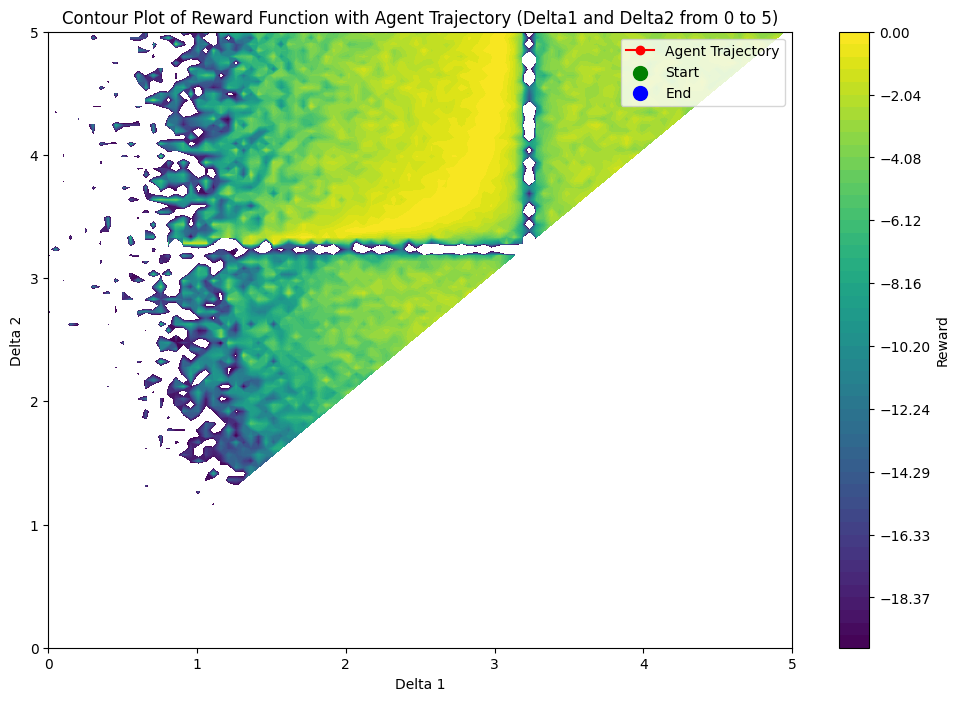

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Create an instance of the environment
env_unwrapped = ToyProblemEnv()

# Define the range and number of points for delta1 and delta2
delta_min, delta_max = 0.0, 5.0
num_points = 100  # Number of points along each axis

delta1_values = np.linspace(delta_min, delta_max, num_points)
delta2_values = np.linspace(delta_min, delta_max, num_points)

# Create meshgrid
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)

# Mask invalid regions where delta2 <= delta1
valid_mask = delta2_grid > delta1_grid

# Initialize the reward grid with NaNs
reward_grid = np.full(delta1_grid.shape, np.nan)

# Compute base_delta and delta_offset
base_delta_grid = delta1_grid
delta_offset_grid = delta2_grid - delta1_grid

# Add the compute_reward_at_deltas method to the environment if not already present
def compute_reward_at_deltas(self, deltas):
    # Save the current state
    current_base_delta = self.base_delta
    current_delta_offset = self.delta_offset
    current_prev_std_over_mean_sum = self.prev_std_over_mean_sum
    current_std_over_mean_sum = self.std_over_mean_sum

    # Set the deltas to the provided values
    self.base_delta = deltas[0]
    self.delta_offset = deltas[1] - deltas[0]
    self.compute_reward()

    # Compute the immediate reward
    immediate_reward = -self.std_over_mean_sum

    # Compute the final reward
    final_reward = -self.final_reward_weight * self.std_over_mean_sum

    # Total reward (assuming termination)
    total_reward = (
        self.immediate_reward_weight * immediate_reward +
        final_reward  # Final reward already includes the weight
    )

    # Restore the previous state
    self.base_delta = current_base_delta
    self.delta_offset = current_delta_offset
    self.prev_std_over_mean_sum = current_prev_std_over_mean_sum
    self.std_over_mean_sum = current_std_over_mean_sum

    return total_reward

# Add the method to the environment
if not hasattr(env_unwrapped, 'compute_reward_at_deltas'):
    ToyProblemEnv.compute_reward_at_deltas = compute_reward_at_deltas

# Compute the rewards over the grid
for i in range(num_points):
    for j in range(num_points):
        if not valid_mask[i, j]:
            continue  # Skip invalid delta combinations

        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]
        base_delta = delta1
        delta_offset = delta2 - delta1

        # Ensure delta_offset is within bounds
        if delta_offset < env_unwrapped.min_delta_offset or delta_offset > env_unwrapped.max_delta_offset:
            continue  # Skip invalid delta_offset

        # Ensure base_delta is within bounds
        if base_delta < env_unwrapped.min_base_delta or base_delta > env_unwrapped.max_base_delta:
            continue  # Skip invalid base_delta

        deltas = [delta1, delta2]

        # Compute the reward
        reward = env_unwrapped.compute_reward_at_deltas(deltas)
        reward_grid[i, j] = reward

# Reset the environment
obs, info = env_unwrapped.reset()  # Unpack the observation and info
trajectory_base_deltas = []
trajectory_delta_offsets = []
trajectory_rewards = []
trajectory_std_over_mean_sum = []

done = False

while not done:
    # Ensure observation is the correct shape
    obs_reshaped = obs.reshape((1, -1))
    action, _states = model.predict(obs_reshaped, deterministic=True)
    action = action[0]  # Since model.predict returns an array of actions

    obs, reward, terminated, truncated, info = env_unwrapped.step(action)
    done = terminated or truncated

    # Extract base_delta and delta_offset from info
    current_base_delta = info['base_delta']
    current_delta_offset = info['delta_offset']
    trajectory_base_deltas.append(current_base_delta)
    trajectory_delta_offsets.append(current_delta_offset)
    trajectory_rewards.append(reward)
    trajectory_std_over_mean_sum.append(info['std_over_mean_sum'])

    if not done:
        obs = obs  # Continue with the next observation

trajectory_base_deltas = np.array(trajectory_base_deltas)
trajectory_delta_offsets = np.array(trajectory_delta_offsets)
delta1_trajectory = trajectory_base_deltas
delta2_trajectory = trajectory_base_deltas + trajectory_delta_offsets

# Plot the contour map and trajectory
plt.figure(figsize=(12, 8))

# Use a masked array to handle NaN values
reward_masked = np.ma.array(reward_grid, mask=np.isnan(reward_grid))

# Set the contour levels from -10 to 0
levels = np.linspace(-20, 0, 50)

contour = plt.contourf(delta1_grid, delta2_grid, reward_masked, levels=levels, cmap='viridis')
plt.colorbar(contour, label='Reward')

# Overlay the agent's trajectory in terms of delta1 and delta2
plt.plot(delta1_trajectory, delta2_trajectory, marker='o', color='red', label='Agent Trajectory')

# Mark the starting and ending points
plt.scatter(delta1_trajectory[0], delta2_trajectory[0], color='green', s=100, label='Start')
plt.scatter(delta1_trajectory[-1], delta2_trajectory[-1], color='blue', s=100, label='End')

# Plot settings
plt.xlabel('Delta 1')
plt.ylabel('Delta 2')
plt.title('Contour Plot of Reward Function with Agent Trajectory (Delta1 and Delta2 from 0 to 5)')
plt.legend()
plt.xlim(delta_min, delta_max)
plt.ylim(delta_min, delta_max)
plt.show()


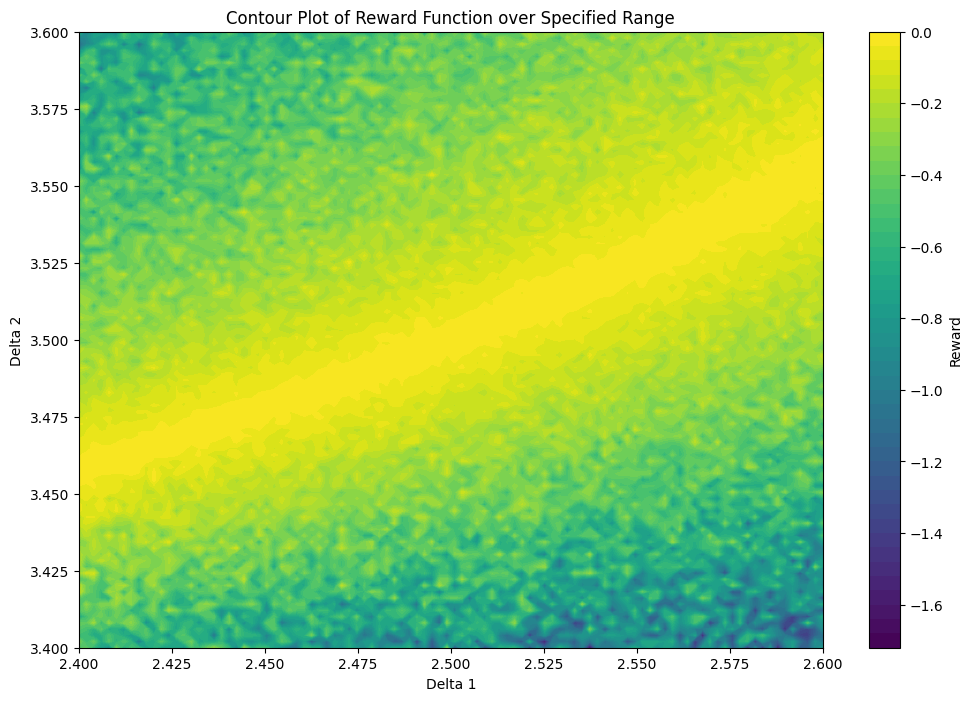

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming the ToyProblemEnv class is defined as before
# Create an instance of the environment
env_unwrapped = ToyProblemEnv()

# Define the range and number of points for delta1 and delta2
delta1_min, delta1_max = 2.4, 2.6
delta2_min, delta2_max = 3.4, 3.6
num_points = 100  # Number of points along each axis

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)

# Create meshgrid
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)

# Mask invalid regions where delta2 <= delta1
valid_mask = delta2_grid > delta1_grid

# Initialize the reward grid with NaNs
reward_grid = np.full(delta1_grid.shape, np.nan)

# Compute base_delta and delta_offset
base_delta_grid = delta1_grid
delta_offset_grid = delta2_grid - delta1_grid

# Add the compute_reward_at_deltas method to the environment if not already present
def compute_reward_at_deltas(self, deltas):
    # Save the current state
    current_base_delta = self.base_delta
    current_delta_offset = self.delta_offset
    current_prev_std_over_mean_sum = self.prev_std_over_mean_sum
    current_std_over_mean_sum = self.std_over_mean_sum

    # Set the deltas to the provided values
    self.base_delta = deltas[0]
    self.delta_offset = deltas[1] - deltas[0]
    self.compute_reward()

    # Compute the immediate reward
    immediate_reward = -self.std_over_mean_sum

    # Compute the final reward
    
    return immediate_reward

# Add the method to the environment
if not hasattr(env_unwrapped, 'compute_reward_at_deltas'):
    ToyProblemEnv.compute_reward_at_deltas = compute_reward_at_deltas

# Compute the rewards over the grid
for i in range(num_points):
    for j in range(num_points):
        if not valid_mask[i, j]:
            continue  # Skip invalid delta combinations

        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]
        base_delta = delta1
        delta_offset = delta2 - delta1

        # Ensure delta_offset is within bounds
        if delta_offset < env_unwrapped.min_delta_offset or delta_offset > env_unwrapped.max_delta_offset:
            continue  # Skip invalid delta_offset

        # Ensure base_delta is within bounds
        if base_delta < env_unwrapped.min_base_delta or base_delta > env_unwrapped.max_base_delta:
            continue  # Skip invalid base_delta

        deltas = [delta1, delta2]

        # Compute the reward
        reward = env_unwrapped.compute_reward_at_deltas(deltas)
        reward_grid[i, j] = reward

# Plot the contour map
plt.figure(figsize=(12, 8))

# Use a masked array to handle NaN values
reward_masked = np.ma.array(reward_grid, mask=np.isnan(reward_grid))

# Set the number of contour levels to 10
contour_levels = 50

contour = plt.contourf(delta1_grid, delta2_grid, reward_masked, levels=contour_levels, cmap='viridis')
plt.colorbar(contour, label='Reward')

# Plot settings
plt.xlabel('Delta 1')
plt.ylabel('Delta 2')
plt.title('Contour Plot of Reward Function over Specified Range')
plt.show()


In [94]:
trajectory_deltas

array([[0.8560533, 2.056537 ]], dtype=float32)

In [63]:
env = ToyProblemEnv(target_deltas=target_deltas)

In [200]:
!pip install tensorboard==2.9.1  # Example version that works with many setups
import tensorboard


415804.14s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 3.6 MB/s eta 0:00:00a 0:00:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.5/209.5 kB 3.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 3.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 2.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 2.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.7/151.7 kB 2.1 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 2.0 MB/s eta 0:00:0000:01
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.2
    Uninstalling tensorboard-data-server-0.7.2:
      Successfully uninstalled tensorboard-data-server-0.7.2
  Attempting uninstall: protobuf
    Found existing installation: pro

In [175]:
env = ToyProblemEnv(target_deltas=target_deltas)


In [26]:
env.deltas=target_deltas

In [24]:
env.deltas

[2.5, 3.5]

In [45]:
env.step([2.5,0.5])

(array([[ 6.0999999e+00,  7.0999999e+00,  1.1218196e+03, -4.0459597e+03,
          1.0881409e+04]], dtype=float32),
 array([-18.076777], dtype=float32),
 array([False]),
 [{'deltas': array([6.1, 7.1]),
   'cs': array([ 1121.8196, -4045.9597], dtype=float32),
   'dist': array([2195.588, 8685.821], dtype=float32),
   'reward': -4.1039553,
   'TimeLimit.truncated': False}])

In [52]:
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv
import numpy as np

# Define the target deltas
target_deltas = [2.5, 3.5]

# Create the environment
env = DummyVecEnv([lambda: ToyProblemEnv(target_deltas=target_deltas)])

# Create the SAC model
model = SAC('MlpPolicy', env, verbose=1, tensorboard_log="./tensorboard/")

# Train the model
model.learn(total_timesteps=10000)

# Test the trained model
obs = env.reset()
for _ in range(50):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done,  info = env.step(action)
    print("Observation:", obs)
    print("Reward:", reward)
    print("Deltas:", info[0]['deltas'])
    if done:
        obs = env.reset()


Using cpu device
Logging to ./tensorboard/SAC_3
---------------------------------
| time/              |          |
|    episodes        | 4        |
|    fps             | 146      |
|    time_elapsed    | 1        |
|    total_timesteps | 200      |
| train/             |          |
|    actor_loss      | -1.11    |
|    critic_loss     | 1.37e+03 |
|    ent_coef        | 0.971    |
|    ent_coef_loss   | -0.0908  |
|    learning_rate   | 0.0003   |
|    n_updates       | 99       |
---------------------------------
---------------------------------
| time/              |          |
|    episodes        | 8        |
|    fps             | 110      |
|    time_elapsed    | 3        |
|    total_timesteps | 400      |
| train/             |          |
|    actor_loss      | 1.01     |
|    critic_loss     | 718      |
|    ent_coef        | 0.921    |
|    ent_coef_loss   | -0.189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299      |
---------------------------------


In [48]:
!tensorboard --logdir ./tensorboard/


25281.39s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
TensorFlow installation not found - running with reduced feature set.
Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.9.1 at http://localhost:6006/ (Press CTRL+C to quit)
^C


In [47]:
pwd

'/Users/justinas/Documents/python/lp ml'

In [53]:
# Test the trained model
obs = env.reset()
for _ in range(10):
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, done,  info = env.step(action)
    print("Observation:", obs)
    print("Reward:", reward)
    print("Deltas:", info[0]['deltas'])
    if done:
        obs = env.reset()


Observation: [[1.773078  4.8880634 0.5290139 3.7708588 5.0660076]]
Reward: [-5.5741444]
Deltas: [1.773078  4.8880634]
Observation: [[1.816556  4.913475  0.5341209 2.9624627 2.2121234]]
Reward: [8.5523815]
Deltas: [1.816556 4.913475]
Observation: [[1.8363703 4.9154844 0.555023  3.0351543 1.6890106]]
Reward: [2.8803997]
Deltas: [1.8363703 4.9154844]
Observation: [[1.8434689 4.914298  0.6053426 2.2989135 1.3667209]]
Reward: [-2.0774603]
Deltas: [1.8434689 4.914298 ]
Observation: [[1.8424357  4.9073067  0.53445256 3.1999886  2.4310062 ]]
Reward: [-2.6555367]
Deltas: [1.8424357 4.9073067]
Observation: [[1.8638252 4.9098434 0.5390491 3.75237   2.9818914]]
Reward: [0.44599295]
Deltas: [1.8638252 4.9098434]
Observation: [[1.8902409 4.914083  0.8480755 1.5557336 0.7308513]]
Reward: [5.7308955]
Deltas: [1.8902409 4.914083 ]
Observation: [[1.8768219 4.8962917 0.7241224 2.2695768 1.6812642]]
Reward: [-3.9633775]
Deltas: [1.8768219 4.8962917]
Observation: [[1.886301   4.888694   0.6270948  2.023688

In [157]:
obs

array([[ 1.895    ,  1.452    ,  3.0216057, -1.4822466,  2.3224247]],
      dtype=float32)

In [154]:
action, _states = model.predict(obs, deterministic=True)

In [127]:
env.step(action)

(array([[ 3.054    ,  3.976    ,  3.262764 , -2.211889 ,  1.6297178]],
       dtype=float32),
 array([-1.6297178], dtype=float32),
 array([False]),
 [{'deltas': array([3.054, 3.976], dtype=float32),
   'cs': array([ 3.262764, -2.211889], dtype=float32),
   'dist': 1.6297178,
   'reward': -1.6297178,
   'TimeLimit.truncated': False}])

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv

# Set seaborn style for better aesthetics
sns.set()

# Define the target deltas
target_deltas = [2.5, 3.5]

# Number of z samples for the function
num_z_samples = 10

# Generate z_samples (pairs of z1 and z2)
def generate_z_samples(num_samples):
    z_samples = []
    for _ in range(num_samples):
        z1 = np.random.uniform(0.3, 0.5)
        z2 = np.random.uniform(0.3, 0.5)
        z_samples.append([z1, z2])
    return z_samples

z_samples = generate_z_samples(num_z_samples)

# Define the getMeanStdToy function
def getMeanStdToy(delta1, delta2):
    cs_list = []
    num_samples = len(z_samples)
    for i in range(num_samples):
        z1 = z_samples[i][0]
        z2 = z_samples[i][1]

        # Compute b1 and b2 using target deltas and c_true = [1, 1]
        b1 = z1 ** target_deltas[0] + z1 ** target_deltas[1]
        b2 = z2 ** target_deltas[0] + z2 ** target_deltas[1]

        # Build the matrix A and vector b
        A = np.array([
            [z1 ** delta1, z1 ** delta2],
            [z2 ** delta1, z2 ** delta2]
        ])
        b = np.array([b1, b2])

        try:
            c = np.linalg.solve(A, b)
            cs_list.append(c)
        except np.linalg.LinAlgError:
            continue  # Singular matrix, skip this sample

    if len(cs_list) == 0:
        # No valid solutions
        c_mean = np.zeros(2)
        c_std = np.full(2, 1e6)
    else:
        cs_array = np.array(cs_list)
        c_mean = np.mean(cs_array, axis=0)
        c_std = np.std(cs_array, axis=0)

    # Compute std_over_mean
    epsilon = 1e-8
    c_mean_safe = np.where(np.abs(c_mean) < epsilon, epsilon, np.abs(c_mean))
    std_over_mean = c_std / c_mean_safe

    return np.sum(std_over_mean)

# Generate the grid for delta1 and delta2
delta1_min, delta1_max = 1.0, 5.0
delta2_min, delta2_max = 1.0, 5.0
num_points = 50  # Resolution of the grid

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)

delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)
reward_grid = np.zeros_like(delta1_grid)

# Compute the reward over the grid
for i in range(num_points):
    for j in range(num_points):
        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]

        # Ensure deltas satisfy the boundary conditions
        if abs(delta1 - delta2) < 0.001:
            reward_grid[i, j] = np.nan  # Invalid deltas
            continue

        reward = getMeanStdToy(delta1, delta2)
        reward_grid[i, j] = reward

In [57]:
env.reset()

array([[ 4.0617566,  3.5321808, -9.971934 ,  9.401712 , 12.8838005]],
      dtype=float32)

In [60]:
len(env.step(action))

4

In [ ]:
 env.step(action)

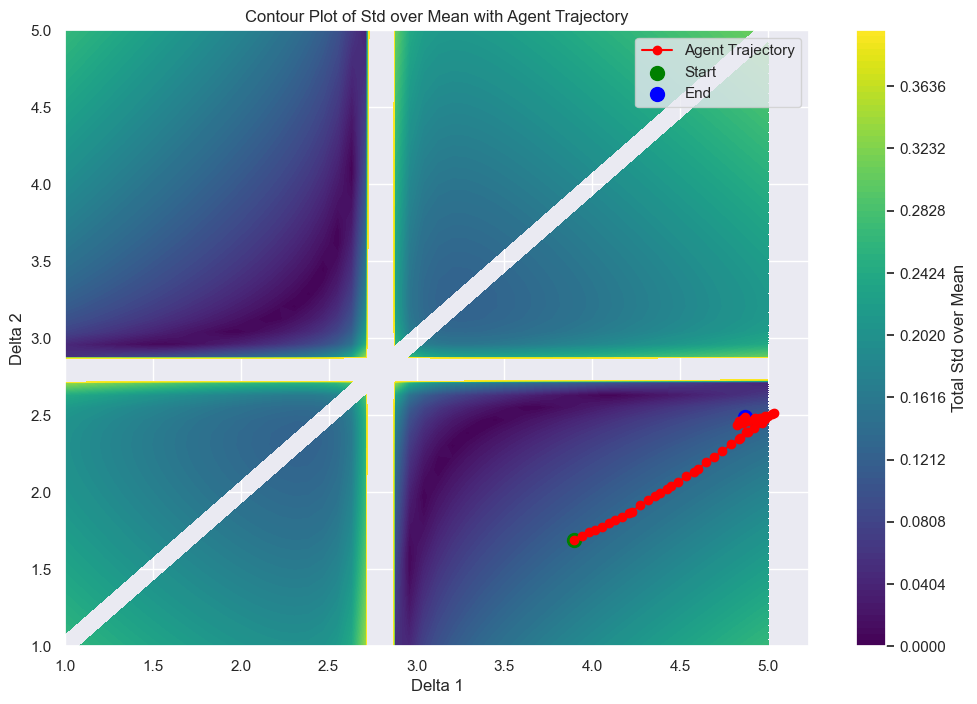

In [77]:
trajectory_deltas = np.array(trajectory_deltas)

# Plot the contour map and overlay the agent's trajectory
plt.figure(figsize=(12, 8))

# Mask invalid values
reward_masked = np.ma.array(reward_grid, mask=np.isnan(reward_grid))
levels = np.linspace(0, .4, 100)

contour = plt.contourf(delta1_grid, delta2_grid, reward_masked, levels=levels, cmap='viridis')
plt.colorbar(contour, label='Total Std over Mean')

# Overlay the agent's trajectory
plt.plot(trajectory_deltas[:, 0], trajectory_deltas[:, 1], marker='o', color='red', label='Agent Trajectory')

# Mark the starting and ending points
plt.scatter(trajectory_deltas[0, 0], trajectory_deltas[0, 1], color='green', s=100, label='Start')
plt.scatter(trajectory_deltas[-1, 0], trajectory_deltas[-1, 1], color='blue', s=100, label='End')

# Plot settings
plt.xlabel('Delta 1')
plt.ylabel('Delta 2')
plt.title('Contour Plot of Std over Mean with Agent Trajectory')
plt.legend()
plt.show()

In [65]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have already trained your model
# If not, make sure to train or load your model before evaluation
# Example: model = SAC.load("sac_cft_model")

# Initialize variables to store rewards
episode_rewards = []
episode_lengths = []
num_episodes = 1  # Number of episodes to evaluate

# Reset the environment
obs = env.reset()
episode_reward = 0
episode_length = 0
episode_num = 0

# Lists to store rewards for plotting
rewards_list = []

while episode_num < num_episodes:
    # Predict the action using the trained model
    action, _states = model.predict(obs, deterministic=True)
    # Take a step in the environment
    obs, reward, done, info = env.step(action)
    
    # Since we're using a DummyVecEnv, extract the first element
    reward = reward[0]
    done = done[0]
    info = info[0]
    obs = obs  # obs is already correctly shaped
    
    # Accumulate reward and length
    episode_reward += reward
    episode_length += 1
    rewards_list.append(reward)
    
    if done:
        # Store the episode reward and length
        episode_rewards.append(episode_reward)
        episode_lengths.append(episode_length)
        
        print(f"Episode {episode_num + 1}: Reward = {episode_reward}, Length = {episode_length}")
        
        # Reset variables
        obs = env.reset()
        episode_reward = 0
        episode_length = 0
        episode_num += 1

# Plot the rewards
plt.figure(figsize=(12, 6))
plt.plot(rewards_list)
plt.xlabel('Step')
plt.ylabel('Reward')
plt.title('Rewards during Evaluation')
plt.show()


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2,) + inhomogeneous part.

In [185]:
reward_grid

array([[        nan, -1.45220804, -1.2958945 , ..., -1.41615307,
        -2.39139938, -1.34267175],
       [-0.96821749,         nan, -0.89794993, ..., -1.22685814,
        -2.12701702, -1.97073674],
       [-1.29022956, -1.09085441,         nan, ..., -1.38895297,
        -1.31599009, -0.92822075],
       ...,
       [-2.11523724, -1.56425905, -1.37776875, ...,         nan,
        -1.58234513, -1.67956448],
       [-1.78561854, -1.56112289, -2.00955272, ..., -2.00714493,
                nan, -1.9361968 ],
       [-0.66339928, -1.01592898, -1.59629583, ..., -2.56852961,
        -2.73802352,         nan]])

In [184]:
import numpy as np

# Define the range and number of points for each delta
delta1_min, delta1_max = env.min_deltas[0], env.max_deltas[0]
delta2_min, delta2_max = env.min_deltas[1], env.max_deltas[1]
num_points = 100  # Number of points along each axis

delta1_values = np.linspace(delta1_min, delta1_max, num_points)
delta2_values = np.linspace(delta2_min, delta2_max, num_points)

# Create meshgrid
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)

# Compute rewards
reward_grid = np.zeros_like(delta1_grid)

for i in range(num_points):
    for j in range(num_points):
        deltas = [delta1_grid[i, j], delta2_grid[i, j]]
        # Ensure deltas satisfy the boundary conditions
        is_ok, ds = env.delta_bc(deltas)
        if is_ok:
            reward = env.compute_reward_at(ds)
        else:
            reward = np.nan  # Assign NaN for invalid deltas
        reward_grid[i, j] = reward


In [174]:
reward_grid

array([[        nan,         nan,         nan, ..., -1.66107965,
        -2.44984055, -2.83319306],
       [        nan,         nan,         nan, ..., -1.59383059,
        -2.69256067, -1.51499343],
       [        nan,         nan,         nan, ..., -1.73028982,
        -1.68746805, -1.64585948],
       ...,
       [-1.82499218, -1.07242   , -1.2931366 , ...,         nan,
                nan,         nan],
       [-1.50700903, -0.94334275, -1.47970581, ...,         nan,
                nan,         nan],
       [-1.65076518, -1.29928422, -1.63295269, ...,         nan,
                nan,         nan]])

In [70]:
# Evaluate the trained model
obs, info = env.reset()
trajectory_deltas = []
num_steps = 0
max_steps = 100  # Maximum number of steps to record

while num_steps < max_steps:
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated

    # Record the deltas
    trajectory_deltas.append(info['deltas'].copy())

    if done:
        break  # End the evaluation if the episode is done

    num_steps += 1


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

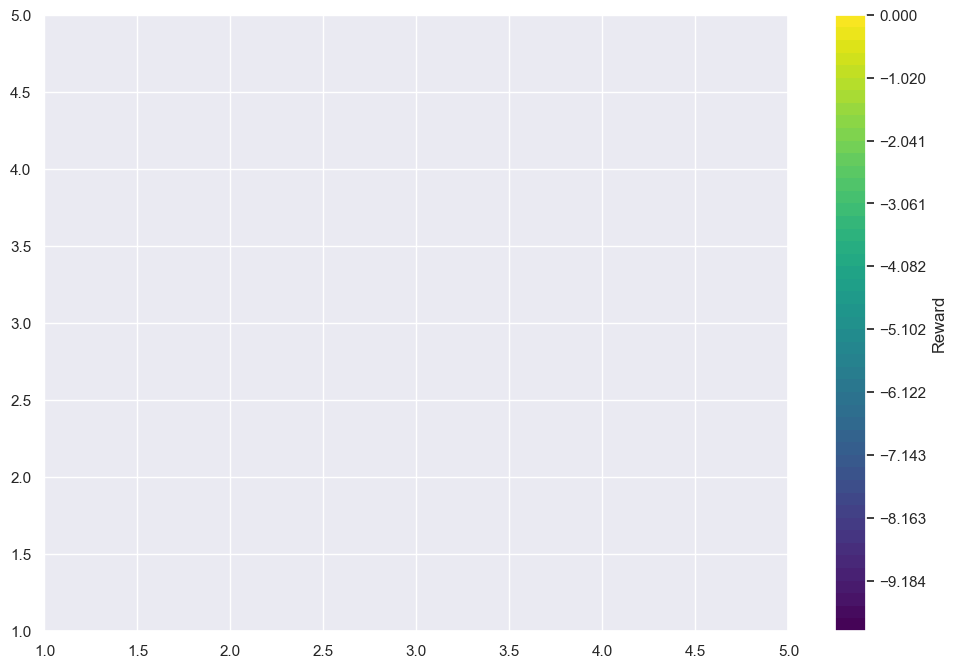

In [68]:
import matplotlib.pyplot as plt
import numpy as np

# Create the plot
plt.figure(figsize=(12, 8))

# Plot the contour map
# Use a masked array to handle NaN values
reward_masked = np.ma.array(reward_grid, mask=np.isnan(reward_grid))
levels = np.linspace(-10.0, 0.0, 50)

contour = plt.contourf(delta1_grid, delta2_grid, reward_masked, levels=levels, cmap='viridis')
plt.colorbar(contour, label='Reward')

# Overlay the agent's trajectory
trajectory_deltas = np.array(trajectory_deltas)
plt.plot(trajectory_deltas[:, 0], trajectory_deltas[:, 1], marker='o', color='red', label='Agent Trajectory')

# Mark the starting and ending points
plt.scatter(trajectory_deltas[0, 0], trajectory_deltas[0, 1], color='green', s=100, label='Start')
plt.scatter(trajectory_deltas[-1, 0], trajectory_deltas[-1, 1], color='blue', s=100, label='End')

# Plot settings
plt.xlabel('Delta 1')
plt.ylabel('Delta 2')
plt.title('Contour Plot of Reward Function with Agent Trajectory')
plt.legend()
plt.show()


Computing rewards for contour plot...
Completed 10/50 rows
Completed 20/50 rows
Completed 30/50 rows
Completed 40/50 rows
Completed 50/50 rows


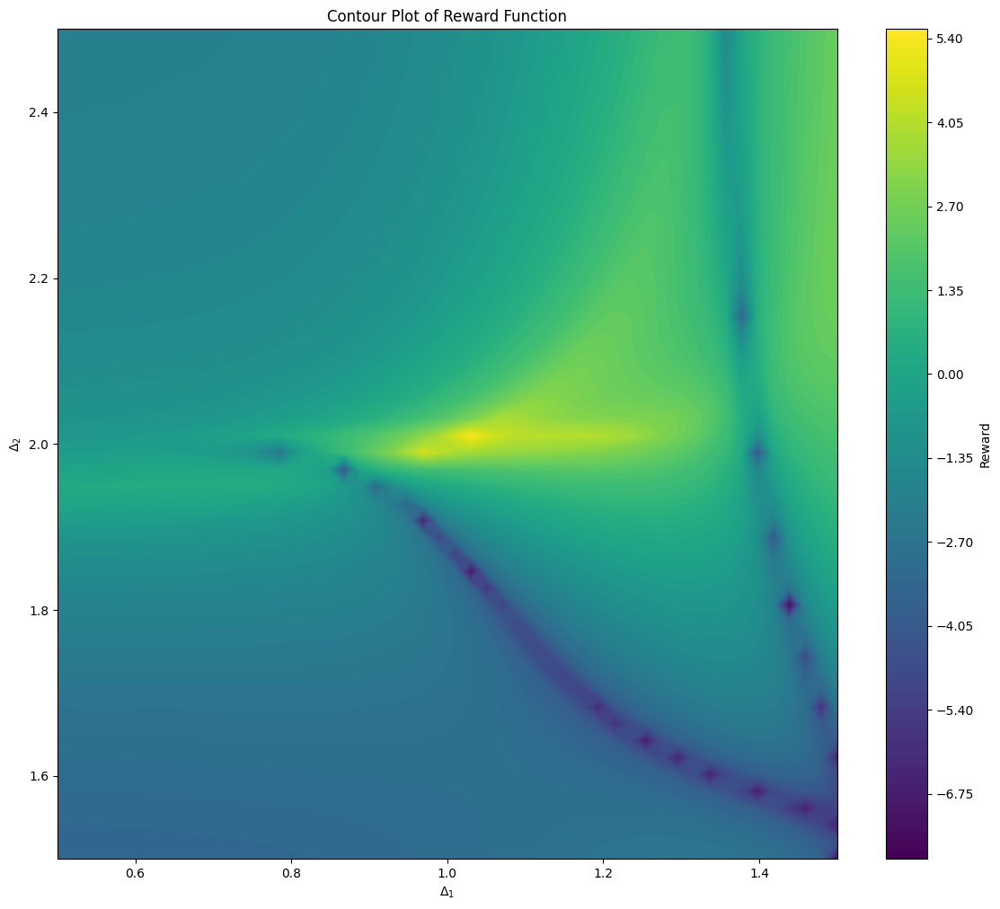

In [4]:
import numpy as np
import itertools
import math
import matplotlib.pyplot as plt

def ftoy(z, delta):
    """
    Compute ftoy(z, delta) = Exp[-delta^2 * z] - Exp[-delta^2 * (1 - z)]
    """
    return math.exp(-delta**2 * z) - math.exp(-delta**2 * (1 - z))

def main_equation(z, Delta1, Delta2):
    """
    Compute the main equation coefficients B, C, D for given z, Delta1, Delta2.
    Equation: B * C1 + C * C2 = D
    where D = Exp[-4*(1 - z)] - Exp[-4*z] + 1/100*(Exp[-64*(1 - z)] - Exp[-64*z]) - 5*(-Exp[-1 + z] + Exp[-z])
    """
    # Compute the constant terms
    A = (math.exp(-4 * (1 - z)) - math.exp(-4 * z) +
         (1/100) * (math.exp(-64 * (1 - z)) - math.exp(-64 * z)) -
         5 * (-math.exp(-1 + z) + math.exp(-z)))
    
    # Compute coefficients for C1 and C2
    B = -math.exp(-((1 - z) * Delta1**2)) + math.exp(-z * Delta1**2)
    C = -math.exp(-((1 - z) * Delta2**2)) + math.exp(-z * Delta2**2)
    
    D = -A  # Rearranged to B*C1 + C*C2 = D
    return (B, C, D)

def derivative_equations(Delta1, Delta2):
    """
    Define the derivative equations explicitly as provided.
    Each derivative equation is of the form:
    B_deriv * C1 + C_deriv * C2 = D_deriv
    """
    # Constants from the user-provided Mathematica expressions
    eq1 = (
        2.0 * math.exp(-0.5 * Delta1**2) * Delta1**2,
        2.0 * math.exp(-0.5 * Delta2**2) * Delta2**2,
        7.147988863019252
    )
    
    eq2 = (
        0.3333333333333333 * math.exp(-0.5 * Delta1**2) * Delta1**6,
        0.3333333333333333 * math.exp(-0.5 * Delta2**2) * Delta2**6,
        3.8980371419131926
    )
    
    eq3 = (
        0.016666666666666667 * math.exp(-0.5 * Delta1**2) * Delta1**10,
        0.016666666666666667 * math.exp(-0.5 * Delta2**2) * Delta2**10,
        2.3602663911472502
    )
    
    eq4 = (
        0.00039682539682539683 * math.exp(-0.5 * Delta1**2) * Delta1**14,
        0.00039682539682539683 * math.exp(-0.5 * Delta2**2) * Delta2**14,
        0.8810978138186971
    )
    
    eq5 = (
        5.511463844797178e-6 * math.exp(-0.5 * Delta1**2) * Delta1**18,
        5.511463844797178e-6 * math.exp(-0.5 * Delta2**2) * Delta2**18,
        0.19556132338694376
    )
    
    return [eq1, eq2, eq3, eq4, eq5]

def get_all_equations(z_samples, Delta1, Delta2):
    """
    Combine main equations for all z_samples with derivative equations.
    Returns a list of equations where each equation is a tuple (B, C, D).
    Represented as B*C1 + C*C2 = D
    """
    equations = []
    
    # Main equations for each z in z_samples
    for z in z_samples:
        eq = main_equation(z, Delta1, Delta2)
        equations.append(eq)
    
    # Derivative equations
    deriv_eqns = derivative_equations(Delta1, Delta2)
    equations.extend(deriv_eqns)
    
    return equations

def solve_subsets(equations):
    """
    For all 2-element subsets of equations, solve for C1 and C2.
    Collect all valid solutions.
    Returns:
        means: Tuple containing mean of C1 and mean of C2
        stds: Tuple containing std of C1 and std of C2
    """
    solutions = []
    subsets = itertools.combinations(equations, 2)
    
    for subset in subsets:
        (B1, C1, D1), (B2, C2, D2) = subset
        # Form the coefficient matrix and constant vector
        A = np.array([[B1, C1],
                      [B2, C2]])
        D = np.array([D1, D2])
        try:
            sol = np.linalg.solve(A, D)
            solutions.append(sol)
        except np.linalg.LinAlgError:
            # Singular or ill-conditioned matrix, skip this subset
            continue
    
    if len(solutions) == 0:
        return None, None
    
    solutions = np.array(solutions)
    C1_mean = np.mean(solutions[:,0])
    C1_std = np.std(solutions[:,0], ddof=1)
    C2_mean = np.mean(solutions[:,1])
    C2_std = np.std(solutions[:,1], ddof=1)
    
    return (C1_mean, C2_mean), (C1_std, C2_std)

def get_reward(means, stds):
    """
    Calculate the reward based on the mean and std of C1 and C2.
    Reward = - (log(abs(std1 / mean1)) + log(abs(std2 / mean2)))
    """
    C1_mean, C2_mean = means
    C1_std, C2_std = stds
    
    # Avoid division by zero by adding a small epsilon
    epsilon = 1e-8
    ratio1 = np.abs(C1_std / (C1_mean + epsilon))
    ratio2 = np.abs(C2_std / (C2_mean + epsilon))
    
    # Clip ratios to avoid log(0)
    min_ratio = 1e-8
    ratio1 = np.clip(ratio1, min_ratio, None)
    ratio2 = np.clip(ratio2, min_ratio, None)
    
    reward = - (np.log(ratio1) + np.log(ratio2))
    return reward

def compute_reward(Delta1, Delta2, z_samples):
    """
    Compute the reward for given Delta1 and Delta2 based on the sampled z values.
    """
    equations = get_all_equations(z_samples, Delta1, Delta2)
    means, stds = solve_subsets(equations)
    if means is None or stds is None:
        # Assign a very low reward if no solutions are found
        return -1e6
    reward = get_reward(means, stds)
    return reward

def plot_reward_function(z_samples, Delta1_range, Delta2_range, num_points=50):
    """
    Plot the reward function over specified ranges of Delta1 and Delta2.
    """
    Delta1_vals = np.linspace(Delta1_range[0], Delta1_range[1], num_points)
    Delta2_vals = np.linspace(Delta2_range[0], Delta2_range[1], num_points)
    
    Delta1_grid, Delta2_grid = np.meshgrid(Delta1_vals, Delta2_vals)
    reward_grid = np.zeros_like(Delta1_grid)
    
    total_iterations = num_points * num_points
    current_iteration = 0
    
    print("Computing rewards for contour plot...")
    for i in range(num_points):
        for j in range(num_points):
            Delta1 = Delta1_grid[i, j]
            Delta2 = Delta2_grid[i, j]
            reward = compute_reward(Delta1, Delta2, z_samples)
            reward_grid[i, j] = reward
            current_iteration += 1
        if (i+1) % 10 == 0:
            print(f"Completed {i+1}/{num_points} rows")
    
    # Handle extremely low rewards for better visualization
    reward_grid = np.where(reward_grid < -1e5, -1e5, reward_grid)
    
    # Plot the contour
    plt.figure(figsize=(14, 12))
    contour = plt.contourf(Delta1_grid, Delta2_grid, reward_grid, levels=100, cmap='viridis')
    plt.colorbar(contour, label='Reward')
    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title('Contour Plot of Reward Function')
    plt.show()

if __name__ == "__main__":
    # Define z samples between 0.3 and 0.49 with 20 samples
    z_samples = np.linspace(0.3, 0.49, 20)  # 0.3, 0.31, ..., 0.49
    
    # Define ranges for Delta1 and Delta2
    Delta1_range = (0.5, 1.5)  # Adjust as needed
    Delta2_range = (1.5, 2.5)  # Adjust as needed
    
    # Plot the reward function
    plot_reward_function(z_samples, Delta1_range, Delta2_range, num_points=50)


In [7]:
compute_reward(1.3, 2.1, np.linspace(0.3, 0.49, 20))

1.830964131547985

In [8]:
env.delta1=1.3
env.delta2=2.1
print(env.compute_reward( env.delta1, env.delta2))

1.830926104043232


exp toy model

Computing rewards for contour plot...
Completed 10/50 rows
Completed 20/50 rows
Completed 30/50 rows
Completed 40/50 rows
Completed 50/50 rows


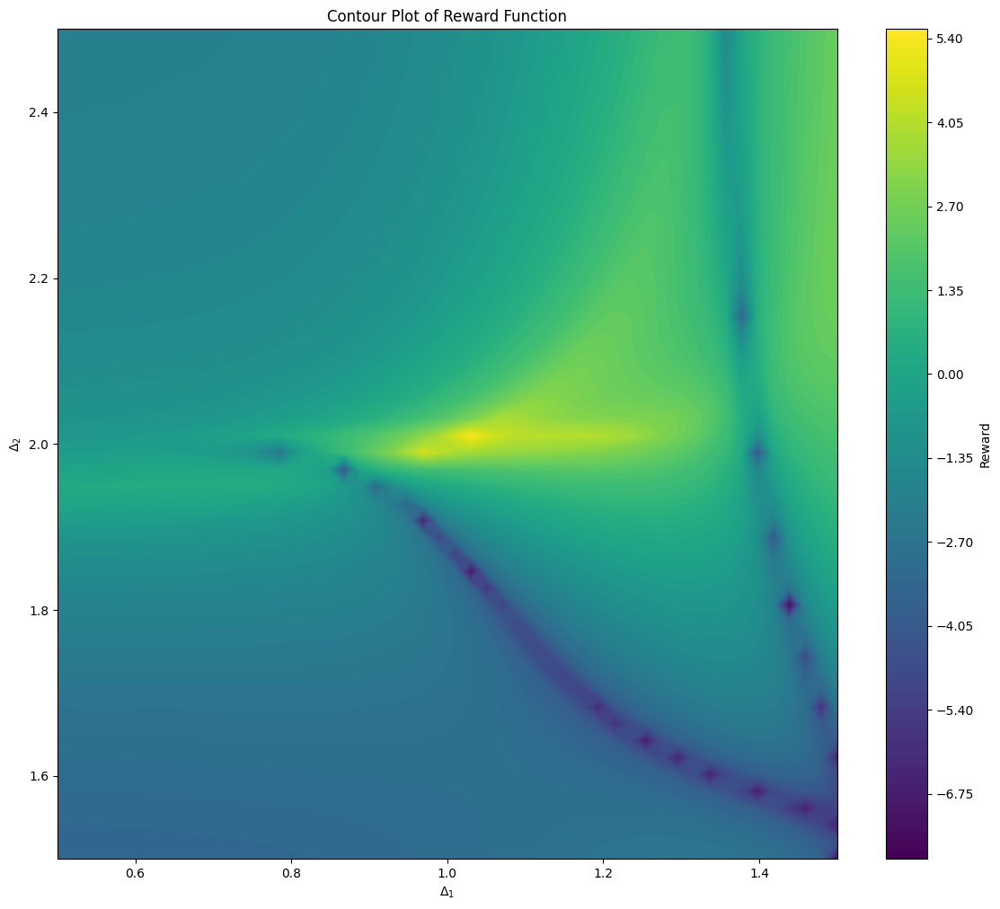

In [16]:
import numpy as np
import itertools
import math
import matplotlib.pyplot as plt

def ftoy(z, delta):
    """
    Compute ftoy(z, delta) = Exp[-delta^2 * z] - Exp[-delta^2 * (1 - z)]
    """
    return math.exp(-delta**2 * z) - math.exp(-delta**2 * (1 - z))

def main_equation(z, Delta1, Delta2):
    """
    Compute the main equation coefficients B, C, D for given z, Delta1, Delta2.
    Equation: B * C1 + C * C2 = D
    where D = Exp[-4*(1 - z)] - Exp[-4*z] + 1/100*(Exp[-64*(1 - z)] - Exp[-64*z]) - 5*(-Exp[-1 + z] + Exp[-z])
    """
    # Compute the constant terms
    A = (math.exp(-4 * (1 - z)) - math.exp(-4 * z) +
         (1/100) * (math.exp(-64 * (1 - z)) - math.exp(-64 * z)) -
         5 * (-math.exp(-1 + z) + math.exp(-z)))
    
    # Compute coefficients for C1 and C2
    B = -math.exp(-((1 - z) * Delta1**2)) + math.exp(-z * Delta1**2)
    C = -math.exp(-((1 - z) * Delta2**2)) + math.exp(-z * Delta2**2)
    
    D = -A  # Rearranged to B*C1 + C*C2 = D
    return (B, C, D)

def derivative_equations(Delta1, Delta2):
    """
    Define the derivative equations explicitly as provided.
    Each derivative equation is of the form:
    B_deriv * C1 + C_deriv * C2 = D_deriv
    """
    # Constants from the user-provided Mathematica expressions
    eq1 = (
        2.0 * math.exp(-0.5 * Delta1**2) * Delta1**2,
        2.0 * math.exp(-0.5 * Delta2**2) * Delta2**2,
        7.147988863019252
    )
    
    eq2 = (
        0.3333333333333333 * math.exp(-0.5 * Delta1**2) * Delta1**6,
        0.3333333333333333 * math.exp(-0.5 * Delta2**2) * Delta2**6,
        3.8980371419131926
    )
    
    eq3 = (
        0.016666666666666667 * math.exp(-0.5 * Delta1**2) * Delta1**10,
        0.016666666666666667 * math.exp(-0.5 * Delta2**2) * Delta2**10,
        2.3602663911472502
    )
    
    eq4 = (
        0.00039682539682539683 * math.exp(-0.5 * Delta1**2) * Delta1**14,
        0.00039682539682539683 * math.exp(-0.5 * Delta2**2) * Delta2**14,
        0.8810978138186971
    )
    
    eq5 = (
        5.511463844797178e-6 * math.exp(-0.5 * Delta1**2) * Delta1**18,
        5.511463844797178e-6 * math.exp(-0.5 * Delta2**2) * Delta2**18,
        0.19556132338694376
    )
    
    return [eq1, eq2, eq3, eq4, eq5]

def get_all_equations(z_samples, Delta1, Delta2):
    """
    Combine main equations for all z_samples with derivative equations.
    Returns a list of equations where each equation is a tuple (B, C, D).
    Represented as B*C1 + C*C2 = D
    """
    equations = []
    
    # Main equations for each z in z_samples
    for z in z_samples:
        eq = main_equation(z, Delta1, Delta2)
        equations.append(eq)
    
    # Derivative equations
    deriv_eqns = derivative_equations(Delta1, Delta2)
    equations.extend(deriv_eqns)
    
    return equations

def solve_subsets(equations):
    """
    For all 2-element subsets of equations, solve for C1 and C2.
    Collect all valid solutions.
    Returns:
        means: Tuple containing mean of C1 and mean of C2
        stds: Tuple containing std of C1 and std of C2
    """
    solutions = []
    subsets = itertools.combinations(equations, 2)
    
    for subset in subsets:
        (B1, C1, D1), (B2, C2, D2) = subset
        # Form the coefficient matrix and constant vector
        A = np.array([[B1, C1],
                      [B2, C2]])
        D = np.array([D1, D2])
        try:
            sol = np.linalg.solve(A, D)
            solutions.append(sol)
        except np.linalg.LinAlgError:
            # Singular or ill-conditioned matrix, skip this subset
            continue
    
    if len(solutions) == 0:
        return None, None
    
    solutions = np.array(solutions)
    C1_mean = np.mean(solutions[:,0])
    C1_std = np.std(solutions[:,0], ddof=1)
    C2_mean = np.mean(solutions[:,1])
    C2_std = np.std(solutions[:,1], ddof=1)
    
    return (C1_mean, C2_mean), (C1_std, C2_std)

def get_reward(means, stds):
    """
    Calculate the reward based on the mean and std of C1 and C2.
    Reward = - (log(abs(std1 / mean1)) + log(abs(std2 / mean2)))
    """
    C1_mean, C2_mean = means
    C1_std, C2_std = stds
    
    # Avoid division by zero by adding a small epsilon
    epsilon = 1e-8
    ratio1 = np.abs(C1_std / (C1_mean + epsilon))
    ratio2 = np.abs(C2_std / (C2_mean + epsilon))
    
    # Clip ratios to avoid log(0)
    min_ratio = 1e-8
    ratio1 = np.clip(ratio1, min_ratio, None)
    ratio2 = np.clip(ratio2, min_ratio, None)
    
    reward = - (np.log(ratio1) + np.log(ratio2))
    return reward

def compute_reward(Delta1, Delta2, z_samples):
    """
    Compute the reward for given Delta1 and Delta2 based on the sampled z values.
    """
    equations = get_all_equations(z_samples, Delta1, Delta2)
    means, stds = solve_subsets(equations)
    if means is None or stds is None:
        # Assign a very low reward if no solutions are found
        return -1e6
    reward = get_reward(means, stds)
    return reward

def plot_reward_function(z_samples, Delta1_range, Delta2_range, num_points=50):
    """
    Plot the reward function over specified ranges of Delta1 and Delta2.
    """
    Delta1_vals = np.linspace(Delta1_range[0], Delta1_range[1], num_points)
    Delta2_vals = np.linspace(Delta2_range[0], Delta2_range[1], num_points)
    
    Delta1_grid, Delta2_grid = np.meshgrid(Delta1_vals, Delta2_vals)
    reward_grid = np.zeros_like(Delta1_grid)
    
    total_iterations = num_points * num_points
    current_iteration = 0
    
    print("Computing rewards for contour plot...")
    for i in range(num_points):
        for j in range(num_points):
            Delta1 = Delta1_grid[i, j]
            Delta2 = Delta2_grid[i, j]
            reward = compute_reward(Delta1, Delta2, z_samples)
            reward_grid[i, j] = reward
            current_iteration += 1
        if (i+1) % 10 == 0:
            print(f"Completed {i+1}/{num_points} rows")
    
    # Handle extremely low rewards for better visualization
    reward_grid = np.where(reward_grid < -1e5, -1e5, reward_grid)
    
    # Plot the contour
    plt.figure(figsize=(14, 12))
    contour = plt.contourf(Delta1_grid, Delta2_grid, reward_grid, levels=100, cmap='viridis')
    plt.colorbar(contour, label='Reward')
    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title('Contour Plot of Reward Function')
    plt.show()

if __name__ == "__main__":
    # Define z samples between 0.3 and 0.49 with 20 samples
    z_samples = np.linspace(0.3, 0.49, 20)  # 0.3, 0.31, ..., 0.49
    
    # Define ranges for Delta1 and Delta2
    Delta1_range = (0.5, 1.5)  # Adjust as needed
    Delta2_range = (1.5, 2.5)  # Adjust as needed
    
    # Plot the reward function
    plot_reward_function(z_samples, Delta1_range, Delta2_range, num_points=50)


In [116]:
import gym
from gym import spaces
import numpy as np
import itertools
import math

class StandardDeviationEnv(gym.Env):
    """
    Custom Environment that uses the exact reward computation code provided,
    now updated to include an improvement reward.

    Actions:
        - Step in Delta1 space
        - Step in Delta2 space
    Observations:
        - Delta1
        - Delta2
        - C1
        - C2
        - std_over_mean_sum (error metric)
    """
    metadata = {'render.modes': ['human']}

    def __init__(
        self,
        min_delta1: float = 0.5,
        max_delta1: float = 1.5,
        min_delta2: float = 1.6,
        max_delta2: float = 2.4,
        delta_lr: float = 0.2,
        max_episode_steps: int = 50,
        improvement_reward_weight: float = 10.0,  # Added improvement reward weight
       # z_samples: np.ndarray = np.linspace(0.3, 0.49, 20),
    ):
        super(StandardDeviationEnv, self).__init__()
        self.data_type = np.float32

        # Parameters
        self.min_delta1 = min_delta1
        self.max_delta1 = max_delta1
        self.min_delta2 = min_delta2
        self.max_delta2 = max_delta2
        self.delta_lr = delta_lr  # Learning rate for delta updates
        self.max_episode_steps = max_episode_steps

        # Initialize variables
        self.reward = 0.0
        self.prev_reward = None  # For improvement reward
        self.improvement_reward_weight = improvement_reward_weight  # Weight for improvement reward
        self.std_over_mean_sum = None

        # Initialize delta1 and delta2
        self.delta1 = 1.56
        self.delta2 = 2.7

        # z_samples for main equations
        #self.z_samples = z_samples

        # Action and observation spaces
        # Actions: delta1_step, delta2_step
        action_low = np.array([-1.0, -1.0], dtype=self.data_type)
        action_high = np.array([1.0, 1.0], dtype=self.data_type)

        # Observations: delta1, delta2, c1, c2, reward
        obs_low = np.array(
            [self.min_delta1, self.min_delta2, -np.inf, -np.inf],
            dtype=self.data_type
        )
        obs_high = np.array(
            [self.max_delta1, self.max_delta2, np.inf, np.inf],
            dtype=self.data_type
        )

        self.action_space = spaces.Box(low=action_low, high=action_high, dtype=self.data_type)
        self.observation_space = spaces.Box(low=obs_low, high=obs_high, dtype=self.data_type)

        # Count steps
        self.num_steps = 0

        # Initialize state variables
        self.reset()

    # Functions provided by you

    def ftoy(self, z, delta):
        """
        Compute ftoy(z, delta) = Exp[-delta^2 * z] - Exp[-delta^2 * (1 - z)]
        """
        return math.exp(-delta**2 * z) - math.exp(-delta**2 * (1 - z))

    def main_equation(self, z, Delta1, Delta2):
        """
        Compute the main equation coefficients B, C, D for given z, Delta1, Delta2.
        Equation: B * C1 + C * C2 = D
        where D = Exp[-4*(1 - z)] - Exp[-4*z] + 1/100*(Exp[-64*(1 - z)] - Exp[-64*z]) - 5*(-Exp[-1 + z] + Exp[-z])
        """
        # Compute the constant terms
        A = (math.exp(-4 * (1 - z)) - math.exp(-4 * z) +
             (1/100) * (math.exp(-64 * (1 - z)) - math.exp(-64 * z)) -
             5 * (-math.exp(-1 + z) + math.exp(-z)))

        # Compute coefficients for C1 and C2
        B = -math.exp(-((1 - z) * Delta1**2)) + math.exp(-z * Delta1**2)
        C = -math.exp(-((1 - z) * Delta2**2)) + math.exp(-z * Delta2**2)

        D = -A  # Rearranged to B*C1 + C*C2 = D
        return (B, C, D)

    def derivative_equations(self, Delta1, Delta2):
        """
        Define the derivative equations explicitly as provided.
        Each derivative equation is of the form:
        B_deriv * C1 + C_deriv * C2 = D_deriv
        """
        # Constants from the provided expressions
        eq1 = (
            2.0 * math.exp(-0.5 * Delta1**2) * Delta1**2,
            2.0 * math.exp(-0.5 * Delta2**2) * Delta2**2,
            7.147988863019252
        )

        eq2 = (
            0.3333333333333333 * math.exp(-0.5 * Delta1**2) * Delta1**6,
            0.3333333333333333 * math.exp(-0.5 * Delta2**2) * Delta2**6,
            3.8980371419131926
        )

        eq3 = (
            0.016666666666666667 * math.exp(-0.5 * Delta1**2) * Delta1**10,
            0.016666666666666667 * math.exp(-0.5 * Delta2**2) * Delta2**10,
            2.3602663911472502
        )

        eq4 = (
            0.00039682539682539683 * math.exp(-0.5 * Delta1**2) * Delta1**14,
            0.00039682539682539683 * math.exp(-0.5 * Delta2**2) * Delta2**14,
            0.8810978138186971
        )

        eq5 = (
            5.511463844797178e-6 * math.exp(-0.5 * Delta1**2) * Delta1**18,
            5.511463844797178e-6 * math.exp(-0.5 * Delta2**2) * Delta2**18,
            0.19556132338694376
        )

        return [eq1, eq2, eq3, eq4, eq5]

    def get_all_equations(self, Delta1, Delta2):
        """
        Combine main equations for all z_samples with derivative equations.
        Returns a list of equations where each equation is a tuple (B, C, D).
        Represented as B*C1 + C*C2 = D
        """
        equations = []

        # Main equations for each z in z_samples
        for z in np.random.uniform(0.3, 0.50, 20):
            eq = self.main_equation(z, Delta1, Delta2)
            equations.append(eq)

        # Derivative equations
        deriv_eqns = self.derivative_equations(Delta1, Delta2)
        equations.extend(deriv_eqns)

        return equations

    def solve_subsets(self, equations):
        """
        For all 2-element subsets of equations, solve for C1 and C2.
        Collect all valid solutions.
        Returns:
            means: Tuple containing mean of C1 and mean of C2
            stds: Tuple containing std of C1 and std of C2
        """
        solutions = []
        subsets = itertools.combinations(equations, 2)

        for subset in subsets:
            (B1, C1_coef, D1), (B2, C2_coef, D2) = subset
            # Form the coefficient matrix and constant vector
            A = np.array([[B1, C1_coef],
                          [B2, C2_coef]], dtype=self.data_type)
            D = np.array([D1, D2], dtype=self.data_type)
            try:
                sol = np.linalg.solve(A, D)
                solutions.append(sol)
            except np.linalg.LinAlgError:
                # Singular or ill-conditioned matrix, skip this subset
                continue

        if len(solutions) == 0:
            return None, None

        solutions = np.array(solutions)
        C1_mean = np.mean(solutions[:,0])
        C1_std = np.std(solutions[:,0], ddof=1)
        C2_mean = np.mean(solutions[:,1])
        C2_std = np.std(solutions[:,1], ddof=1)

        return (C1_mean, C2_mean), (C1_std, C2_std)

    def get_reward(self, means, stds):
        """
        Calculate the reward based on the mean and std of C1 and C2.
        Reward = - (log(abs(std1 / mean1)) + log(abs(std2 / mean2)))
        """
        C1_mean, C2_mean = means
        C1_std, C2_std = stds

        # Avoid division by zero by adding a small epsilon
        epsilon = 1e-8
        ratio1 = np.abs(C1_std / (C1_mean + epsilon))
        ratio2 = np.abs(C2_std / (C2_mean + epsilon))

        # Clip ratios to avoid log(0)
        min_ratio = 1e-8
        ratio1 = np.clip(ratio1, min_ratio, None)
        ratio2 = np.clip(ratio2, min_ratio, None)

        reward = - (np.log(ratio1) + np.log(ratio2))
        return reward

    def compute_reward(self, Delta1, Delta2):
        """
        Compute the reward for given Delta1 and Delta2 based on the sampled z values.
        """
        equations = self.get_all_equations(Delta1, Delta2)
        means, stds = self.solve_subsets(equations)
        if means is None or stds is None:
            # Assign a very low reward if no solutions are found
            self.cs = np.array([0.0, 0.0])
            self.std_over_mean_sum = 1e6
            return -1e6
        reward = self.get_reward(means, stds)
        self.cs = np.array(means)
        # Compute std_over_mean_sum for observation
        epsilon = 1e-8
        cs_mean_safe = np.where(np.abs(self.cs) < epsilon, epsilon, np.abs(self.cs))
        std_over_mean = np.array(stds) / cs_mean_safe
        self.std_over_mean_sum = np.sum(std_over_mean)
        return reward

    # Rest of the environment methods

    def _get_obs(self):
        return np.concatenate(
            [np.array([self.delta1, self.delta2], dtype=self.data_type), self.cs],
            dtype=self.data_type
        )

    def reset(self):
        self.num_steps = 0

        # Initialize delta1 and delta2 randomly within bounds
        self.delta1 = np.random.uniform(self.min_delta1, self.max_delta1)
        self.delta2 = np.random.uniform(self.min_delta2, self.max_delta2)

        # Compute initial reward and observation
        self.reward = self.compute_reward(self.delta1, self.delta2)
        self.prev_reward = None  # Reset previous reward

        observation = self._get_obs()
        return observation

    def step(self, action):
        self.num_steps += 1

        # Update delta1 and delta2
        delta1 = self.delta1 + self.delta_lr * action[0]
        delta2 = self.delta2 + self.delta_lr * action[1]

        # Check boundary conditions
        is_ok = self.delta_bc(delta1, delta2)

        done = False

        if not is_ok:
            # Penalize the agent for invalid deltas
            total_reward = -10.0
            done = True
            observation = self._get_obs()
            return observation, total_reward, done, {}

        # Update deltas
        self.delta1 = delta1
        self.delta2 = delta2

        # Store previous reward
        prev_reward = self.reward

        # Compute the new reward
        self.reward = self.compute_reward(self.delta1, self.delta2)

        # Compute improvement reward
        if prev_reward is not None:
            improvement_reward = self.reward - prev_reward
        else:
            improvement_reward = 0.0  # No improvement at the first step

        # Total reward includes improvement reward
        total_reward = self.reward + self.improvement_reward_weight * improvement_reward

        # Update previous reward
        self.prev_reward = self.reward

        # Check if episode should be truncated due to max steps
        if self.num_steps >= self.max_episode_steps:
            done = True

        # Check for NaNs in observation
        observation = self._get_obs()
        if np.isnan(observation).any():
            total_reward = -10.0
            done = True
            return observation, total_reward, done, {}

        return observation, total_reward, done, {}

    def delta_bc(self, delta1, delta2):
        # Check delta bounds
        if delta1 < self.min_delta1 or delta1 > self.max_delta1:
            return False
        if delta2 < self.min_delta2 or delta2 > self.max_delta2:
            return False
        return True

    def render(self, mode='human'):
        """
        Render the environment.
        """
        print(f"Step: {self.num_steps}")
        print(f"Delta1: {self.delta1:.4f}, Delta2: {self.delta2:.4f}")
        print(f"C1: {self.cs[0]:.4f}, C2: {self.cs[1]:.4f}")
        print(f"Std over Mean Sum: {self.std_over_mean_sum:.4f}")
        print(f"Reward: {self.reward:.4f}")
        print("-" * 30)

    def close(self):
        pass


In [44]:
env = StandardDeviationEnv()


In [118]:

from stable_baselines3 import PPO
from stable_baselines3.common.env_checker import check_env
import matplotlib.pyplot as plt

# Assuming the StandardDeviationEnv class is defined in the same script or imported appropriately

# Initialize the environment
env = StandardDeviationEnv(improvement_reward_weight=100,delta_lr=0.01)



# Create the RL model
model = SAC(
    'MlpPolicy',
    env,
    verbose=1,
    tensorboard_log="./sac_standard_deviation_tensorboard/",
    # You can adjust hyperparameters here
    learning_rate=3e-4,
    buffer_size=1000000,
    learning_starts=10000,
    batch_size=256,
    tau=0.005,
    gamma=0.99,
    train_freq=1,
    gradient_steps=1,
    ent_coef='auto',
    target_update_interval=1,
)

# Train the agent
# Adjust the total_timesteps based on computational resources
model.learn(total_timesteps=100000)

# Save the trained model
model.save("sac_standard_deviation1")

# To load the model later:
# model = PPO.load("ppo_standard_deviation")


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./sac_standard_deviation_tensorboard/SAC_2


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -48      |
| time/              |          |
|    episodes        | 4        |
|    fps             | 155      |
|    time_elapsed    | 1        |
|    total_timesteps | 200      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -37.3    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 147      |
|    time_elapsed    | 2        |
|    total_timesteps | 400      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -41      |
| time/              |          |
|    episodes        | 12       |
|    fps             | 149      |
|    time_elapsed    | 4        |
|    total_timesteps | 600      |
--------------

In [34]:
model.save("ppo_standard_deviation")


[   0.6600784    1.9510561 -324.0221       1.34204  ]
[1.0662256  2.1901767  7.1853623  0.67023504]
[6.1995447e-01 2.1672380e+00 2.0730320e+03 9.7398150e-01]
[1.2630858 2.1940732 5.0362167 0.3199611]
[ 0.9642842  1.8389933 -5.6149898  1.5846602]
[ 1.4289955   2.2603648   5.0054345  -0.20613362]
[1.4138303 1.6026536 1.3002335 2.7965784]
[ 6.5576774e-01  1.6993439e+00 -3.3010166e+03  3.0485213e+00]
[  0.89100826   1.7712908  -38.162872     2.1135495 ]
[5.9386456e-01 2.1596842e+00 3.5628162e+03 9.8719686e-01]
[ 1.4682329  2.3468142  5.0649776 -0.356685 ]
[  0.99239117   1.6074724  -27.520033     4.743574  ]
[1.2149822  1.987138   4.451778   0.65448385]
[1.1690546  2.1124258  5.20437    0.58134913]
[1.2473162 2.3282769 5.304564  0.3004709]
[1.3833022 1.8325793 4.269613  0.3602273]
[1.1474917  2.042748   4.905652   0.70728385]
[ 1.4861338  1.7932646  5.11124   -0.5189606]
[1.3473742  1.8075117  3.8795621  0.68428856]
[1.2649932 1.8470396 3.6838102 0.8938027]
[ 1.3871412  2.1493711  4.909504

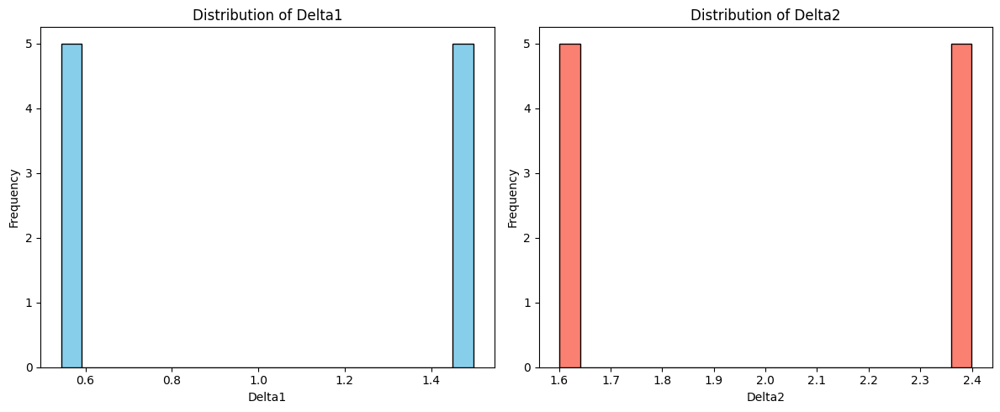

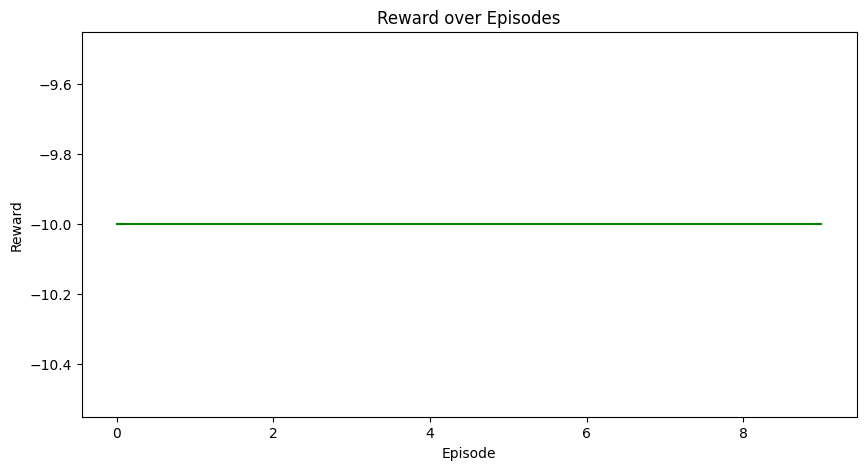

In [82]:
env = StandardDeviationEnv(improvement_reward_weight=100,delta_lr=0.01)

# Number of evaluation episodes
num_episodes = 10

# Lists to store results
delta1_list = []
delta2_list = []
reward_list = []

for episode in range(num_episodes):
    done=False
    while not done:
    
        observation = env.reset()
        print(observation)
        action, _states = model.predict(observation, deterministic=True)
        observation, reward, done, info = env.step(action)
        
    delta1_list.append(env.delta1)
    delta2_list.append(env.delta2)
    reward_list.append(reward)

# Convert lists to numpy arrays for easier analysis
delta1_array = np.array(delta1_list)
delta2_array = np.array(delta2_list)
reward_array = np.array(reward_list)

# Find the best delta1 and delta2
best_idx = np.argmax(reward_array)
best_delta1 = delta1_array[best_idx]
best_delta2 = delta2_array[best_idx]
best_reward = reward_array[best_idx]

print(f"Best Delta1: {best_delta1}")
print(f"Best Delta2: {best_delta2}")
print(f"Best Reward: {best_reward}")

# Plotting the distribution of selected deltas
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(delta1_array, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Delta1')
plt.xlabel('Delta1')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(delta2_array, bins=20, color='salmon', edgecolor='black')
plt.title('Distribution of Delta2')
plt.xlabel('Delta2')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Plot reward over episodes
plt.figure(figsize=(10, 5))
plt.plot(reward_array, color='green')
plt.title('Reward over Episodes')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.show()

Computing immediate rewards over the delta plane...


  0%|          | 0/50 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
100%|██████████| 50/50 [00:15<00:00,  3.17it/s]


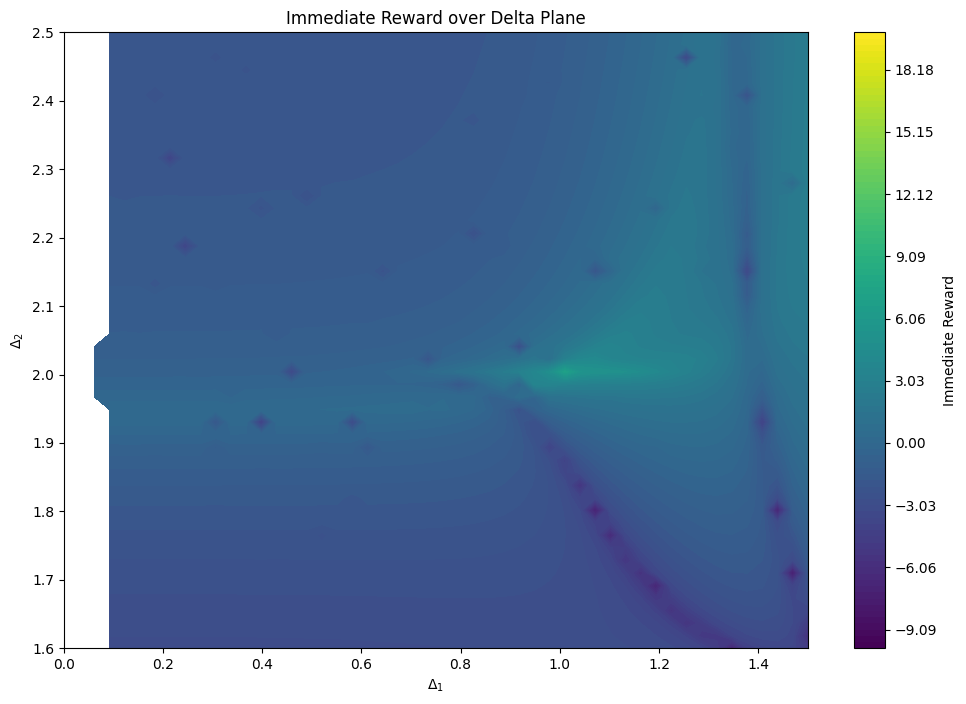

In [117]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from tqdm import tqdm

# Assuming StandardDeviationEnv is already defined and adjusted
env = StandardDeviationEnv()

# Modify the solve_subsets method to use all combinations


# Now proceed to compute the immediate rewards over the delta plane
delta1_values = np.linspace(0, 1.5, 50)
delta2_values = np.linspace(1.6, 2.5, 50)
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)
immediate_reward_grid = np.zeros_like(delta1_grid)

epsilon = 1e-8

print("Computing immediate rewards over the delta plane...")
for i in tqdm(range(delta1_grid.shape[0])):
    for j in range(delta1_grid.shape[1]):
        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]

        # Set deltas
        env.delta1 = delta1
        env.delta2 = delta2

        # Compute reward
        immediate_reward =env.compute_reward( env.delta1, env.delta2)
      
        immediate_reward_grid[i, j] = immediate_reward

# Apply clipping for visualization
immediate_reward_grid = np.where(immediate_reward_grid < -1e5, -1e5, immediate_reward_grid)

# Plotting
plt.figure(figsize=(12, 8))
contour = plt.contourf(delta1_grid, delta2_grid, immediate_reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
plt.colorbar(contour, label='Immediate Reward')
plt.xlabel(r'$\Delta_1$')
plt.ylabel(r'$\Delta_2$')
plt.title('Immediate Reward over Delta Plane')
plt.show()


Computing immediate rewards over the delta plane...


  0%|          | 0/50 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
100%|██████████| 50/50 [00:15<00:00,  3.28it/s]


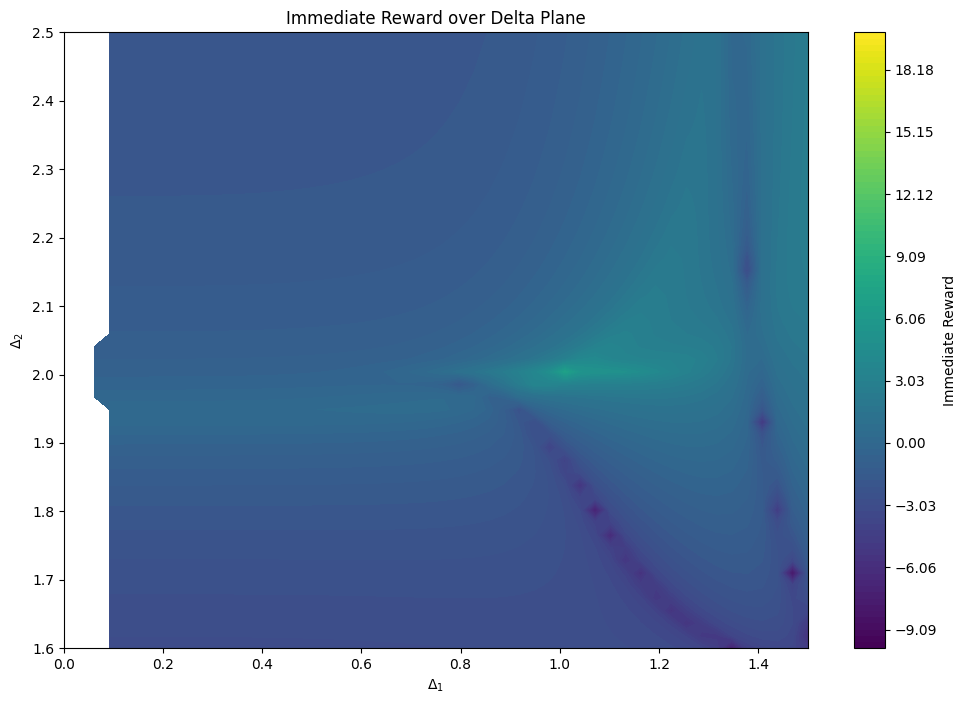

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from tqdm import tqdm

# Assuming StandardDeviationEnv is already defined and adjusted
env = StandardDeviationEnv()

# Modify the solve_subsets method to use all combinations


# Now proceed to compute the immediate rewards over the delta plane
delta1_values = np.linspace(0, 1.5, 50)
delta2_values = np.linspace(1.6, 2.5, 50)
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)
immediate_reward_grid = np.zeros_like(delta1_grid)

epsilon = 1e-8

print("Computing immediate rewards over the delta plane...")
for i in tqdm(range(delta1_grid.shape[0])):
    for j in range(delta1_grid.shape[1]):
        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]

        # Set deltas
        env.delta1 = delta1
        env.delta2 = delta2

        # Compute reward
        immediate_reward =env.compute_reward( env.delta1, env.delta2)
      
        immediate_reward_grid[i, j] = immediate_reward

# Apply clipping for visualization
immediate_reward_grid = np.where(immediate_reward_grid < -1e5, -1e5, immediate_reward_grid)

# Plotting
plt.figure(figsize=(12, 8))
contour = plt.contourf(delta1_grid, delta2_grid, immediate_reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
plt.colorbar(contour, label='Immediate Reward')
plt.xlabel(r'$\Delta_1$')
plt.ylabel(r'$\Delta_2$')
plt.title('Immediate Reward over Delta Plane')
plt.show()


In [121]:
env = StandardDeviationEnv(improvement_reward_weight=100,delta_lr=0.01)

# Load the trained model
model = SAC.load("sac_standard_deviation1")



# Number of evaluation episodes
num_episodes = 100  # You can increase this number to record multiple episodes

# Initialize a list to store trajectories
trajectories = []

for episode in range(num_episodes):
    observation = env.reset()
    done = False
    trajectory = {'delta1': [], 'delta2': [], 'reward': []}
    total_reward = 0.0
    while not done:
        # Record delta1 and delta2 before taking the action
        delta1 = env.delta1
        delta2 = env.delta2
        trajectory['delta1'].append(delta1)
        trajectory['delta2'].append(delta2)
        
        # Agent selects action
        action, _ = model.predict(observation, deterministic=True)
        
        # Environment steps
        observation, reward, done, info = env.step(action)
        total_reward += reward
        
        # Record reward (optional)
        trajectory['reward'].append(reward)
        
    trajectories.append(trajectory)
    print(f"Episode {episode + 1} finished with total reward: {total_reward}")


Episode 1 finished with total reward: 434.5849059426841
Episode 2 finished with total reward: 321.80999097207757
Episode 3 finished with total reward: 203.69194949457096
Episode 4 finished with total reward: 124.07129211723569
Episode 5 finished with total reward: 510.66305668396274
Episode 6 finished with total reward: 431.57583860058895
Episode 7 finished with total reward: 908.1436231805625
Episode 8 finished with total reward: 606.9818905541772
Episode 9 finished with total reward: 572.8851182511718
Episode 10 finished with total reward: 962.2823996818345
Episode 11 finished with total reward: 815.2591975787018
Episode 12 finished with total reward: 618.9686632299336
Episode 13 finished with total reward: -3.962506444039775
Episode 14 finished with total reward: 906.9499107536546
Episode 15 finished with total reward: 368.9831190309825
Episode 16 finished with total reward: 101.3396535920292
Episode 17 finished with total reward: 497.9128552685923
Episode 18 finished with total rew

In [ ]:
# Plot the trajectory for each episode
for idx, traj in enumerate(trajectories):
    plt.figure(figsize=(8, 6))
    plt.plot(traj['delta1'], traj['delta2'], marker='o', linestyle='-', color='blue')
    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title(f'Agent Trajectory in Delta Space (Episode {idx + 1})')
    plt.grid(True)
    plt.show()


In [36]:
(trajectories[0]['delta1'][-1],trajectories[0]['delta2'][-1])

(1.1335978780632696, 2.0786333645059103)

In [38]:
env.delta1,env.delta2=(trajectories[0]['delta1'][-1],trajectories[0]['delta2'][-1])

In [40]:
env.compute_reward(trajectories[0]['delta1'][-1],trajectories[0]['delta2'][-1])

2.740396688225623

In [41]:
env.compute_reward(1,2)

15.208539781440756

In [124]:
# Compute the immediate reward grid for plotting
delta1_values = np.linspace(env.min_delta1, env.max_delta1, 100)
delta2_values = np.linspace(env.min_delta2, env.max_delta2, 100)
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)
immediate_reward_grid = np.zeros_like(delta1_grid)

epsilon = 1e-8

print("Computing immediate rewards over the delta plane...")
for i in range(delta1_grid.shape[0]):
    for j in range(delta1_grid.shape[1]):
        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]

        # Compute reward using the environment's compute_reward function
        reward = env.compute_reward(delta1, delta2)
        immediate_reward_grid[i, j] = reward

# Set the desired min and max reward values for consistent color mapping
min_reward = -50
max_reward = 50
immediate_reward_grid = np.clip(immediate_reward_grid, min_reward, max_reward)




Computing immediate rewards over the delta plane...


random z

In [122]:
(np.mean(np.array([tr['delta1'][-1] for tr in trajectories])),np.std(np.array([tr['delta1'][-1] for tr in trajectories])))

(1.0136770897839944, 0.11216086750198054)

In [123]:
(np.mean(np.array([tr['delta2'][-1] for tr in trajectories])),np.std(np.array([tr['delta2'][-1] for tr in trajectories])))

(2.006295314520665, 0.017487277098894027)

no random z

In [119]:
(np.mean(np.array([tr['delta1'][-1] for tr in trajectories])),np.std(np.array([tr['delta1'][-1] for tr in trajectories])))

(1.0871988930579268, 0.07842598840845566)

In [120]:
(np.mean(np.array([tr['delta2'][-1] for tr in trajectories])),np.std(np.array([tr['delta2'][-1] for tr in trajectories])))

(2.003364778613104, 0.02396155191665517)

rand z

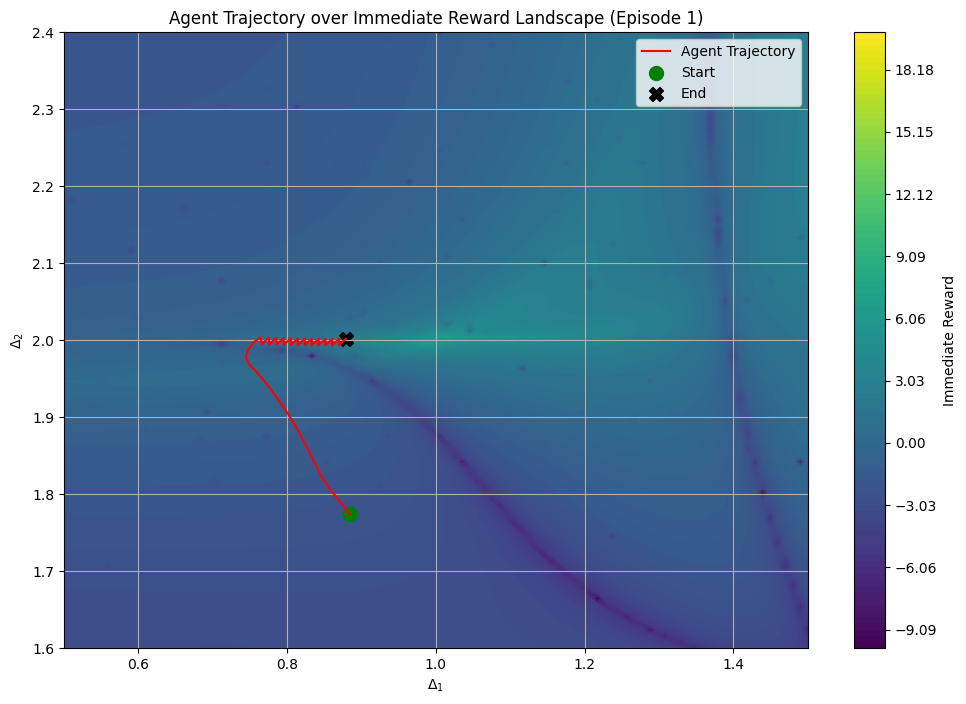

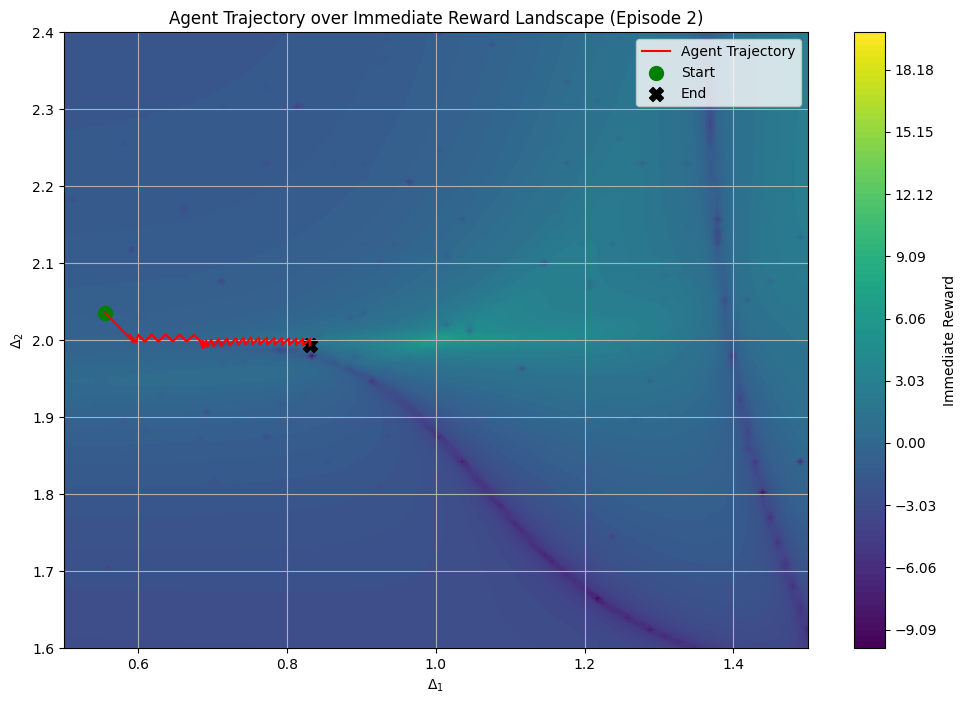

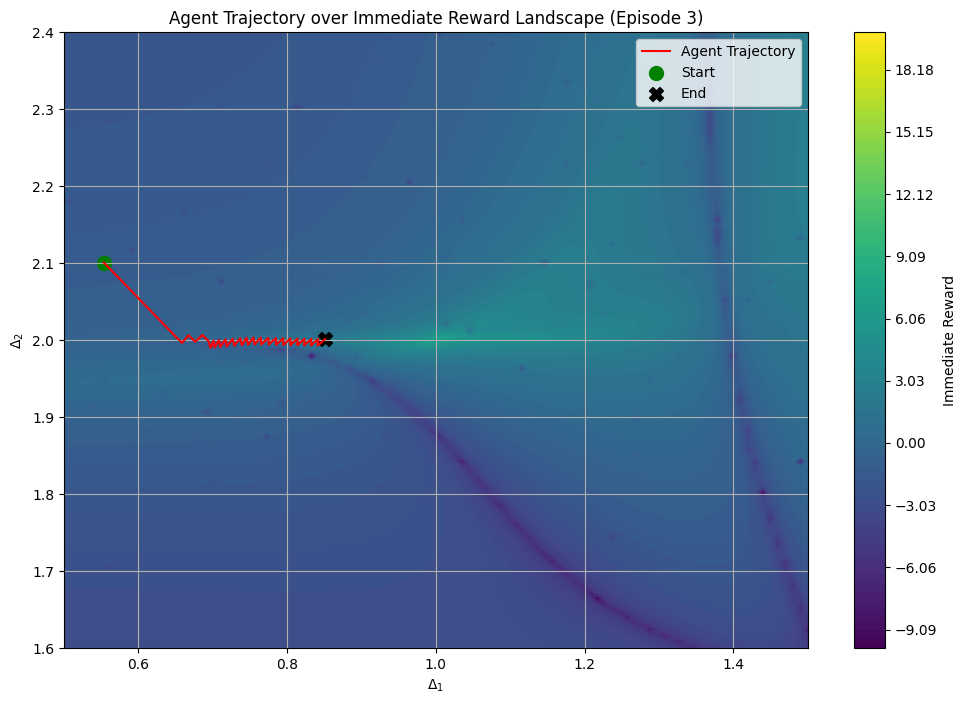

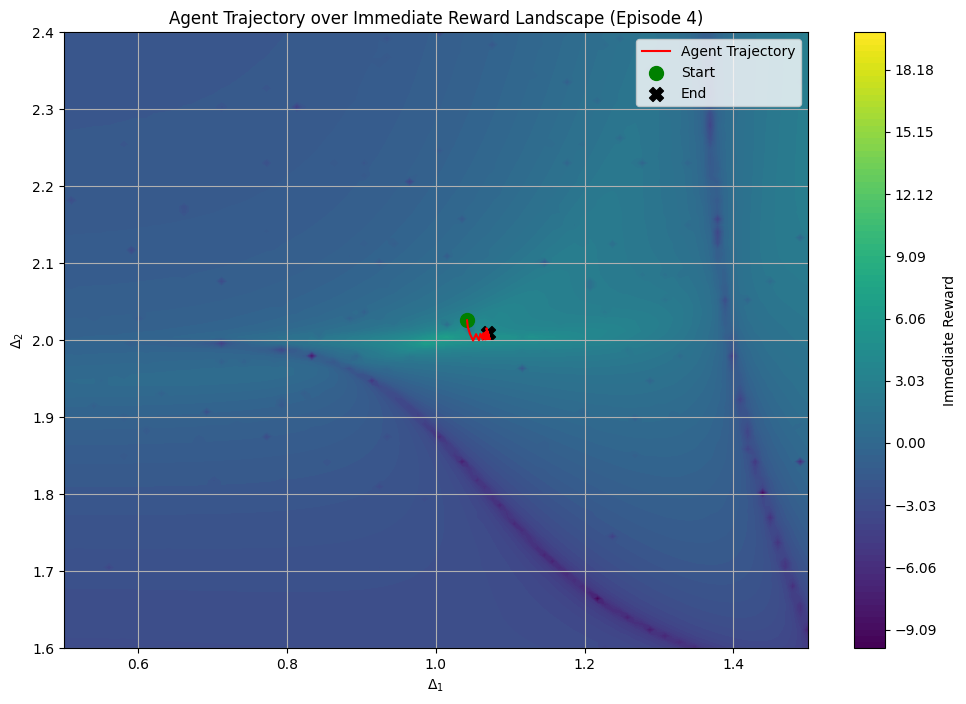

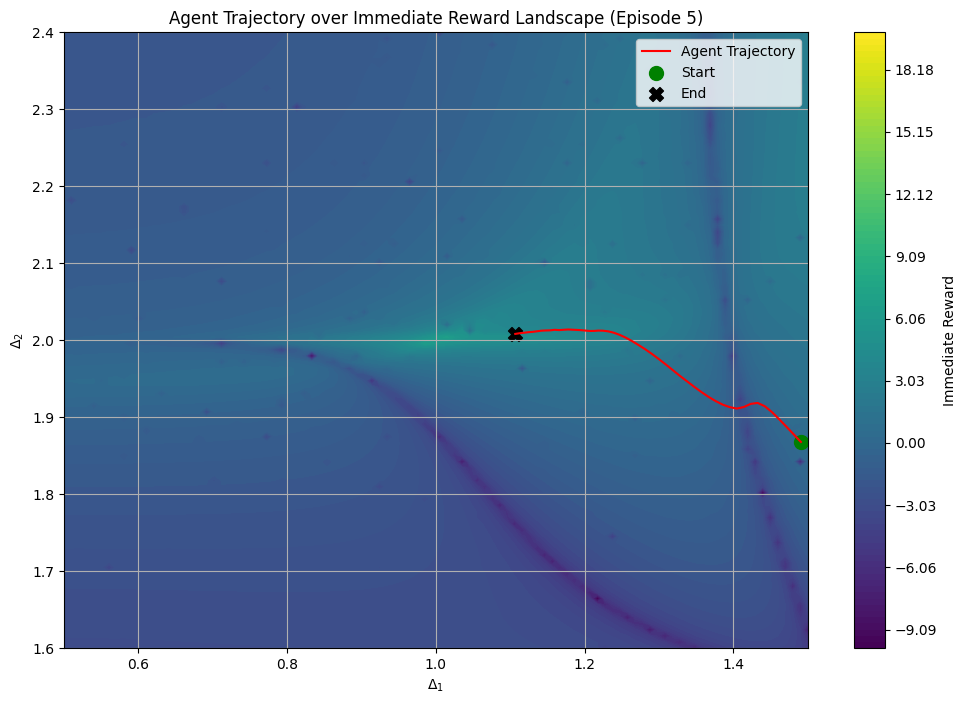

...

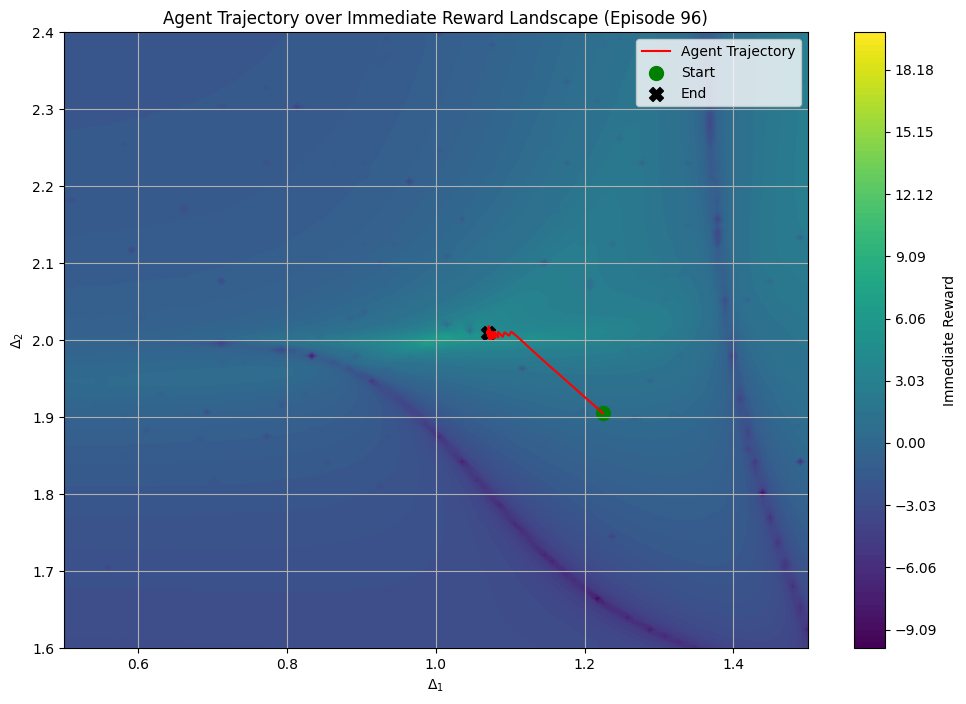

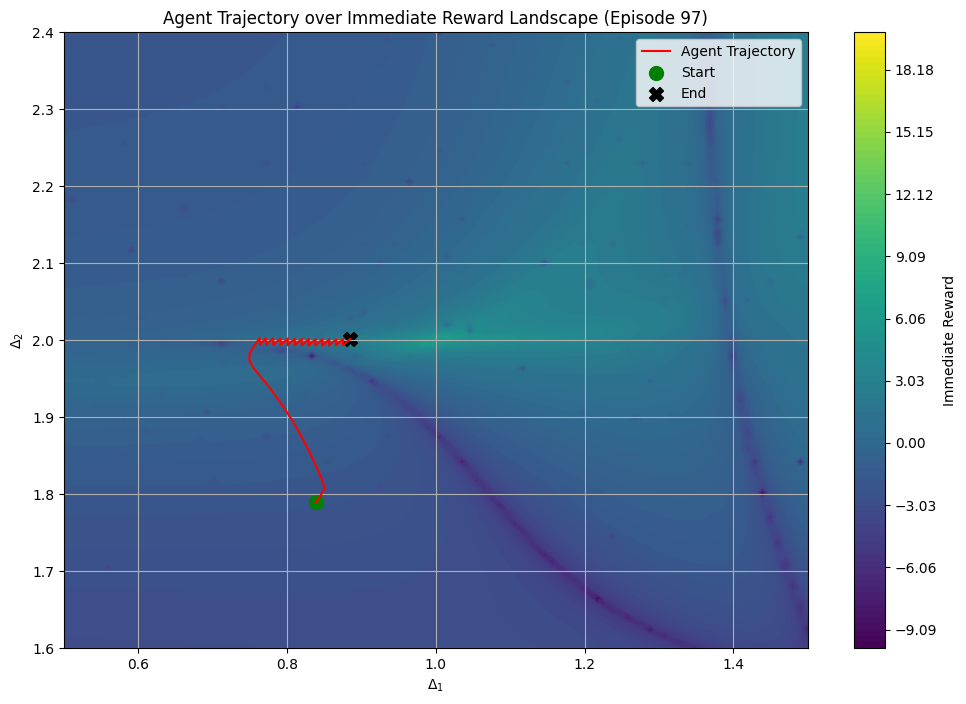

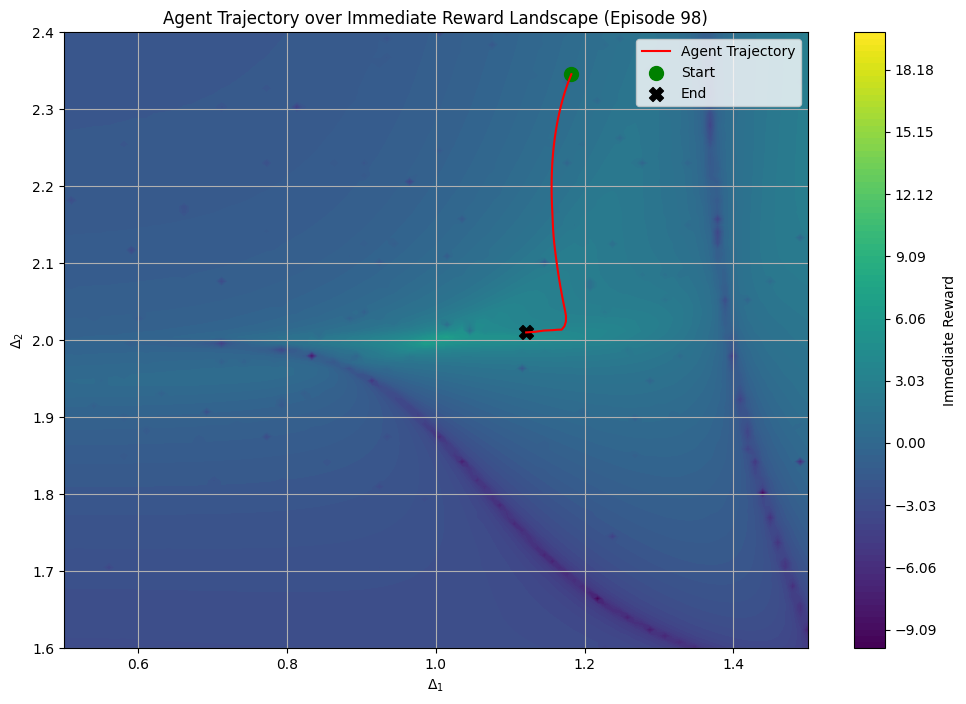

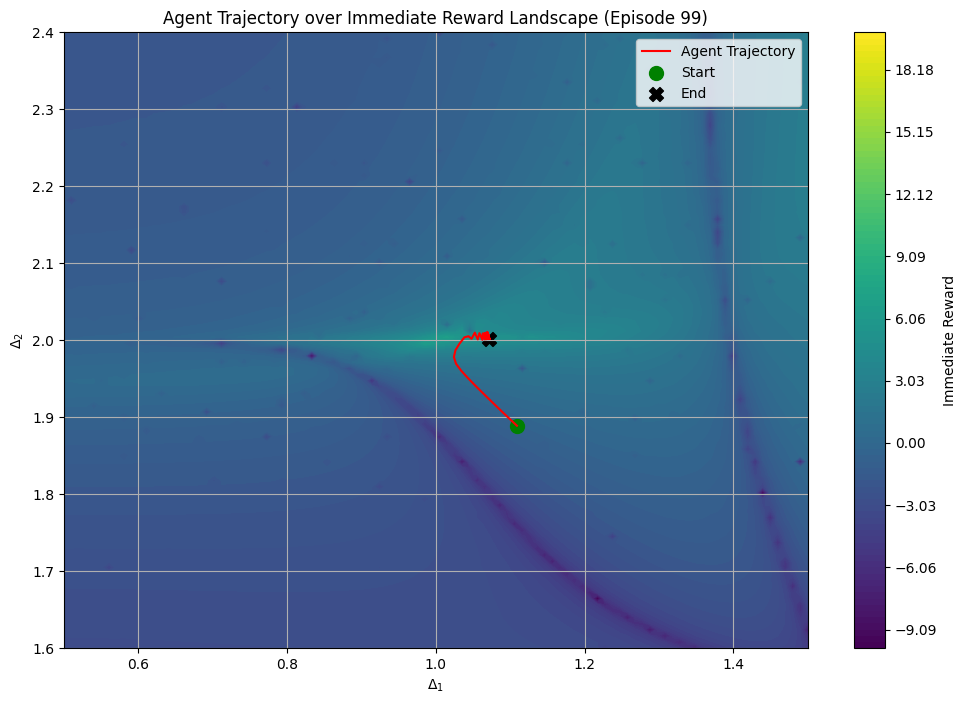

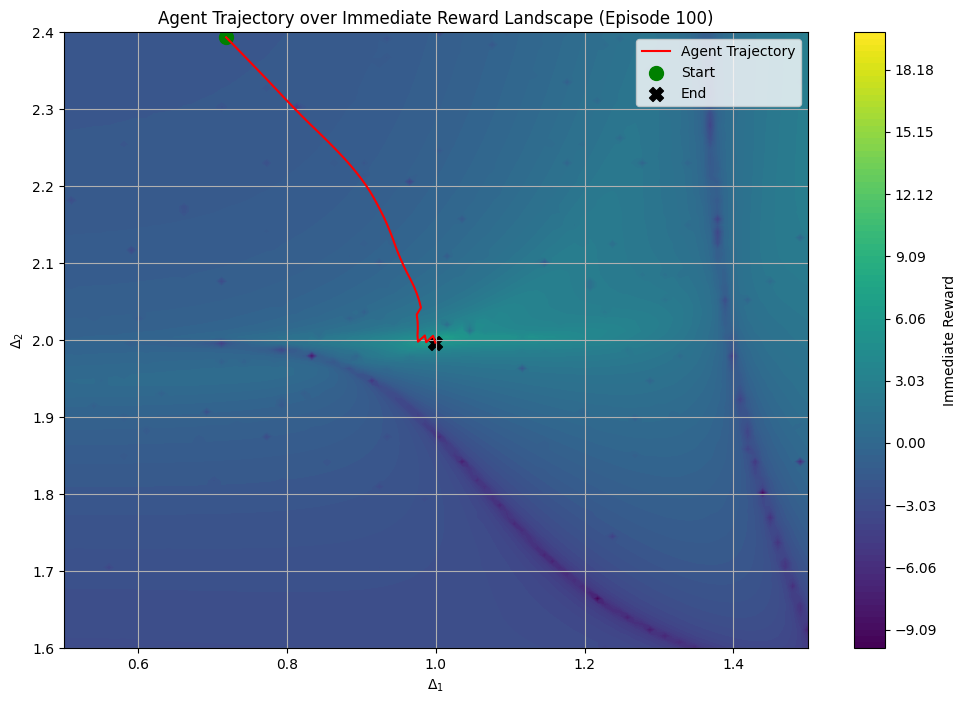

In [125]:
# Plotting the trajectory over the reward landscape
for idx, traj in enumerate(trajectories):
    plt.figure(figsize=(12, 8))
    contour = plt.contourf(delta1_grid, delta2_grid, immediate_reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
    plt.colorbar(contour, label='Immediate Reward')
    plt.plot(traj['delta1'], traj['delta2'],  linestyle='-', color='red', label='Agent Trajectory')
    # Mark the initial point
    plt.scatter(traj['delta1'][0], traj['delta2'][0], color='green', s=100, marker='o', label='Start')
    
    # Mark the final point
    plt.scatter(traj['delta1'][-1], traj['delta2'][-1], color='black', s=100, marker='X', label='End')

    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title(f'Agent Trajectory over Immediate Reward Landscape (Episode {idx + 1})')
    plt.legend()
    plt.grid(True)
    plt.show()

no random z

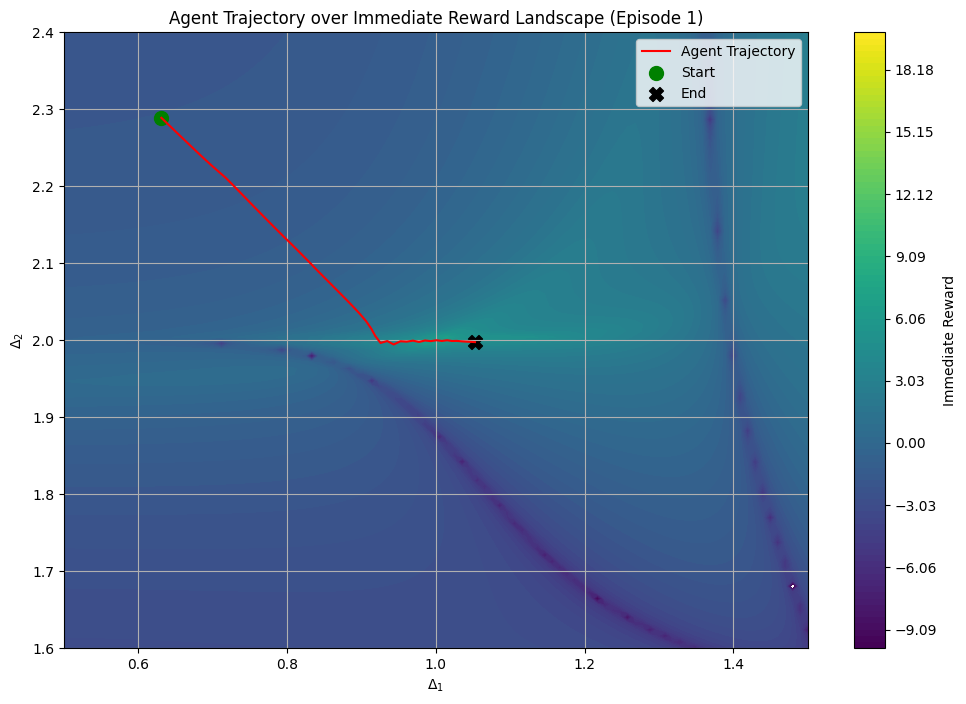

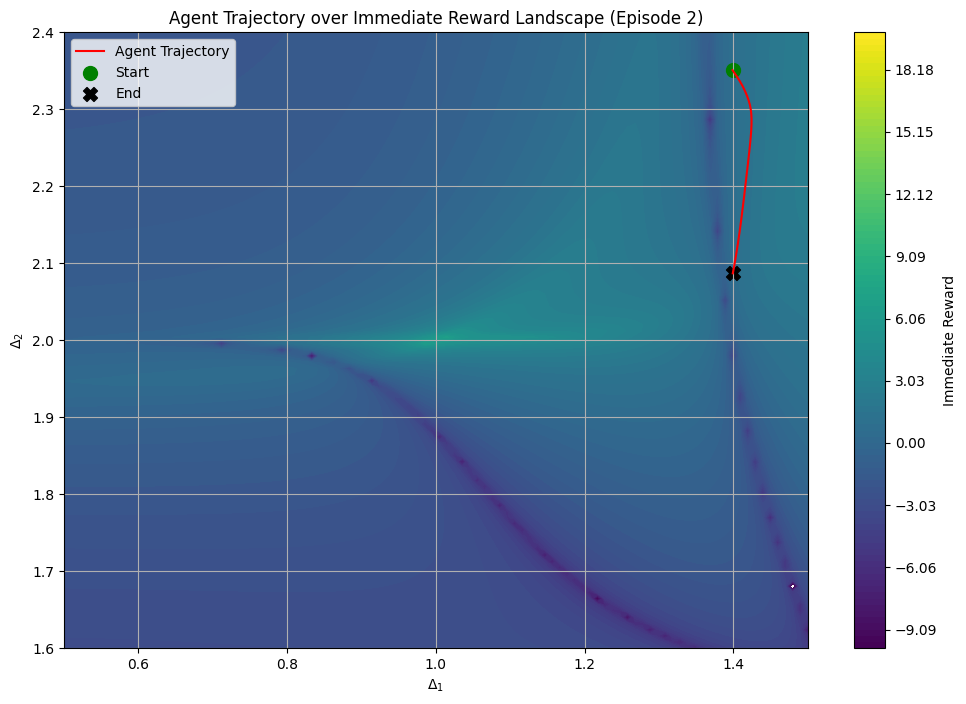

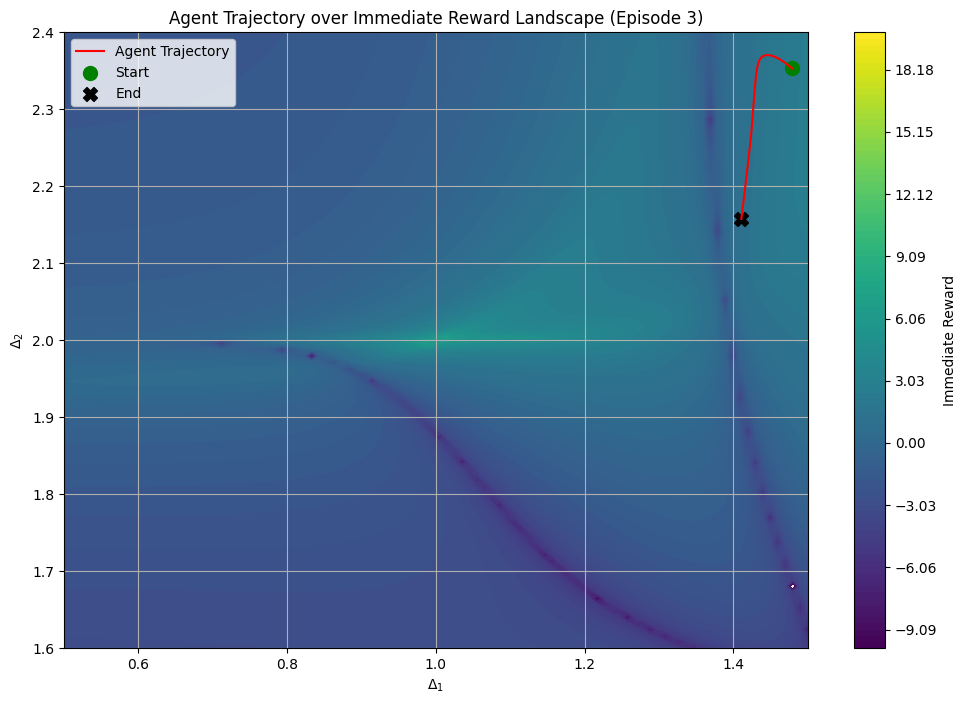

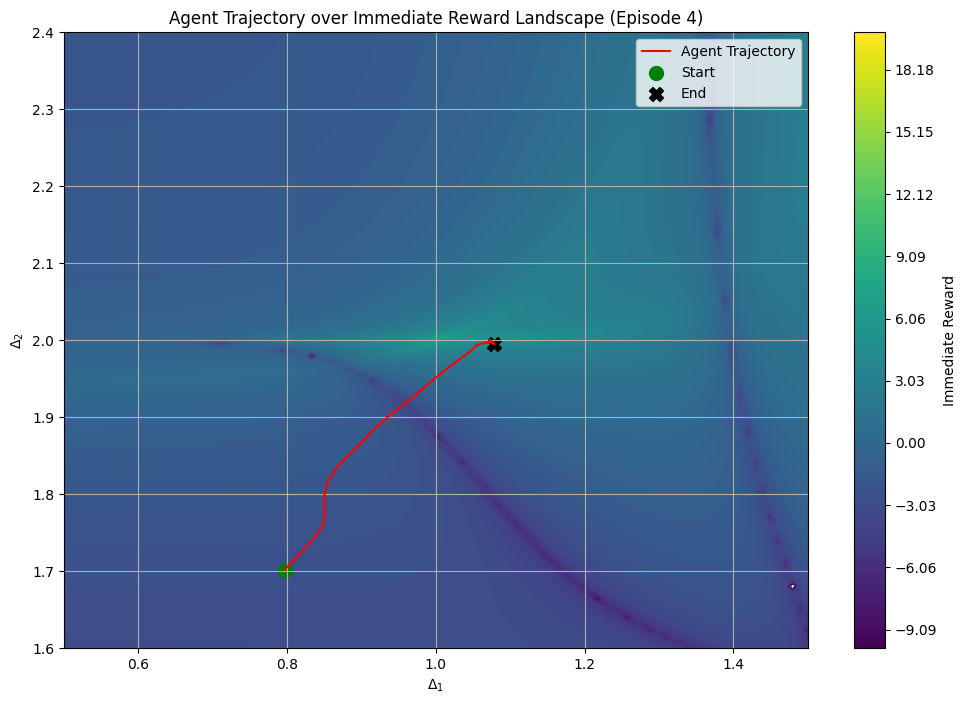

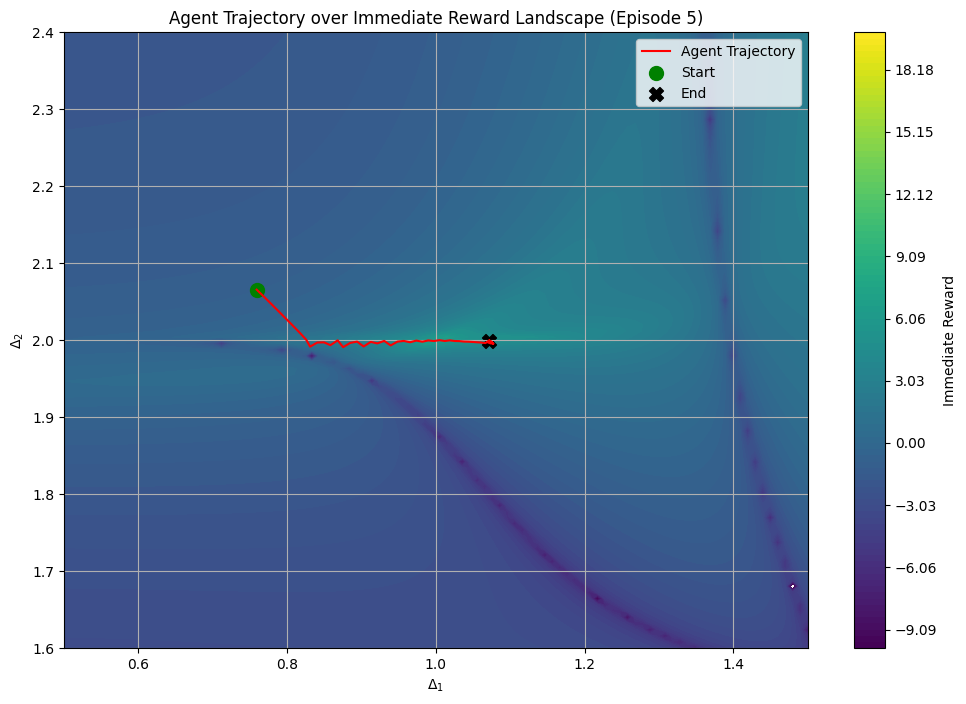

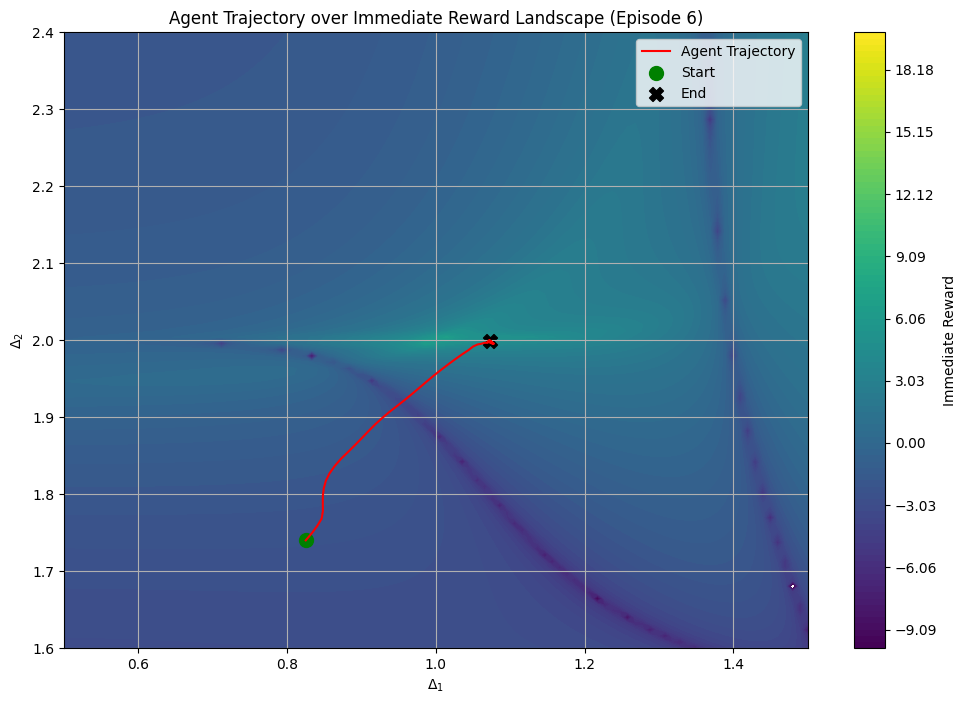

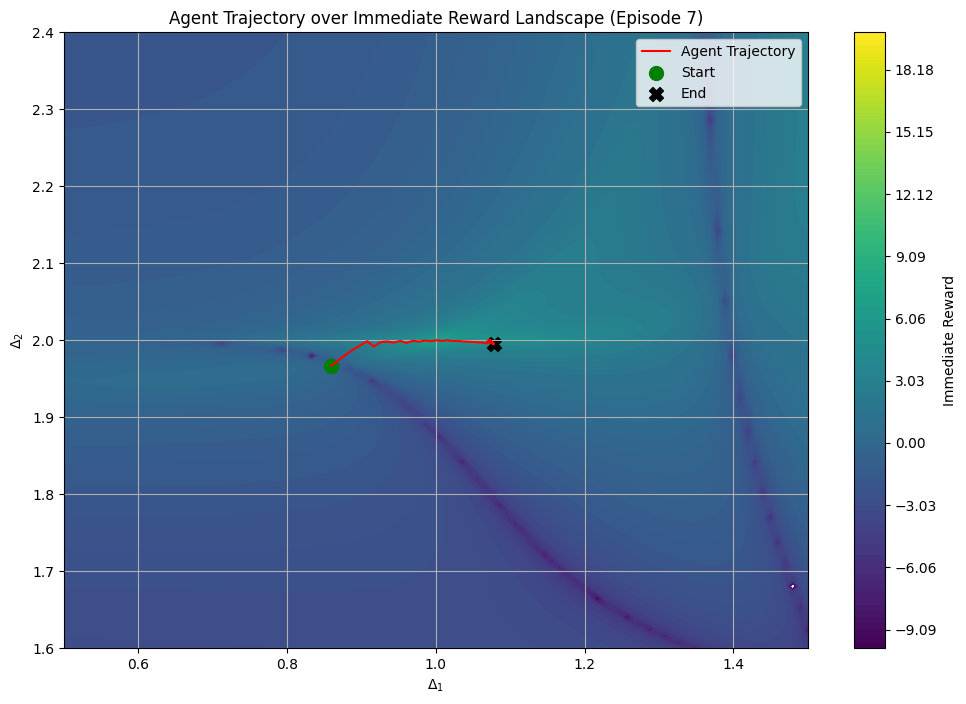

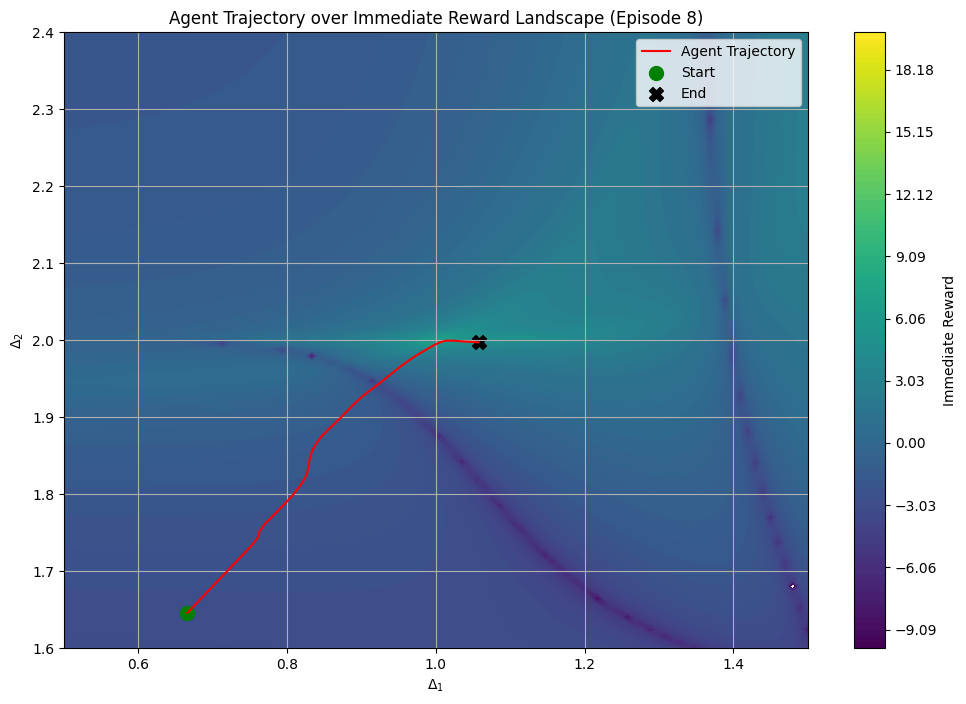

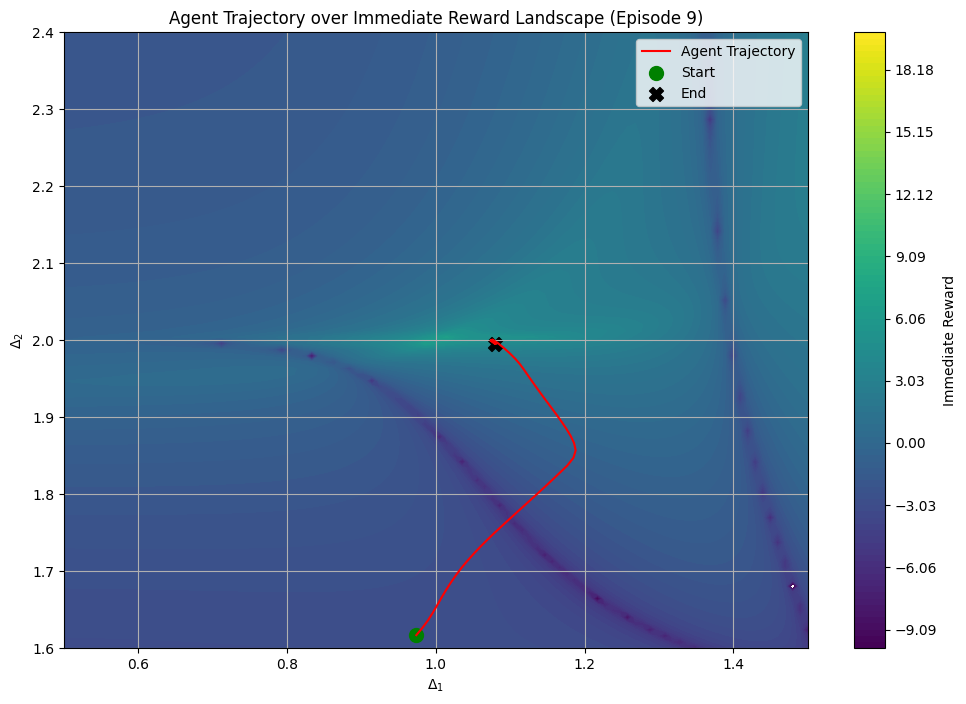

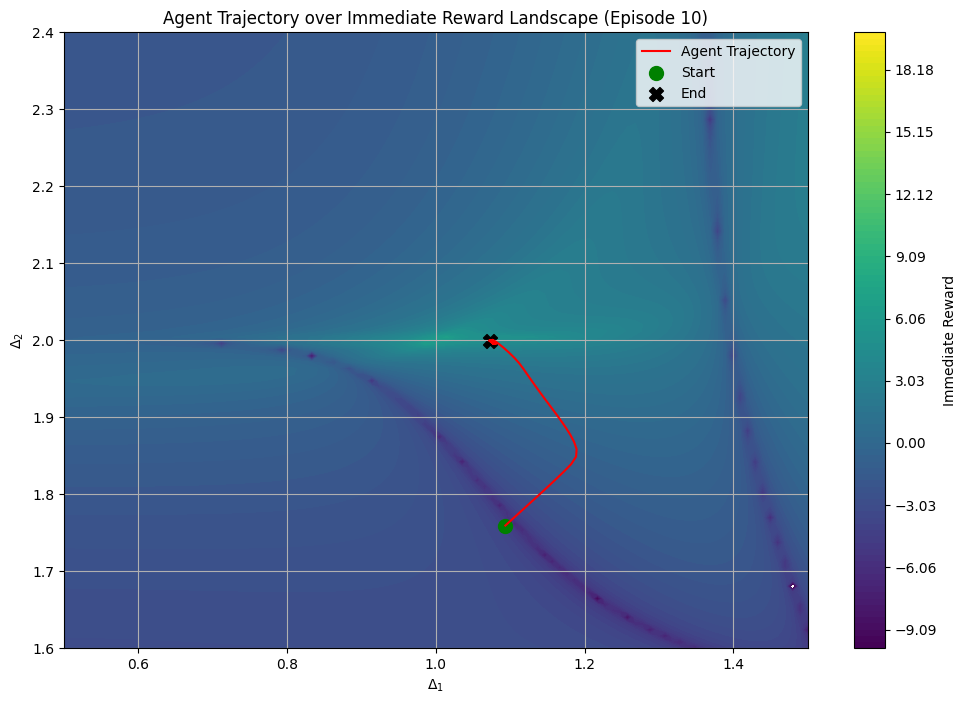

In [90]:
# Plotting the trajectory over the reward landscape
for idx, traj in enumerate(trajectories):
    plt.figure(figsize=(12, 8))
    contour = plt.contourf(delta1_grid, delta2_grid, immediate_reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
    plt.colorbar(contour, label='Immediate Reward')
    plt.plot(traj['delta1'], traj['delta2'],  linestyle='-', color='red', label='Agent Trajectory')
    # Mark the initial point
    plt.scatter(traj['delta1'][0], traj['delta2'][0], color='green', s=100, marker='o', label='Start')
    
    # Mark the final point
    plt.scatter(traj['delta1'][-1], traj['delta2'][-1], color='black', s=100, marker='X', label='End')

    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title(f'Agent Trajectory over Immediate Reward Landscape (Episode {idx + 1})')
    plt.legend()
    plt.grid(True)
    plt.show()

In [91]:
env = StandardDeviationEnv(improvement_reward_weight=100,delta_lr=0.01)

# Load the trained model
model = PPO.load("ppo_standard_deviation")



# Number of evaluation episodes
num_episodes = 10  # You can increase this number to record multiple episodes

# Initialize a list to store trajectories
trajectories = []

for episode in range(num_episodes):
    observation = env.reset()
    done = False
    trajectory = {'delta1': [], 'delta2': [], 'reward': []}
    total_reward = 0.0
    while not done:
        # Record delta1 and delta2 before taking the action
        delta1 = env.delta1
        delta2 = env.delta2
        trajectory['delta1'].append(delta1)
        trajectory['delta2'].append(delta2)
        
        # Agent selects action
        action, _ = model.predict(observation, deterministic=True)
        
        # Environment steps
        observation, reward, done, info = env.step(action)
        total_reward += reward
        
        # Record reward (optional)
        trajectory['reward'].append(reward)
        
    trajectories.append(trajectory)
    print(f"Episode {episode + 1} finished with total reward: {total_reward}")


Episode 1 finished with total reward: 413.2196984594942
Episode 2 finished with total reward: 644.7214415758792
Episode 3 finished with total reward: 333.40416814160164
Episode 4 finished with total reward: 233.40620942243905
Episode 5 finished with total reward: 210.08137742075237
Episode 6 finished with total reward: 155.89478510181826
Episode 7 finished with total reward: 26.998304470232654
Episode 8 finished with total reward: 163.14671894922918
Episode 9 finished with total reward: -72.82791090555936
Episode 10 finished with total reward: 169.82837808370763


In [92]:
# Compute the immediate reward grid for plotting
delta1_values = np.linspace(env.min_delta1, env.max_delta1, 100)
delta2_values = np.linspace(env.min_delta2, env.max_delta2, 100)
delta1_grid, delta2_grid = np.meshgrid(delta1_values, delta2_values)
immediate_reward_grid = np.zeros_like(delta1_grid)

epsilon = 1e-8

print("Computing immediate rewards over the delta plane...")
for i in range(delta1_grid.shape[0]):
    for j in range(delta1_grid.shape[1]):
        delta1 = delta1_grid[i, j]
        delta2 = delta2_grid[i, j]

        # Compute reward using the environment's compute_reward function
        reward = env.compute_reward(delta1, delta2)
        immediate_reward_grid[i, j] = reward

# Set the desired min and max reward values for consistent color mapping
min_reward = -50
max_reward = 50
immediate_reward_grid = np.clip(immediate_reward_grid, min_reward, max_reward)




Computing immediate rewards over the delta plane...


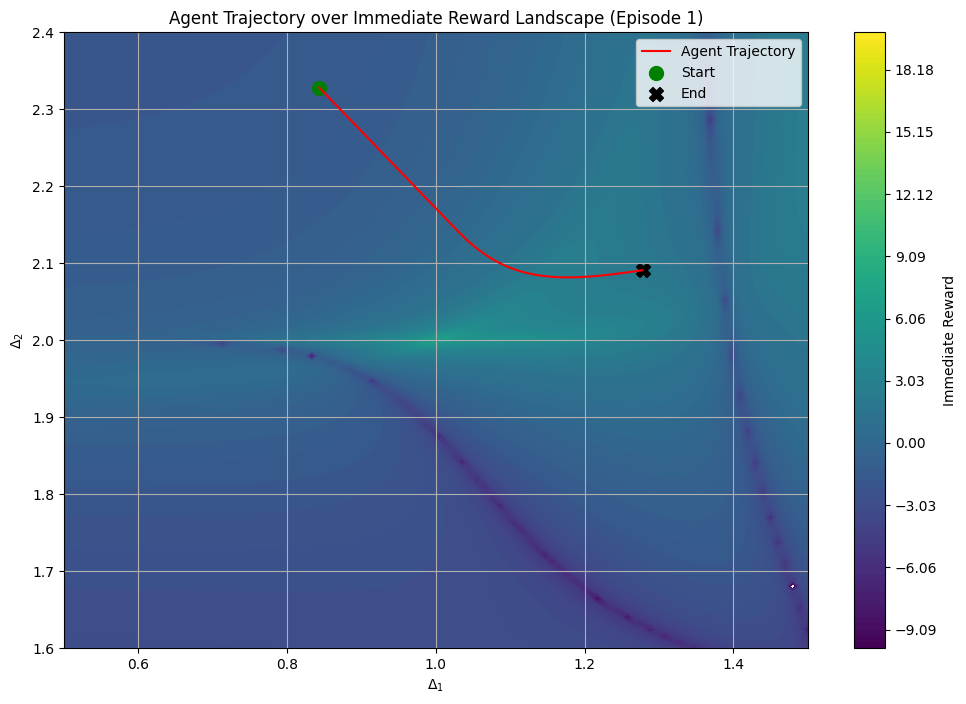

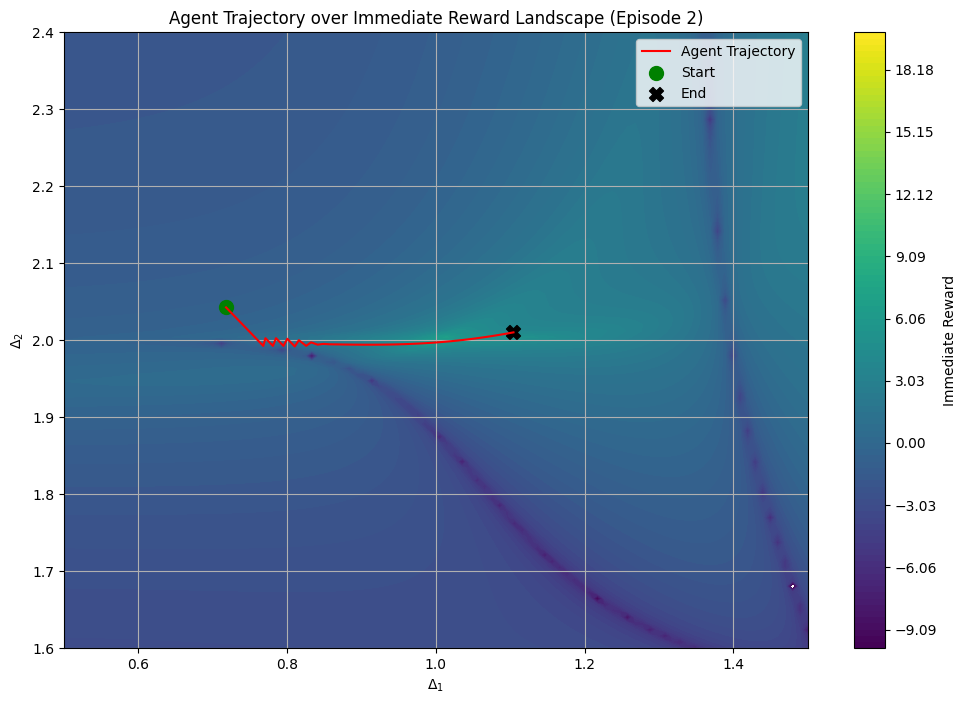

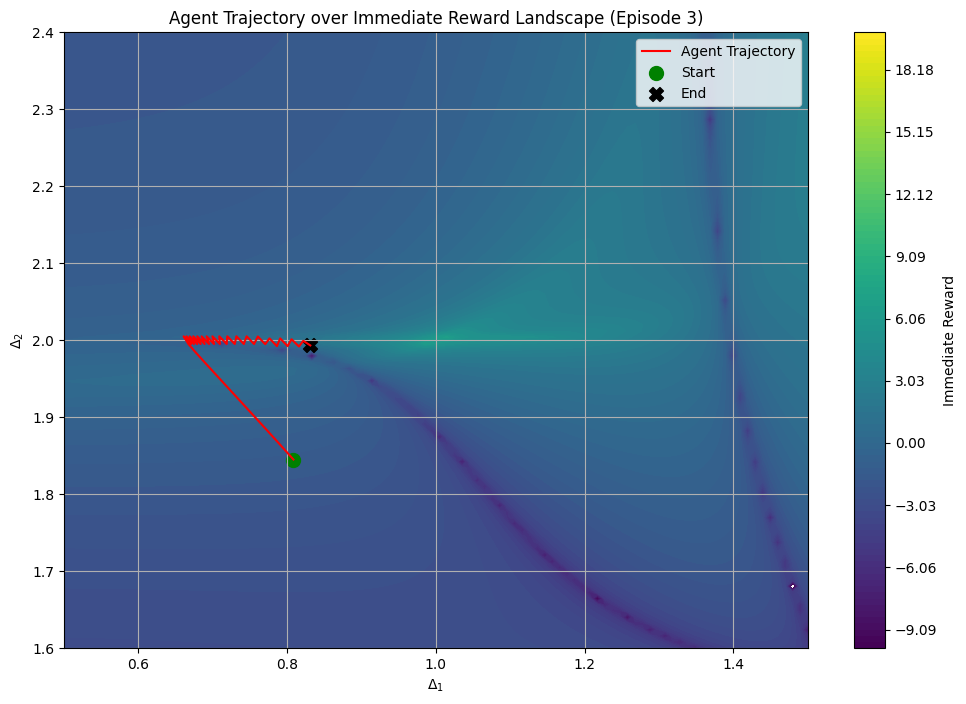

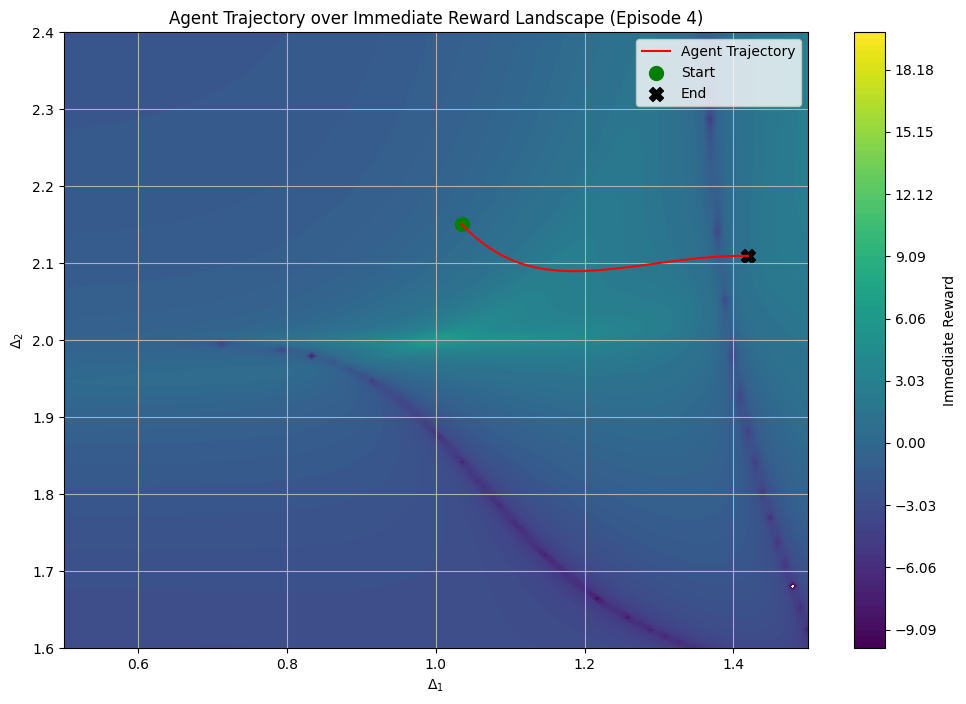

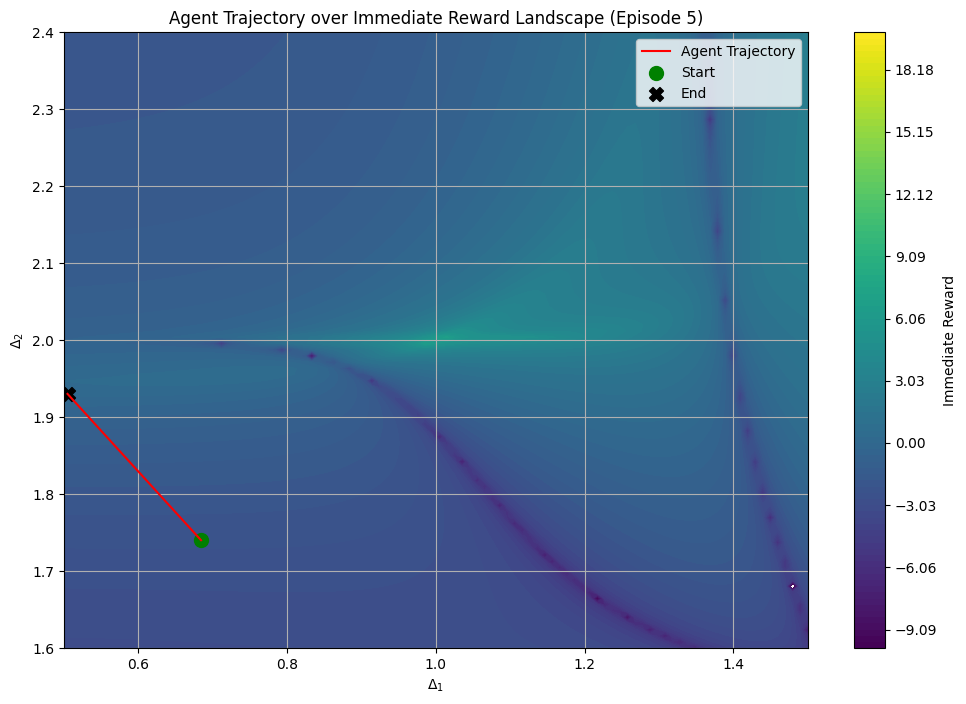

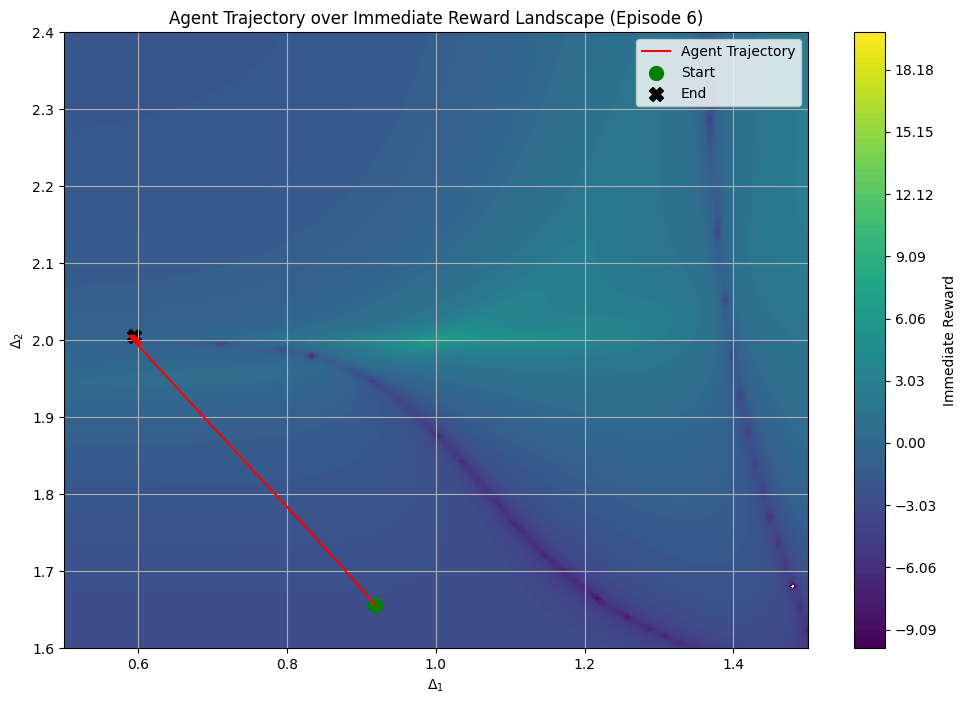

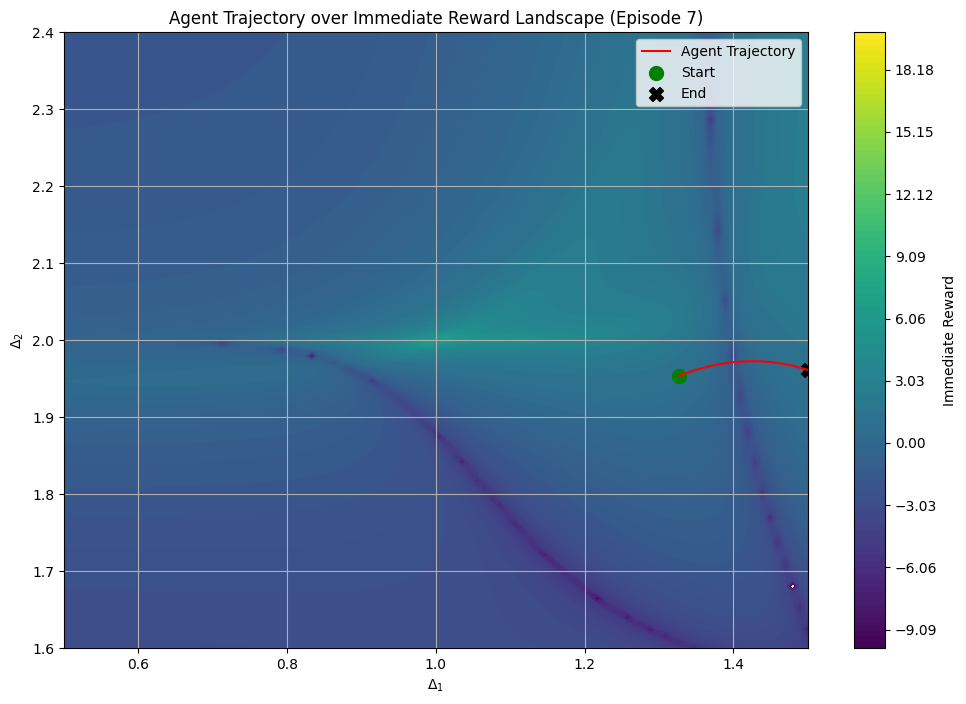

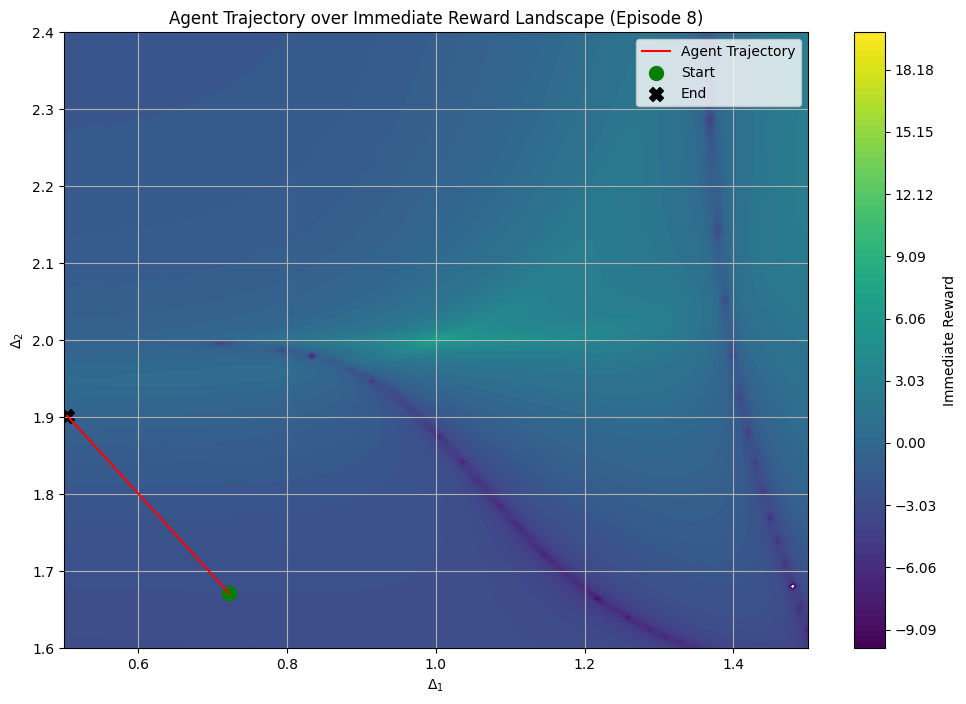

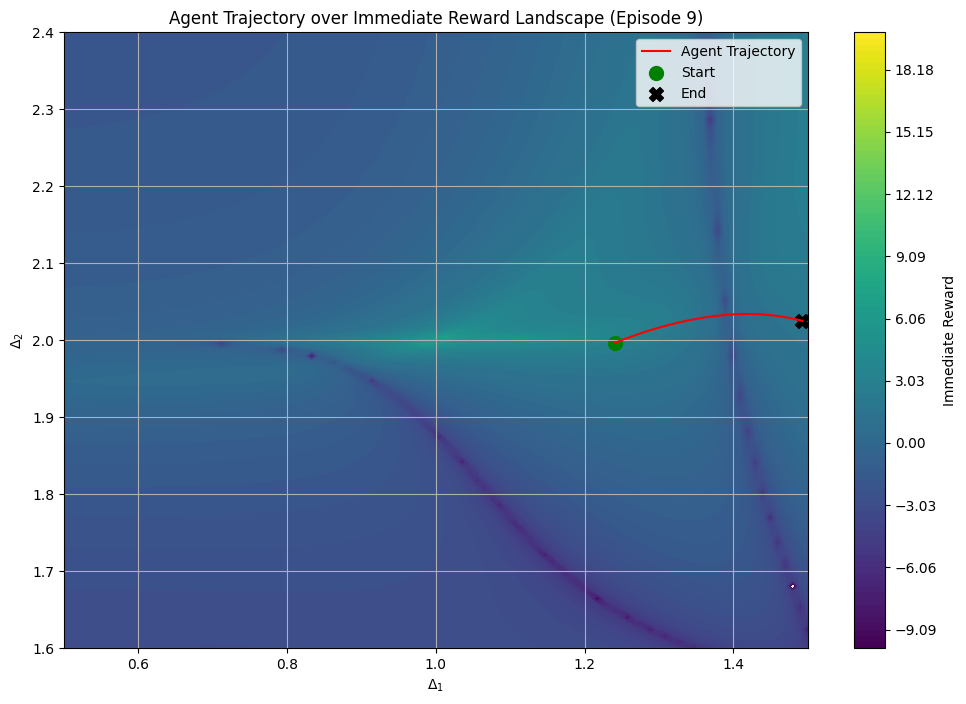

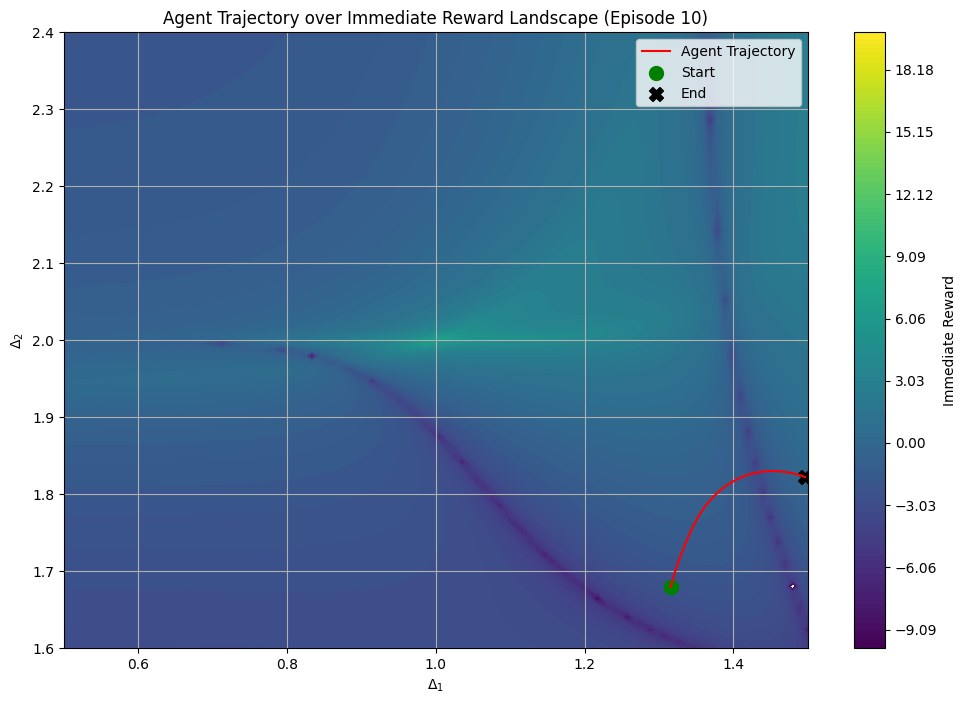

In [93]:
# Plotting the trajectory over the reward landscape
for idx, traj in enumerate(trajectories):
    plt.figure(figsize=(12, 8))
    contour = plt.contourf(delta1_grid, delta2_grid, immediate_reward_grid, levels=np.linspace(-10, 20, 100), cmap='viridis')
    plt.colorbar(contour, label='Immediate Reward')
    plt.plot(traj['delta1'], traj['delta2'],  linestyle='-', color='red', label='Agent Trajectory')
    # Mark the initial point
    plt.scatter(traj['delta1'][0], traj['delta2'][0], color='green', s=100, marker='o', label='Start')
    
    # Mark the final point
    plt.scatter(traj['delta1'][-1], traj['delta2'][-1], color='black', s=100, marker='X', label='End')

    plt.xlabel(r'$\Delta_1$')
    plt.ylabel(r'$\Delta_2$')
    plt.title(f'Agent Trajectory over Immediate Reward Landscape (Episode {idx + 1})')
    plt.legend()
    plt.grid(True)
    plt.show()